---
---


# Credit Card Fraud Prediction
* Author: Selman Karaosmanoglu - Data Scientist
* LinkedIn: https://linkedin.com/in/selmank1
* GitHub: https://github.com/fermiyon

# #Determines
The datasets contains transactions made by credit cards in September 2013 by european cardholders. This dataset presents transactions that occurred in two days, where it has **492 frauds** out of **284,807** transactions. The dataset is **highly unbalanced**, the positive class (frauds) account for 0.172% of all transactions.

**Feature Information:**

**Time**: This feature is contains the seconds elapsed between each transaction and the first transaction in the dataset.

**Amount**:  This feature is the transaction Amount, can be used for example-dependant cost-senstive learning.

**Class**: This feature is the target variable and it takes value 1 in case of fraud and 0 otherwise.

---

The aim of this project is to predict whether a credit card transaction is fraudulent. Of course, this is not easy to do.

---
---


# #Tasks

#### 1. Exploratory Data Analysis & Data Cleaning

- Import Modules, Load Data & Data Review
- Apply data integrity checks
- Exploratory Data Analysis
- Data Cleaning
    
#### 2. Data Preprocessing

- Train - Test Split
- Train - Test Split Validation Checks
- Scaling

#### 3. Model Building

- Logistic Regression
- SVC
- Random Forest Classifier
- XGBoost Classifier
- LightGBM Classifier
- MLP Classifier
- HistGradientBooster Classifier
- Neural Network
- Autoencoder

#### 4. Model Deployement

- Save and Export the Best Model
- Save and Export Variables




---
---


In [ ]:
!pip install cmcrameri
import sys
!{sys.executable} -m pip install deepchecks -U --quiet
!pip install flaml
# !pip install umap-learn
!pip install tensorflow-addons
!pip install tabtransformertf
!pip install livelossplot
!pip install shap
!pip install optuna

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"
!pip install imbalance-xgboost

In [2]:
!nvidia-smi

Wed Jul 19 16:56:40 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0


In [ ]:
!pip install cudf-cu11 cuml-cu11 --extra-index-url=https://pypi.nvidia.com

## 1. Exploratory Data Analysis & Data Cleaning

### Import Modules, Load Data & Data Review

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
import plotly.graph_objects as go
import cufflinks as cf
from termcolor import colored

# Scientific color palette
import cmcrameri.cm as cmc

# Plotly offline mode for local interactive plotting
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()

# Enable inline plotting
%matplotlib inline

# Data preprocessing and evaluation
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, PowerTransformer
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate, cross_val_score, StratifiedKFold
from sklearn.compose import make_column_transformer, ColumnTransformer
from sklearn.preprocessing import FunctionTransformer
from sklearn.metrics import (
    PrecisionRecallDisplay, average_precision_score, RocCurveDisplay, f1_score, recall_score,
    precision_score, confusion_matrix, classification_report, precision_recall_curve,
    matthews_corrcoef, make_scorer
)

from sklearn.base import BaseEstimator,TransformerMixin
from sklearn.pipeline import Pipeline

# Machine learning algorithms
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, HistGradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
import lightgbm as lgb
from lightgbm import LGBMClassifier
from imxgboost.imbalance_xgb import imbalance_xgboost as imb_xgb

# Dimensionality reduction techniques
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Deepchecks library for model evaluation
from deepchecks.tabular.suites import model_evaluation, data_integrity, train_test_validation
from deepchecks.tabular import Dataset

# Imbalanced data handling
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline as imbpipeline
from imblearn.pipeline import make_pipeline

# FLAML library for AutoML
from flaml import AutoML, tune

# Deep learning libraries
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, BatchNormalization, ActivityRegularization
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam
import tensorflow_addons as tfa
from tabtransformertf.models.tabtransformer import TabTransformer
from tabtransformertf.utils.preprocessing import df_to_dataset, build_categorical_prep
from livelossplot import PlotLossesKerasTF

# SHAP library for model interpretability
import shap

# Optuna for hyperparameter optimization
import optuna

# RAPIDS libraries for GPU acceleration
import cudf
import cupy as cp
import cuml
from cuml.ensemble import RandomForestClassifier
from cuml.preprocessing import PowerTransformer as PowerTransformerGPU
from cuml.compose import ColumnTransformer as ColumnTransformerGPU

# Display options
pd.set_option('display.max_columns', 50)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Suppress warnings
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")


/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning:



TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 




In [6]:
# read the data
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
# df = pd.read_csv('creditcard.csv')
df = pd.read_csv('/content/drive/MyDrive/fraud-detection/creditcard.csv')

In [8]:
# create a deep copy
df0 = df.copy()

In [9]:
df.head(3)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.000,-1.360,-0.073,2.536,1.378,-0.338,0.462,0.240,0.099,0.364,0.091,-0.552,-0.618,-0.991,-0.311,1.468,-0.470,0.208,0.026,0.404,0.251,-0.018,0.278,-0.110,0.067,0.129,-0.189,0.134,-0.021,149.620,0
1,0.000,1.192,0.266,0.166,0.448,0.060,-0.082,-0.079,0.085,-0.255,-0.167,1.613,1.065,0.489,-0.144,0.636,0.464,-0.115,-0.183,-0.146,-0.069,-0.226,-0.639,0.101,-0.340,0.167,0.126,-0.009,0.015,2.690,0
2,1.000,-1.358,-1.340,1.773,0.380,-0.503,1.800,0.791,0.248,-1.515,0.208,0.625,0.066,0.717,-0.166,2.346,-2.890,1.110,-0.121,-2.262,0.525,0.248,0.772,0.909,-0.689,-0.328,-0.139,-0.055,-0.060,378.660,0


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

In [25]:
target = 'Class'

In [11]:
df.duplicated().sum()

1081

In [12]:
df.shape

(284807, 31)

In [13]:
df.drop_duplicates(inplace=True)

In [14]:
df.reset_index(drop=True,inplace=True)

In [15]:
df.shape

(283726, 31)

In [ ]:
# When we look at the mean and the std of the columns, It has been seen that, the data has been scaled except Time and Amount columns
df.describe().T.round(2).style.background_gradient(subset = ['mean','min','50%', 'max'], cmap = 'cmc.batlow_r')

,count,mean,std,min,25%,50%,75%,max
Time,283726.000000,94811.080000,47481.050000,0.000000,54204.750000,84692.500000,139298.000000,172792.000000
V1,283726.000000,0.010000,1.950000,-56.410000,-0.920000,0.020000,1.320000,2.450000
V2,283726.000000,-0.000000,1.650000,-72.720000,-0.600000,0.060000,0.800000,22.060000
V3,283726.000000,0.000000,1.510000,-48.330000,-0.890000,0.180000,1.030000,9.380000
V4,283726.000000,-0.000000,1.410000,-5.680000,-0.850000,-0.020000,0.740000,16.880000
V5,283726.000000,0.000000,1.380000,-113.740000,-0.690000,-0.050000,0.610000,34.800000
V6,283726.000000,-0.000000,1.330000,-26.160000,-0.770000,-0.280000,0.400000,73.300000
V7,283726.000000,0.000000,1.230000,-43.560000,-0.550000,0.040000,0.570000,120.590000
V8,283726.000000,-0.000000,1.180000,-73.220000,-0.210000,0.020000,0.330000,20.010000
V9,283726.000000,-0.000000,1.100000,-13.430000,-0.640000,-0.050000,0.600000,15.590000


In [ ]:
non_fraud = df[df[target] == 0]
non_fraud.describe().T.round(2).style.background_gradient(subset = ['mean','min','50%', 'max'], cmap = 'cmc.batlow_r')

,count,mean,std,min,25%,50%,75%,max
Time,283253.000000,94835.060000,47475.550000,0.000000,54233.000000,84711.000000,139308.000000,172792.000000
V1,283253.000000,0.010000,1.920000,-56.410000,-0.910000,0.020000,1.320000,2.450000
V2,283253.000000,-0.010000,1.630000,-72.720000,-0.600000,0.060000,0.800000,18.900000
V3,283253.000000,0.010000,1.460000,-48.330000,-0.880000,0.180000,1.030000,9.380000
V4,283253.000000,-0.010000,1.400000,-5.680000,-0.850000,-0.020000,0.730000,16.880000
V5,283253.000000,0.010000,1.360000,-113.740000,-0.690000,-0.050000,0.610000,34.800000
V6,283253.000000,0.000000,1.330000,-26.160000,-0.770000,-0.270000,0.400000,73.300000
V7,283253.000000,0.010000,1.180000,-31.760000,-0.550000,0.040000,0.570000,120.590000
V8,283253.000000,-0.000000,1.160000,-73.220000,-0.210000,0.020000,0.320000,18.710000
V9,283253.000000,0.000000,1.090000,-6.290000,-0.640000,-0.050000,0.600000,15.590000


In [ ]:
fraud = df[df[target] == 1]
fraud.describe().T.round(2).style.background_gradient(subset = ['mean','min','50%', 'max'], cmap = 'cmc.batlow_r')

,count,mean,std,min,25%,50%,75%,max
Time,473.000000,80450.510000,48636.180000,406.000000,41203.000000,73408.000000,129095.000000,170348.000000
V1,473.000000,-4.500000,6.590000,-30.550000,-5.600000,-2.270000,-0.360000,2.130000
V2,473.000000,3.410000,4.120000,-8.400000,1.150000,2.620000,4.570000,22.060000
V3,473.000000,-6.730000,6.910000,-31.100000,-7.930000,-4.880000,-2.170000,2.250000
V4,473.000000,4.470000,2.870000,-1.310000,2.290000,4.100000,6.290000,12.110000
V5,473.000000,-2.960000,5.280000,-22.110000,-4.280000,-1.370000,0.260000,11.100000
V6,473.000000,-1.430000,1.720000,-6.410000,-2.450000,-1.420000,-0.410000,6.470000
V7,473.000000,-5.180000,6.860000,-43.560000,-6.990000,-2.900000,-0.910000,5.800000
V8,473.000000,0.950000,5.590000,-41.040000,-0.160000,0.620000,1.710000,20.010000
V9,473.000000,-2.520000,2.470000,-13.430000,-3.800000,-2.100000,-0.790000,3.350000


In [ ]:
# Looking at one sample from dataset
df.sample(1).T

,266478
Time,162781.000
V1,1.932
V2,-0.594
V3,-0.508
V4,0.417
V5,-0.587
V6,-0.051
V7,-0.709
V8,0.111
V9,1.616


## Apply Data Integrity Checks
* link: https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_data_integrity.html

In [ ]:
ds = Dataset(df, cat_features= [], datetime_name='Time', label= target)

# Run Suite:
integ_suite = data_integrity()
suite_result = integ_suite.run(ds)

# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json using suite_result.to_json()
suite_result.show()

<!--
 ~ ----------------------------------------------------------------------------
 ~ Copyright (C) 2021-2023 Deepchecks (https://www.deepchecks.com)
 ~
 ~ This file is part of Deepchecks.
 ~ Deepchecks is distributed under the terms of the GNU Affero General
 ~ Public License (version 3 or later).
 ~ You should have received a copy of the GNU Affero General Public License
 ~ along with Deepchecks. If not, see .
 ~ ----------------------------------------------------------------------------
 ~
-->
<!DOCTYPE html>
 
 
 
 Data Integrity Suite

According to Deepchecks Data Integrity suite:
- There is no multicollinearity problem.
- v17, v14, v10, v4 and v11 are the highest correlated features with the label. However this doesn't reflect the feature importance, it must be probed model by model basis.

### Exploratory Data Analysis

#### Target and Feature-Target examination

0   0.998
1   0.002
Name: Class, dtype: float64

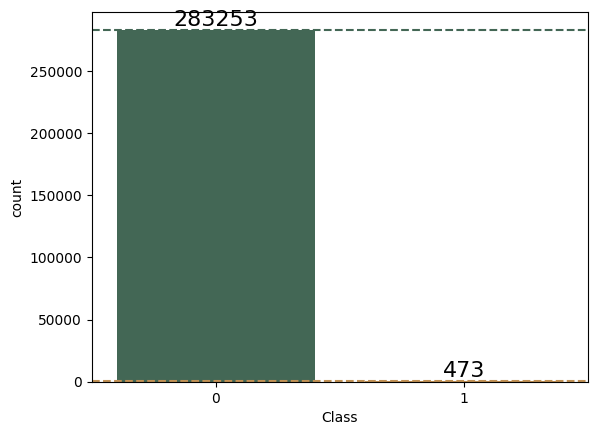

In [ ]:
# visualize the distribution of the classes for target feature
display(df.Class.value_counts(normalize=True))

ax = sns.countplot(x=df["Class"], palette = 'cmc.batlow')
ax.bar_label(ax.containers[0], size=16)

# Add dashed lines for each class count
colors = [patch.get_facecolor() for patch in ax.patches]
plt.axhline(y=df.Class.value_counts()[1], color=colors[1], linestyle='--')
plt.axhline(y=df.Class.value_counts()[0], color=colors[0], linestyle='--');



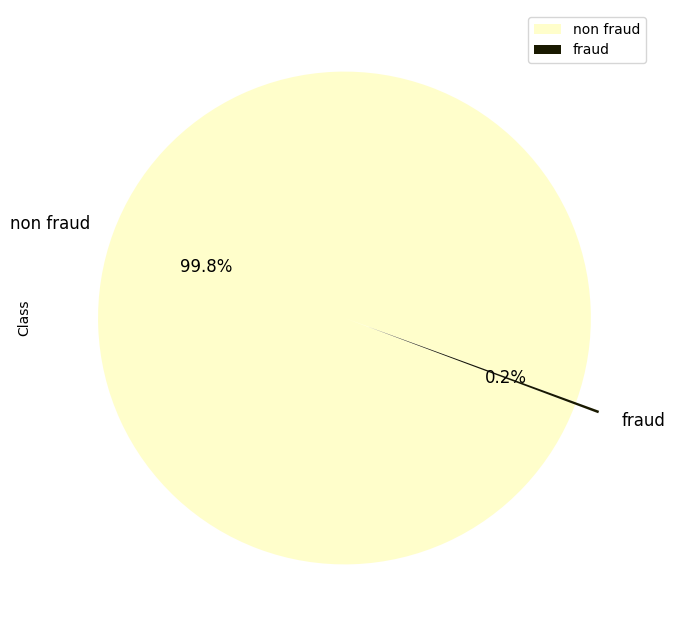

In [ ]:
# Visualise the percentage of distribution in the target feature

plt.figure(figsize=(15, 8))
df[target].value_counts().plot(kind='pie', cmap = cmc.lajolla_r, labels=['non fraud','fraud'], autopct='%.1f%%',textprops={'color':"black", 'fontsize':12},explode=(0, 0.1), startangle = -20, legend=True);

# the data is severely imbalanced.

##### Is there a statistically significant difference in average values of the features between the two groups?

In [ ]:
df.groupby(target).mean()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
Class,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,94835.058,0.013,-0.010,0.013,-0.010,0.007,0.001,0.010,-0.002,0.003,0.008,-0.006,0.009,0.001,0.012,0.001,0.008,0.011,0.005,-0.001,-0.000,-0.001,-0.000,0.000,0.000,-0.000,0.000,0.001,0.000,88.414
1,80450.514,-4.498,3.406,-6.730,4.473,-2.957,-1.433,-5.176,0.953,-2.522,-5.453,3.716,-6.103,-0.094,-6.836,-0.073,-4.001,-6.463,-2.157,0.669,0.405,0.467,0.087,-0.096,-0.107,0.041,0.050,0.214,0.078,123.872


When we examine the amount column, we observe a difference between the average values of the fraud group (123.87) and the non-fraud group (88.41). According to the Mann-Whitney U test done below, there is a significant difference in average values between the two groups for the 'Amount' column, with a significance level (p-value) below 0.05.

In [ ]:
import pandas as pd
import scipy.stats as stats

# Select numerical columns
numerical_columns = df.select_dtypes('number').columns

# Perform statistical tests for each numerical column
for column in numerical_columns:
    first_group = df.loc[df[target] == 1, column]
    second_group = df.loc[df[target] == 0, column]

    # Determine the appropriate statistical test based on data distribution
    if stats.normaltest(df[column])[1] < 0.05:
        # Data is not normally distributed, perform Mann-Whitney U test
        statistic, p_value = stats.mannwhitneyu(first_group, second_group)
        test_name = "Mann-Whitney U test"
    else:
        # Data is normally distributed, perform t-test
        statistic, p_value = stats.ttest_ind(first_group, second_group)
        test_name = "t-test"

    # Display the results
    print(f"Statistical test for column '{column}':")
    print(f"{test_name} - statistic: {statistic:.4f}, p-value: {p_value:.4f}")

    # Interpret the results based on the p-value
    alpha = 0.05
    if p_value < alpha:
        print(f"The p-value ({p_value:.4f}) is less than the significance level of {alpha}")
        print(f"There is a significant difference in average values between the two groups for column '{column}'")
    else:
        print(f"The p-value ({p_value:.4f}) is greater than or equal to the significance level of {alpha}")
        print(f"There is no significant difference in average values between the two groups for column '{column}'")

    print()

Statistical test for column 'Time':
Mann-Whitney U test - statistic: 55697454.0000, p-value: 0.0000
The p-value (0.0000) is less than the significance level of 0.05
There is a significant difference in average values between the two groups for column 'Time'

Statistical test for column 'V1':
Mann-Whitney U test - statistic: 28197486.0000, p-value: 0.0000
The p-value (0.0000) is less than the significance level of 0.05
There is a significant difference in average values between the two groups for column 'V1'

Statistical test for column 'V2':
Mann-Whitney U test - statistic: 113855524.0000, p-value: 0.0000
The p-value (0.0000) is less than the significance level of 0.05
There is a significant difference in average values between the two groups for column 'V2'

Statistical test for column 'V3':
Mann-Whitney U test - statistic: 12240264.0000, p-value: 0.0000
The p-value (0.0000) is less than the significance level of 0.05
There is a significant difference in average values between the two

There is no statistically significant difference in the average values of the features V22, v15, v13. The average values of the other features' difference are statistically significant according to hypotheses tests.

**Mann-Whitney U test; Definition and Usage**

The Mann-Whitney U test, also known as the Wilcoxon rank-sum test, is a non-parametric statistical test used to compare the distributions of two independent samples. It is commonly used when the data does not meet the assumptions of normality required for parametric tests like the t-test.

The Mann-Whitney U test assesses whether there is a significant difference between the medians of the two groups. It works by ranking all the observations from both groups together and calculating the sum of ranks for each group. The test statistic, U, represents the probability that a randomly selected value from one group will be greater than a randomly selected value from the other group.

The Mann-Whitney U test provides a p-value that indicates the likelihood of observing the data if there is no difference between the groups. If the p-value is below a predetermined significance level (e.g., 0.05), it suggests that there is a statistically significant difference between the groups.

It is important to note that the Mann-Whitney U test does not provide information about the direction or magnitude of the difference between the groups. It only determines if there is a significant difference.

The Mann-Whitney U test is particularly useful when working with ordinal or skewed data, or when the assumptions of parametric tests are not met. It is widely used in various fields, including healthcare, social sciences, and business, to compare two groups and determine if they differ significantly.

**T-Test; Definition and Usage**

The t-test is a statistical test used to compare the means of two independent groups and determine if they are significantly different from each other. It is a parametric test that assumes the data follows a normal distribution.

The t-test calculates a t-statistic, which measures the difference between the means of the two groups relative to the variability within each group. The test also considers the sample sizes of the groups and the standard deviations of the data.

There are two main types of t-tests: the independent samples t-test and the paired samples t-test. The independent samples t-test is used when the two groups being compared are independent and have distinct individuals in each group. The paired samples t-test, on the other hand, is used when the two groups represent measurements from the same individuals or matched pairs.

The t-test provides a p-value, which indicates the probability of obtaining the observed difference in means if there is no true difference between the groups. If the p-value is below a predetermined significance level (e.g., 0.05), it suggests that there is a statistically significant difference between the groups.

Check Missing Values and Outliers

In [ ]:
# There is no missing values in the dataset
df.isna().sum().sum()

0

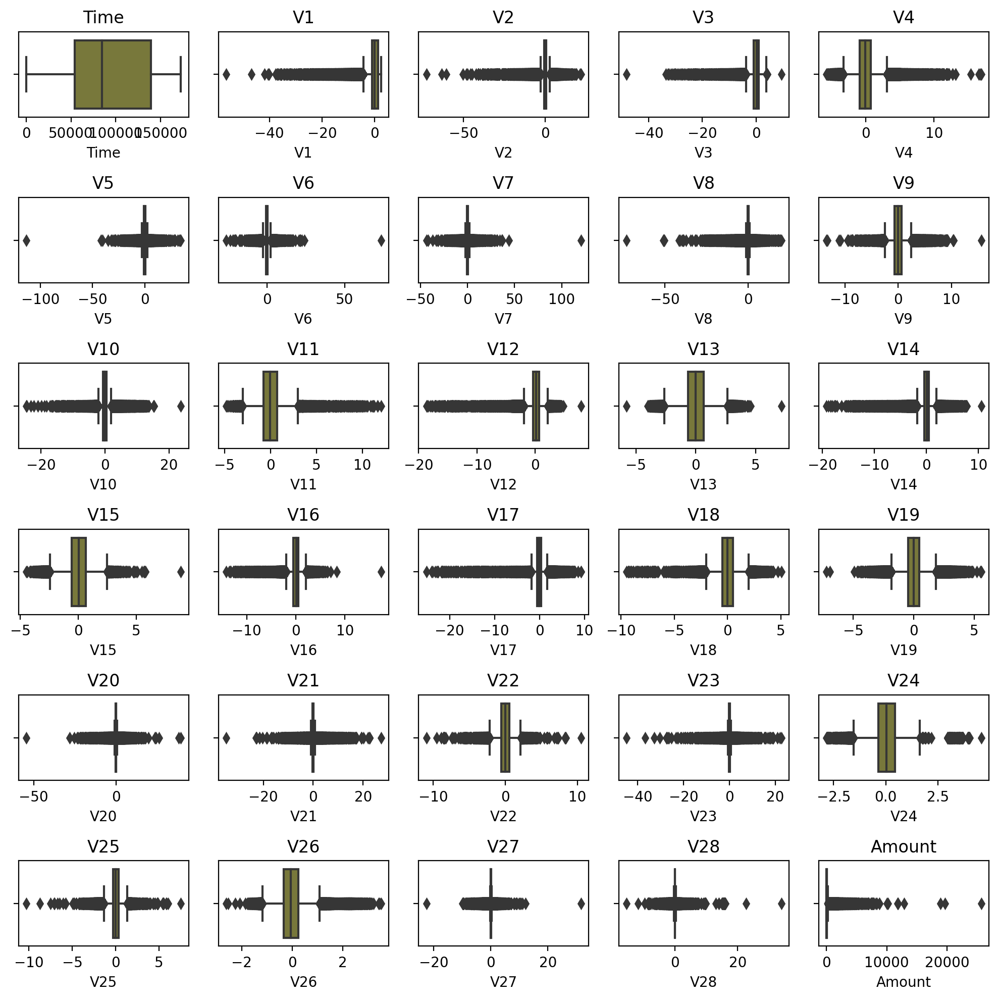

In [ ]:
num_cols = len(df.select_dtypes('number').columns[:-1])
num_rows = np.ceil(num_cols / 5).astype(int)  # Adjust the number of columns per row as needed

fig, axes = plt.subplots(num_rows, 5, figsize=(10, 10), dpi=200)
axes = axes.flatten()

for i, col in enumerate(df.select_dtypes('number').columns[:-1]):
    ax = axes[i]
    sns.boxplot(x=df[col], ax=ax, palette='cmc.batlow')
    ax.set_title(col)

plt.tight_layout()
plt.show()

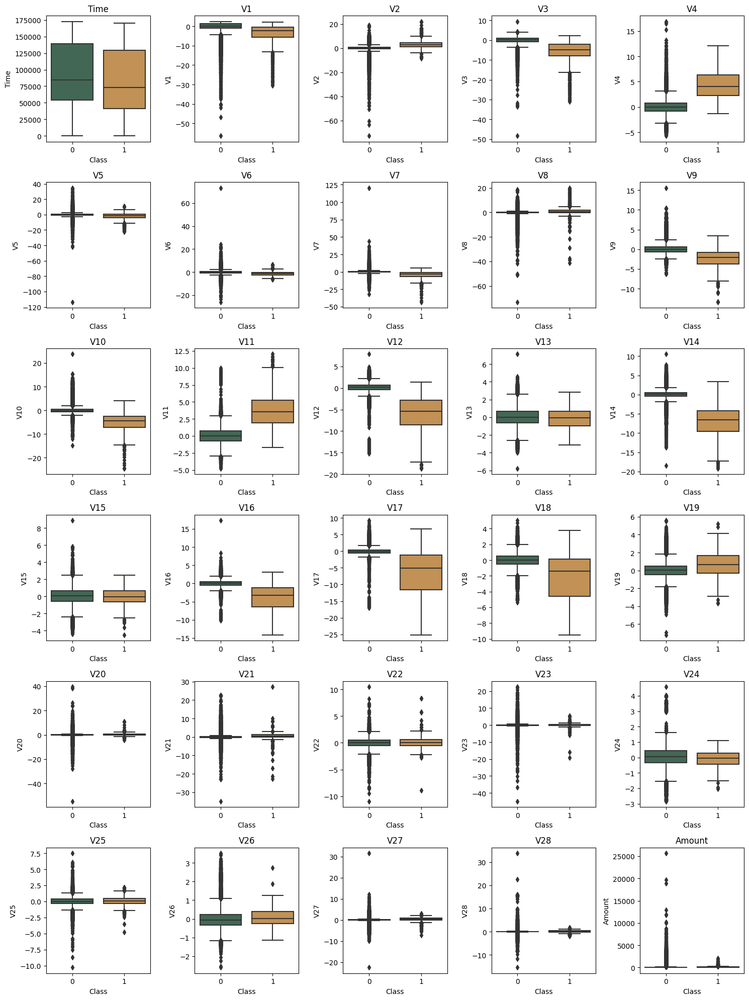

In [ ]:
num_cols = len(df.columns[:-1])
num_rows = np.ceil(num_cols / 5).astype(int)  # Adjust the number of columns per row as needed

fig, axes = plt.subplots(num_rows, 5, figsize=(15, 20))
axes = axes.flatten()

for i, col in enumerate(df.columns[:-1]):
    ax = axes[i]
    sns.boxplot(x="Class", y=col, data=df, palette='cmc.batlow', ax=ax)
    ax.set_title(col)

plt.tight_layout()
plt.show()

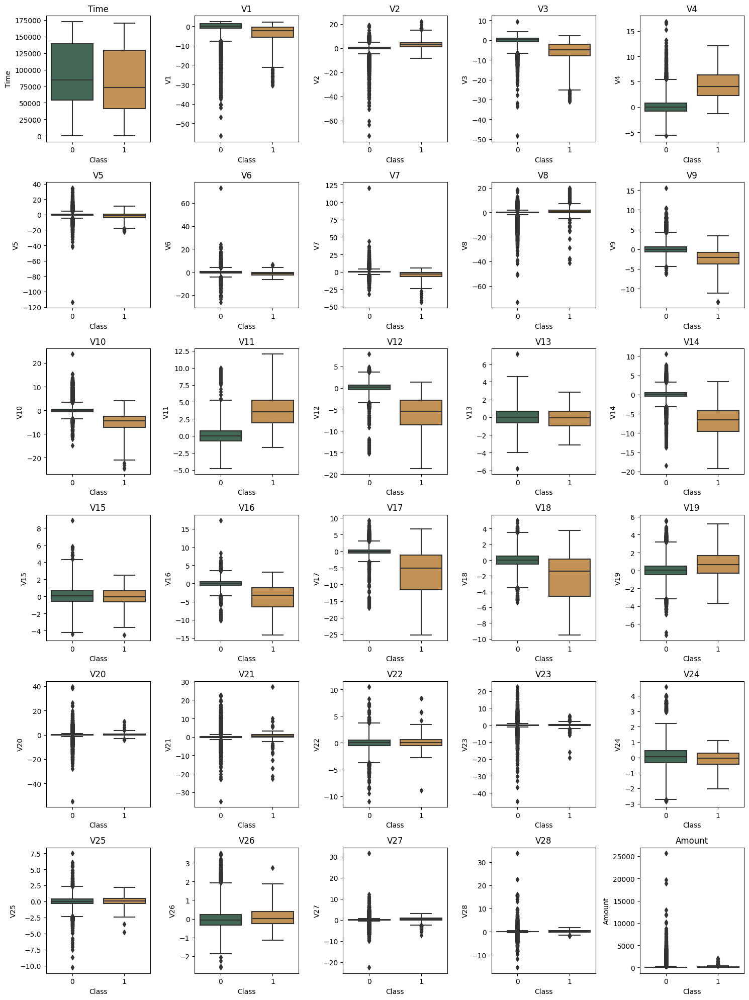

In [ ]:
# box_plot with IQR 3
num_cols = len(df.columns[:-1])
num_rows = np.ceil(num_cols / 5).astype(int)  # Adjust the number of columns per row as needed

fig, axes = plt.subplots(num_rows, 5, figsize=(15, 20))
axes = axes.flatten()

for i, col in enumerate(df.columns[:-1]):
    ax = axes[i]
    sns.boxplot(x="Class", y=col, data=df, palette='cmc.batlow', ax=ax, whis=3)
    ax.set_title(col)

plt.tight_layout()
plt.show()

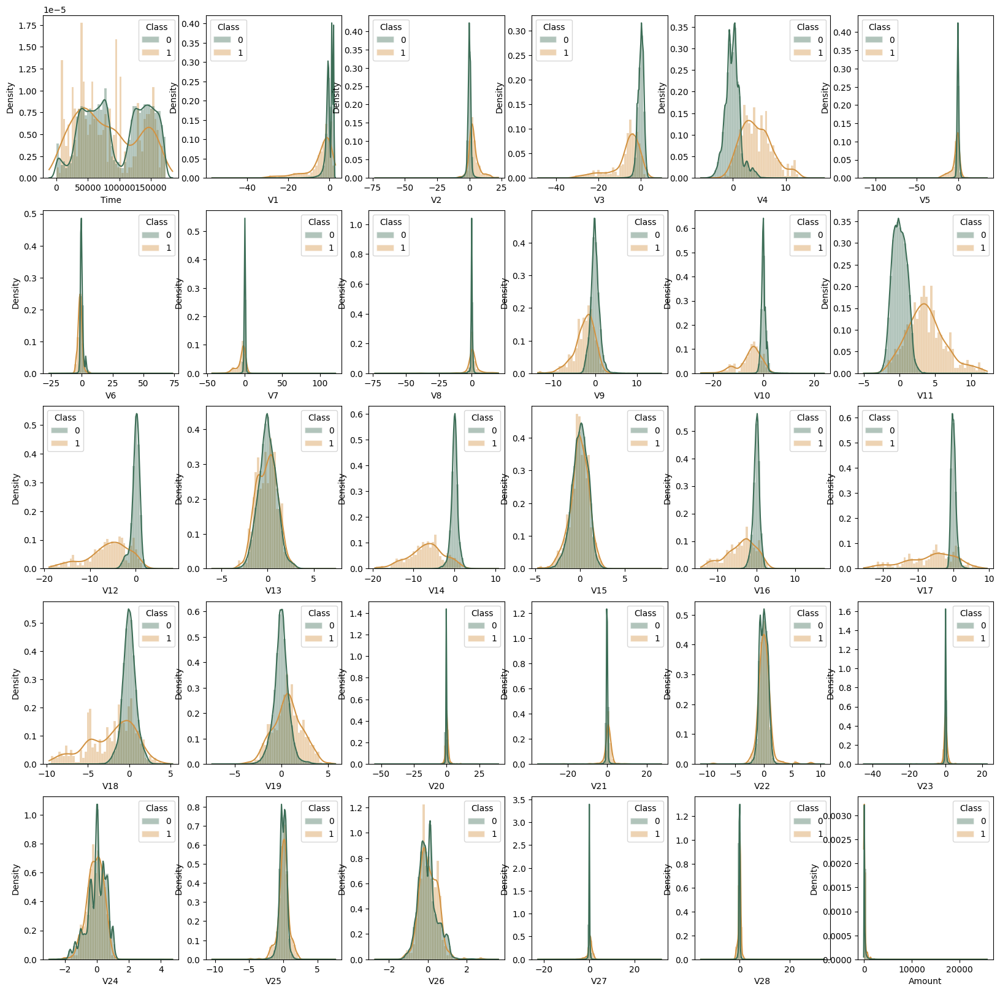

In [ ]:
# a general overview of all numerical features for each class
plt.figure(figsize=(20, 20))
for idx, col in enumerate(df.select_dtypes(include='number').columns[:-1]):
    plt.subplot(5, 6, idx+1)
    sns.histplot(df, x=col, bins=50, hue=target, stat='density', common_norm=False, kde=True, kde_kws=dict(cut=3), alpha=.4, palette='cmc.batlow', edgecolor=(1, 1, 1, .4));


It seems that from the histograms and boxplots,
-the features v4, v11, v14, v17 has seemed to be the most different distribution between the two groups.
-the features v3,v9,v10,v12,v16,v18,v19 also distinguishes.


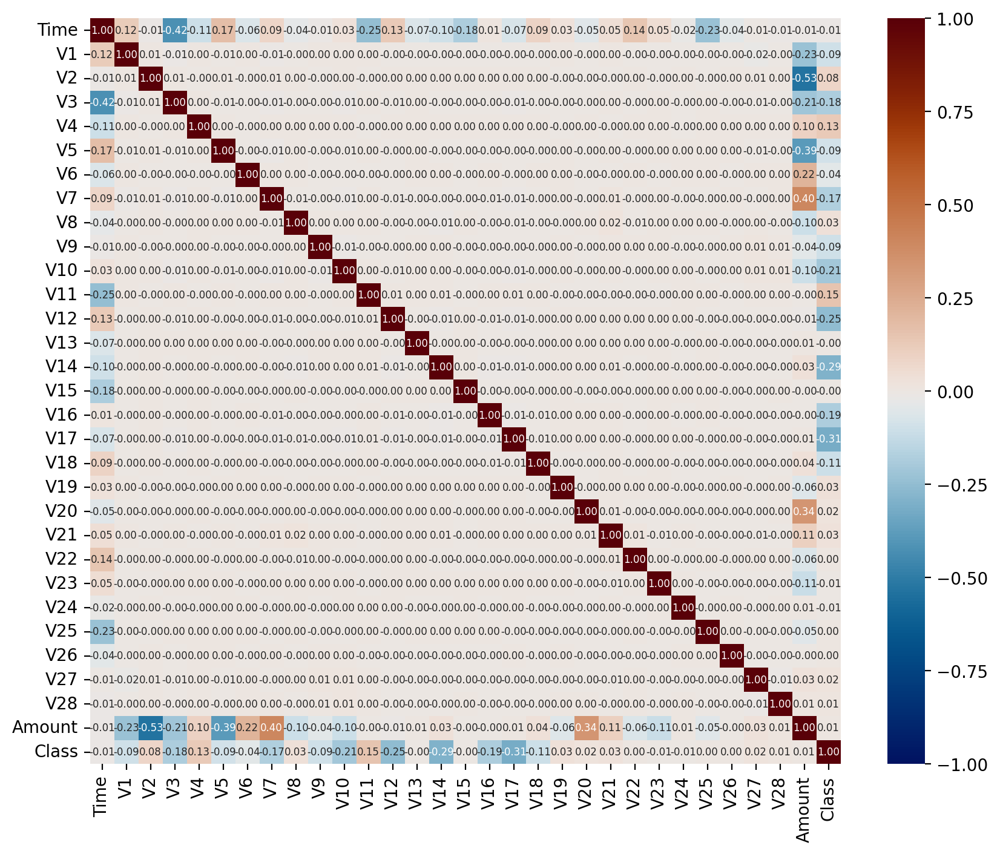

In [ ]:
plt.figure(figsize=(10,8), dpi=200)
sns.heatmap(df.select_dtypes('number').corr(), annot=True, cmap = 'cmc.vik', vmin = -1, vmax = 1, fmt='.2f', annot_kws={'fontsize': 6});

# result:
# no multicolinearity between the features
# Because there are no correlations between v features, it can be deducted that the PCA was applied to the v data and StandardScaler applied beforehand.

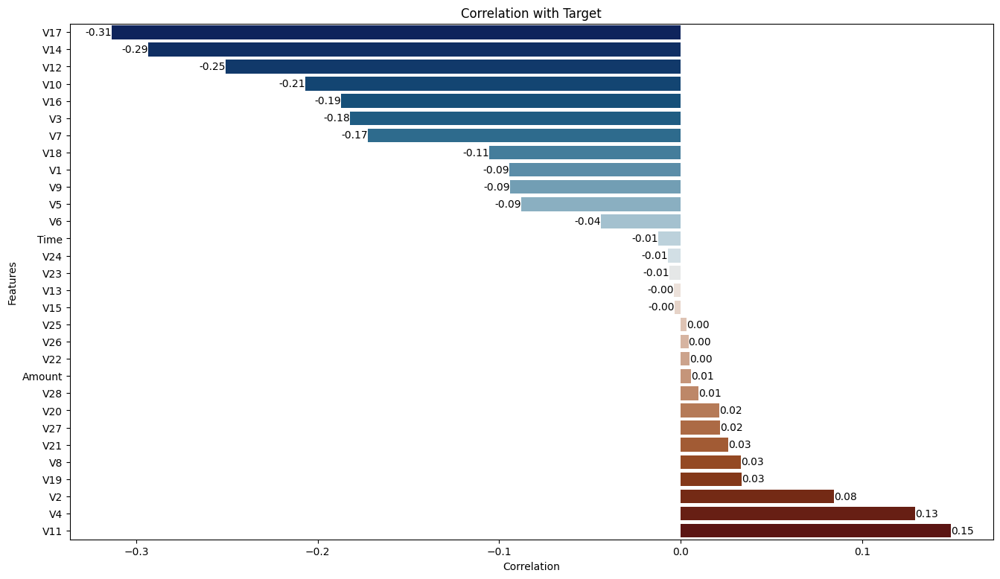

In [ ]:
# Looking at the correlation with the target

# Calculate the correlation matrix
corr_matrix = df.select_dtypes('number').corr()

# Exclude 'Class' from the correlation matrix and sort the values
correlation_values = corr_matrix["Class"].drop("Class").sort_values()

# Plotting with Seaborn
plt.figure(figsize=(16, 9))
ax = sns.barplot(x=correlation_values.values, y=correlation_values.index, palette='cmc.vik')

plt.bar_label(ax.containers[0],fmt='%.2f')
# # Add labels to the bars
# for i, value in enumerate(correlation_values.values):
#     plt.text(value, i, f"{value:.2f}", va='center')

# Set plot title and labels
plt.title("Correlation with Target")
plt.xlabel("Correlation")
plt.ylabel("Features")

# Display the plot
plt.show()


# result: there are no strongly correlated features

The time feature is like unique id in this example, it has high cardinality. It is seen from the boxplots and the histograms of the time feature, there is not so much difference between fraud and non-fraud data. Therefore we should drop the time feature.

In [16]:
df.shape

(283726, 31)

In [17]:
df.drop(columns='Time',inplace=True)

In [18]:
df.shape

(283726, 30)

In [19]:
display(df.shape)
df.drop_duplicates(inplace=True)
df.reset_index(drop=True,inplace=True)
display(df.shape)

(283726, 30)

(275663, 30)

#### Skewness

Some machine learning algorithms, such as Linear Regression and Gaussian Naive Bayes, assume that numerical variables follow a Gaussian probability distribution. However, if your data does not adhere to this assumption, using power transforms like Box-Cox or Yeo-Johnson, as well as log transformations, can help transform the variables to have a Gaussian or more-Gaussian-like distribution, potentially improving the performance of a wide range of machine learning algorithms. (https://machinelearningmastery.com/power-transforms-with-scikit-learn/)

Both the log transformation and power transformations can be effective in modifying the data distribution to be closer to a Gaussian or more Gaussian-like shape.

In [20]:
def get_skewed_cols(df, threshold=.8):
    """Returns a pandas Series containing the skewness values for each column with skewness just above the given threshold."""
    # Compute skewness for each column in the DataFrame
    skewness = df.skew()

    # Select columns with skewness values just above the threshold
    skewed_cols = skewness[abs(skewness) > threshold]

    # Return the skewness values for the selected columns
    return skewed_cols

get_skewed_cols(df)
# generally below 1 is acceptable for linear models.

V1       -3.273
V2       -4.653
V3       -2.217
V5       -2.459
V6        1.868
V7        2.878
V8       -8.293
V10       1.242
V12      -2.208
V14      -1.954
V16      -1.048
V17      -3.803
V20      -2.045
V21       2.784
V23      -5.805
V28      11.401
Amount   16.842
Class    24.079
dtype: float64

In [21]:
# We exclude the target column since it is binary.
df_skewed = df.loc[:,get_skewed_cols(df)[:-1].index].copy()
df_skewed

,V1,V2,V3,V5,V6,V7,V8,V10,V12,V14,V16,V17,V20,V21,V23,V28,Amount
0,-1.360,-0.073,2.536,-0.338,0.462,0.240,0.099,0.091,-0.618,-0.311,-0.470,0.208,0.251,-0.018,-0.110,-0.021,149.620
1,1.192,0.266,0.166,0.060,-0.082,-0.079,0.085,-0.167,1.065,-0.144,0.464,-0.115,-0.069,-0.226,0.101,0.015,2.690
2,-1.358,-1.340,1.773,-0.503,1.800,0.791,0.248,0.208,0.066,-0.166,-2.890,1.110,0.525,0.248,0.909,-0.060,378.660
3,-0.966,-0.185,1.793,-0.010,1.247,0.238,0.377,-0.055,0.178,-0.288,-1.060,-0.684,-0.208,-0.108,-0.190,0.061,123.500
4,-1.158,0.878,1.549,-0.407,0.096,0.593,-0.271,0.753,0.538,-1.120,-0.451,-0.237,0.409,-0.009,-0.137,0.215,69.990
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
275658,-11.881,10.072,-9.835,-5.364,-2.607,-4.918,7.305,4.356,2.712,4.627,1.108,1.992,1.476,0.213,1.014,0.824,0.770
275659,-0.733,-0.055,2.035,0.868,1.058,0.024,0.295,-0.976,0.916,-0.675,-0.712,-0.026,0.060,0.214,0.012,-0.054,24.790
275660,1.920,-0.301,-3.250,2.631,3.031,-0.297,0.708,-0.485,0.063,-0.511,0.141,0.314,0.001,0.232,-0.038,-0.027,67.880
275661,-0.240,0.530,0.703,-0.378,0.624,-0.686,0.679,-0.399,-0.963,0.450,-0.609,0.510,0.127,0.265,-0.163,0.105,10.000


In [22]:
# Apply log transformation to the skewed columns
# The np.log1p() function is used instead of np.log() to avoid issues with zero or negative values in the data. It calculates the natural logarithm of the values plus 1, which handles zero values appropriately.
df_log = df_skewed.copy()
df_log = np.log1p(df_log)

In [23]:
pt = PowerTransformer(method='yeo-johnson', standardize=True).fit_transform(df_skewed)
df_pt = pd.DataFrame(pt, columns=df_skewed.columns)

In [26]:
skew_original = get_skewed_cols(df.drop(columns=[target]))
skew_log = df_log.skew()
skew_pt = df_pt.skew()

# Create a DataFrame to compare skewness
skew_comparison = pd.concat([skew_original, skew_log, skew_pt], axis=1, keys=['Original Skew', 'Log-Transformed Skew','Power-transformed skew'])

# Define a function to highlight the minimum value in each row
def highlight_min(row):
    # Get the absolute values of the row
    abs_row = row.abs()
    # Find the minimum value in the row
    min_val = abs_row.min()
    # Create a list of colors for each cell
    colors = []
    for val in abs_row:
        # If the value is equal to the minimum, use yellow background
        if val == min_val:
            colors.append('background-color: yellow')
        # Otherwise, use white background
        else:
            colors.append('background-color: white')
    # Return the list of colors
    return colors

# Apply the highlight function to the skew comparison data frame
skew_comparison.style.apply(highlight_min, axis=1)

,Original Skew,Log-Transformed Skew,Power-transformed skew
V1,-3.273070,-1.619588,-0.217313
V2,-4.653486,-1.827070,0.337641
V3,-2.216730,-2.096601,-0.075429
V5,-2.458790,-1.619487,-1.244891
V6,1.867576,-1.091989,-1.886942
V7,2.877722,-1.866088,2.461756
V8,-8.292631,-1.666179,2.400220
V10,1.242165,-1.634890,-1.230196
V12,-2.208171,-2.426622,0.154559
V14,-1.953613,-2.171019,0.098267


In [27]:
# Find the minimum absolute value in each row of skew_comparison
min_abs_values = skew_comparison.abs().min(axis=1)

# Get the indexes (column names) corresponding to the minimum absolute values
log_columns = min_abs_values[min_abs_values == skew_comparison['Log-Transformed Skew'].abs()].index.tolist()
power_columns = min_abs_values[min_abs_values == skew_comparison['Power-transformed skew'].abs()].index.tolist()


#### Dataframe Visualization

In [ ]:
# Fraud data

fraud_data = df[df.Class == 0]
fraud_data.shape

(275190, 30)

In [ ]:
# non fraud data
non_fraud_data = df[df.Class == 1]
non_fraud_data.shape

(473, 30)

In [ ]:
X = df.drop("Class", axis=1)
y = df["Class"]

In [ ]:
X_scaled = X.copy()

pt = PowerTransformer()
X_scaled.loc[:, 'Amount'] = pt.fit_transform(np.array(X_scaled['Amount']).reshape(-1, 1))

In [ ]:
reducer = cuml.UMAP(random_state=42)

In [ ]:
embedding = reducer.fit_transform(X_scaled)
embedding.shape

(275663, 2)

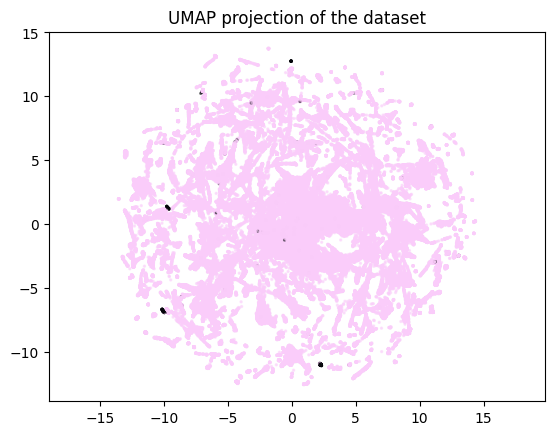

In [ ]:
plt.scatter(
    embedding[0],
    embedding[1],
    c=y,
    cmap='cmc.batlowK_r',
    alpha =0.5,
    s=2)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of the dataset', fontsize=12);

In [ ]:
# TSNE - use scaled data
tsne = cuml.TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

[W] [16:54:20.110533] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...


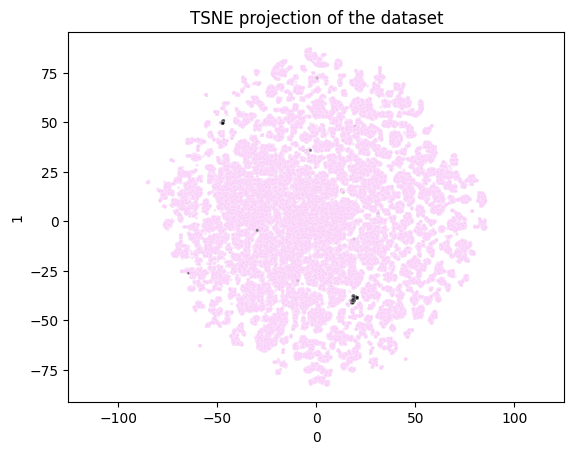

In [ ]:
sns.scatterplot(
    x=X_tsne[0],
    y=X_tsne[1],
    c=y,
    cmap='cmc.batlowK_r',
    alpha=0.5,
    s=5,
    legend=True
)
plt.gca().set_aspect('equal', 'datalim')
plt.title('TSNE projection of the dataset', fontsize=12);


In [ ]:
# PCA - use scaled data
pca = cuml.PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)

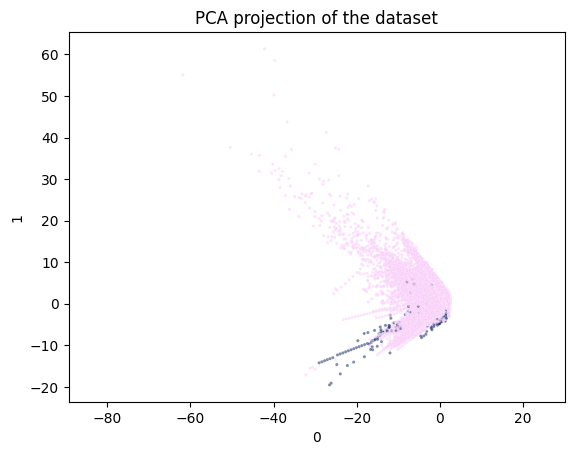

In [ ]:
sns.scatterplot(
    x=X_pca[0],
    y=X_pca[1],
    c=y,
    cmap='cmc.batlow_r',
    alpha=0.5,
    s=5,
    legend=True
)
plt.gca().set_aspect('equal', 'datalim')
plt.title('PCA projection of the dataset', fontsize=12);


---
---


## 2. Data Preprocessing

#### Train - Test Split

In [28]:
df.sample(1)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
221201,2.050,-0.104,-1.205,0.207,0.109,-0.666,0.074,-0.164,0.304,0.242,0.615,1.017,0.082,0.441,-0.636,0.203,-0.683,-0.252,0.583,-0.202,-0.264,-0.655,0.281,-0.406,-0.275,0.203,-0.075,-0.074,0.170,0


In [29]:
X = df.drop("Class", axis=1)
y = df["Class"]

In [30]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, stratify = y, random_state=42)

In [31]:
train_df = pd.concat([pd.DataFrame(X_train), pd.DataFrame(y_train)], axis=1)

In [32]:
# Since there are negative values in the dataset we just only use PowerTransformer

# Create a ColumnTransformer
ct = ColumnTransformer(
    [
        ('power_transformer', PowerTransformer(method='yeo-johnson', standardize = True), power_columns),
    ],
    remainder='passthrough',# Pass through any remaining columns
    verbose_feature_names_out = False
).set_output(transform="pandas")

In [33]:
ct_gpu = ColumnTransformerGPU(
    [
        ('power_transformer', PowerTransformerGPU(method='yeo-johnson', standardize = True), power_columns),
    ],
    remainder='passthrough'# Pass through any remaining columns
)

## Train-Test Validation Checks
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_train_test_validation.html

In [34]:
categorical_features = []
#datetime_name = 'Time'
train_ds = Dataset(X_train, label=y_train,cat_features=categorical_features) #, datetime_name=datetime_name
test_ds = Dataset(X_test, label=y_test,cat_features=categorical_features) # datetime_name=datetime_name

In [35]:
validation_suite = train_test_validation()
suite_result = validation_suite.run(train_ds, test_ds)
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json using suite_result.to_json()
suite_result

<!--
 ~ ----------------------------------------------------------------------------
 ~ Copyright (C) 2021-2023 Deepchecks (https://www.deepchecks.com)
 ~
 ~ This file is part of Deepchecks.
 ~ Deepchecks is distributed under the terms of the GNU Affero General
 ~ Public License (version 3 or later).
 ~ You should have received a copy of the GNU Affero General Public License
 ~ along with Deepchecks. If not, see .
 ~ ----------------------------------------------------------------------------
 ~
-->
<!DOCTYPE html>
 
 
 
 Train Test Validation Suite

#### Scaling

In [ ]:
# Scaling will be done in the pipeline.

---
---


## 3. Model Building

This dataset is severely **unbalanced** (most of the transactions are non-fraud). So the algorithms are much more likely to classify new observations to the majority class and high accuracy won't tell us anything. To address the problem of imbalanced dataset, we can use undersampling and oversampling or class weight and optimum threshold techniques.

In [36]:
def eval_metric(model, X_train, y_train, X_test, y_test):
    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)

    # if the type of prediction is cudf series, convert to numpy for confusion_matrix and classification_report
    if 'cudf' in str(type(y_train_pred)):
        print("Test_Set")
        print(confusion_matrix(y_test.to_numpy(), y_pred.to_numpy()))
        print(classification_report(y_test.to_numpy(), y_pred.to_numpy()))
        print("Matthews score:", matthews_corrcoef(y_test.to_numpy(), y_pred.to_numpy()))
        print()
        print("Train_Set")
        print(confusion_matrix(y_train.to_numpy(), y_train_pred.to_numpy()))
        print(classification_report(y_train.to_numpy(), y_train_pred.to_numpy()))
        print("Matthews score:", matthews_corrcoef(y_train.to_numpy(), y_train_pred.to_numpy()))
    else:
        print("Test_Set")
        print(confusion_matrix(y_test, y_pred))
        print(classification_report(y_test, y_pred))
        print("Matthews score:", matthews_corrcoef(y_test, y_pred))
        print()
        print("Train_Set")
        print(confusion_matrix(y_train, y_train_pred))
        print(classification_report(y_train, y_train_pred))
        print("Matthews score:", matthews_corrcoef(y_train, y_train_pred))


In [37]:
def evaluate_threshold(classifier, X_train, y_train, X_test, y_test, threshold):
    """
    Evaluates a classifier with a given threshold on the training and test datasets.

    Parameters:
    - classifier: The trained classifier.
    - X_train: The feature matrix of the training dataset.
    - y_train: The target labels of the training dataset.
    - X_test: The feature matrix of the test dataset.
    - y_test: The target labels of the test dataset.
    - threshold: The threshold value for converting predicted probabilities into binary predictions.

    Prints:
    - Confusion matrix and classification report for the test dataset.
    - Matthews correlation coefficient (MCC) for the test dataset.
    - Confusion matrix and classification report for the training dataset.
    - Matthews correlation coefficient (MCC) for the training dataset.
    """

    # Predict probabilities of train dataset
    predict_proba = classifier.predict_proba(X_train)

    #  if numpy -> predict_proba[:, 1], else pandas DataFrame -> predict_proba.iloc[:, 1]
    probabilities_train = predict_proba[:, 1] if 'numpy' in str(type(predict_proba)) else predict_proba.iloc[:, 1]

    # Predict probabilities of test dataset
    predict_proba = classifier.predict_proba(X_test)

    #  if numpy -> predict_proba[:, 1], else pandas DataFrame -> predict_proba.iloc[:, 1]
    probabilities_test = predict_proba[:, 1] if 'numpy' in str(type(predict_proba)) else predict_proba.iloc[:, 1]

    # Perform predictions using the provided threshold
    y_train_pred = (probabilities_train >= threshold).astype(int)
    y_test_pred = (probabilities_test >= threshold).astype(int)

    # Calculate and display metrics for the test set
    print("Test Set:")
    test_confusion_matrix = confusion_matrix(y_test, y_test_pred)
    test_classification_report = classification_report(y_test, y_test_pred)
    test_mcc = matthews_corrcoef(y_test, y_test_pred)

    print(test_confusion_matrix)
    print(test_classification_report)
    print("Matthews Score:", test_mcc)
    print()

    # Calculate and display metrics for the training set
    print("Training Set:")
    train_confusion_matrix = confusion_matrix(y_train, y_train_pred)
    train_classification_report = classification_report(y_train, y_train_pred)
    train_mcc = matthews_corrcoef(y_train, y_train_pred)

    print(train_confusion_matrix)
    print(train_classification_report)
    print("Matthews Score:", train_mcc)
    print()


In [38]:
# ref(modified): https://machinelearningmastery.com/threshold-moving-for-imbalanced-classification/

def find_optimal_threshold(model, X, y):
    """
    Finds the best threshold that maximizes the F-score based on precision-recall curves.

    Parameters:
        model: Trained classifier model with predict_proba() method.
        X (array-like): Input features.
        y (array-like): Target labels.

    Returns:
        best_threshold (float): The best threshold value.
        best_fscore (float): The corresponding F-score at the best threshold.
        fig (plotly.graph_objects.Figure): Plotly figure showing precision, recall, and F1-score along thresholds.
    """
    # Predict probabilities
    predict_proba = model.predict_proba(X)

    #  if numpy -> predict_proba[:, 1], else pandas DataFrame -> predict_proba.iloc[:, 1]
    y_probs = predict_proba[:, 1] if 'numpy' in str(type(predict_proba)) else predict_proba.iloc[:, 1]

    # Calculate precision, recall, and thresholds
    precision, recall, thresholds = precision_recall_curve(y, y_probs)

    # Calculate F-scores
    fscores = (2 * precision * recall) / (precision + recall)

    # Find the index of the largest F-score
    best_index = np.argmax(fscores)

    # Retrieve the best threshold and corresponding F-score
    best_threshold = thresholds[best_index]
    best_fscore = fscores[best_index]

    # Create Plotly figure
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=thresholds, y=fscores, mode='lines', name='F1 Score'))
    fig.add_trace(go.Scatter(x=thresholds, y=precision, mode='lines', name='Precision'))
    fig.add_trace(go.Scatter(x=thresholds, y=recall, mode='lines', name='Recall'))
    fig.update_layout(
        title='Scores for Different Thresholds',
        xaxis_title='Threshold',
        yaxis_title='Score',
        legend=dict(x=0.7, y=0.9),
        width=800,
        height=500
    )

    # Enable hover mode and update the annotation based on mouse hover
    fig.update_layout(
        hovermode='x',
        hoverdistance=-1  # Ensures the hover is always on the line
    )

    fig.update_traces(hovertemplate=None)  # Disable default hover template

    return best_threshold, best_fscore, fig


In [39]:
def find_optimal_threshold_mcc(model, X_val, y_val):
    # Predict probabilities
    predict_proba = model.predict_proba(X_val)

    #  if numpy -> predict_proba[:, 1], else pandas DataFrame -> predict_proba.iloc[:, 1]
    probabilities = predict_proba[:, 1] if 'numpy' in str(type(predict_proba)) else predict_proba.iloc[:, 1]

    # Define the threshold range
    thresholds = np.arange(0, 1.01, 0.01)

    # Initialize variables to store the maximum MCC and corresponding threshold
    max_mcc = -1
    best_threshold = 0

    # Iterate through each threshold value
    for threshold in thresholds:
        # Convert probabilities to binary predictions using the threshold
        predictions = (probabilities > threshold).astype(int)

        # Calculate the MCC
        mcc = matthews_corrcoef(y_val, predictions)

        # Update the maximum MCC and threshold if a higher MCC is found
        if mcc > max_mcc:
            max_mcc = mcc
            best_threshold = threshold

    return best_threshold, max_mcc

In [40]:
# Custom metrics for AutoML for hyperparameter tuning
# minimizing 1 - matthews corrcoef
def custom_metric_mcc(X_val, y_val, estimator, labels, X_train, y_train,
                  weight_val=None, weight_train=None, config=None,
                  groups_val=None, groups_train=None):
    from sklearn.metrics import matthews_corrcoef
    import time

    start = time.time()
    y_pred = estimator.predict(X_val)
    pred_time = (time.time() - start) / len(X_val)

    val_mcc = matthews_corrcoef(y_val, y_pred)

    y_pred = estimator.predict(X_train)
    train_mcc = matthews_corrcoef(y_train, y_pred)

    alpha = 0.5
    return ((1-val_mcc) * (1 + alpha) - alpha * (1-train_mcc)), {
        "val_mcc": 1 - val_mcc, "train_mcc": 1 - train_mcc, "pred_time": pred_time
    }

def custom_metric_recall(X_val, y_val, estimator, labels, X_train, y_train,
                         weight_val=None, weight_train=None, config=None,
                         groups_val=None, groups_train=None):
    from sklearn.metrics import recall_score
    import time

    start = time.time()
    y_pred = estimator.predict(X_val)
    pred_time = (time.time() - start) / len(X_val)

    val_recall = recall_score(y_val, y_pred, labels=labels)

    y_pred = estimator.predict(X_train)
    train_recall = recall_score(y_train, y_pred, labels=labels)

    alpha = 0.5
    return ((1 - val_recall) * (1 + alpha) - alpha * (1 - train_recall)), {
        "val_recall": 1 - val_recall, "train_recall": 1 - train_recall, "pred_time": pred_time
    }

def custom_metric_roc_auc(X_val, y_val, estimator, labels, X_train, y_train,
                          weight_val=None, weight_train=None, config=None,
                          groups_val=None, groups_train=None):
    from sklearn.metrics import roc_auc_score
    import time

    start = time.time()
    y_pred = estimator.predict_proba(X_val)[:, 1]  # Assuming binary classification
    pred_time = (time.time() - start) / len(X_val)

    val_roc_auc = roc_auc_score(y_val, y_pred)

    y_pred = estimator.predict_proba(X_train)[:, 1]  # Assuming binary classification
    train_roc_auc = roc_auc_score(y_train, y_pred)

    alpha = 0.5
    return ((1 - val_roc_auc) * (1 + alpha) - alpha * (1 - train_roc_auc)), {
        "val_roc_auc": 1 - val_roc_auc, "train_roc_auc": 1 - train_roc_auc, "pred_time": pred_time
    }

def custom_metric_ap (X_val, y_val, estimator, labels, X_train, y_train,
                  weight_val=None, weight_train=None, config=None,
                  groups_val=None, groups_train=None):
    from sklearn.metrics import average_precision_score
    import time

    start = time.time()
    y_pred = estimator.predict(X_val)
    pred_time = (time.time() - start) / len(X_val)

    val_ap = average_precision_score(y_val, y_pred)

    y_pred = estimator.predict(X_train)
    train_ap = average_precision_score(y_train, y_pred)

    alpha = 0.5
    return ((1-val_ap) * (1 + alpha) - alpha * (1-train_ap)), {
        "val_ap": 1 - val_ap, "train_ap": 1 - train_ap, "pred_time": pred_time
    }
def custom_metric_loss(
    X_val, y_val, estimator, labels,
    X_train, y_train, weight_val=None, weight_train=None,
    *args,
):
    from sklearn.metrics import log_loss
    import time

    start = time.time()
    y_pred = estimator.predict_proba(X_val)
    pred_time = (time.time() - start) / len(X_val)
    val_loss = log_loss(y_val, y_pred, labels=labels, sample_weight=weight_val)
    y_pred = estimator.predict_proba(X_train)
    train_loss = log_loss(y_train, y_pred, labels=labels, sample_weight=weight_train)
    alpha = 0.5
    return val_loss * (1 + alpha) - alpha * train_loss, {
        "val_loss": val_loss,
        "train_loss": train_loss,
        "pred_time": pred_time,
    }

def custom_metric_f1(X_val, y_val, estimator, labels, X_train, y_train,
                    weight_val=None, weight_train=None, config=None,
                    groups_val=None, groups_train=None):
    from sklearn.metrics import f1_score
    import time

    start = time.time()
    y_pred = estimator.predict(X_val)
    pred_time = (time.time() - start) / len(X_val)

    val_f1 = f1_score(y_val, y_pred, labels=labels)

    y_pred = estimator.predict(X_train)
    train_f1 = f1_score(y_train, y_pred, labels=labels)

    alpha = 0.5
    return ((1 - val_f1) * (1 + alpha) - alpha * (1 - train_f1)), {
        "val_f1": 1 - val_f1, "train_f1": 1 - train_f1, "pred_time": pred_time
    }

def focal_loss(y_true, y_pred, gamma=2.0):
        epsilon = 1e-7
        y_pred = np.clip(y_pred, epsilon, 1.0 - epsilon)
        pt = np.where(y_true == 1, y_pred, 1 - y_pred)
        loss = -((1 - pt) ** gamma) * np.log(pt)
        return np.mean(loss)

def custom_metric_focal_loss(
    X_val, y_val, estimator, labels,
    X_train, y_train, weight_val=None, weight_train=None,
    *args,
):

    start = time.time()
    y_pred = estimator.predict_proba(X_val)
    pred_time = (time.time() - start) / len(X_val)
    val_loss = focal_loss(y_val, y_pred)
    y_pred = estimator.predict_proba(X_train)
    train_loss = focal_loss(y_train, y_pred)
    alpha = 0.5
    return val_loss * (1 + alpha) - alpha * train_loss, {
        "val_loss": val_loss,
        "train_loss": train_loss,
        "pred_time": pred_time,
    }

IQRTransformer: the outliers that exceed the upper whisker (q3 + 1.5 * iqr) are set to the value q3 + 1.5 * iqr, effectively capping them at that maximum value. Similarly, outliers below the lower whisker (q1 - 1.5 * iqr) are set to q1 - 1.5 * iqr, capping them at that minimum value.

The intention of the transformer is to adjust the extreme values within the range defined by the IQR, rather than dropping them from the dataset.

The IQRTransformer is useful for models such as linear regression, decision trees, clustering, anomaly detection, and feature scaling, where handling outliers is important. By capping extreme values based on the interquartile range, it helps improve model performance, prevent bias, enhance clustering accuracy, and mitigate the impact of outliers on feature scaling.

Dropping outliers is generally recommended when the outliers are considered data entry errors, measurement errors, or instances of extreme noise.

Capping outliers is often preferred when the outliers are not considered errors but are extreme values that still hold some relevance or meaning in the context of the problem.
Capping outliers helps retain the information contained within these extreme values while reducing their potential disruptive effect on the model.

In [41]:
# ref: https://towardsdatascience.com/creating-custom-transformers-using-scikit-learn-5f9db7d7fdb5
class OutlierRemover(BaseEstimator,TransformerMixin):
    def __init__(self,factor=1.5):
        self.factor = factor

    def outlier_detector(self,X,y=None):
        X = pd.Series(X).copy()
        q1 = X.quantile(0.25)
        q3 = X.quantile(0.75)
        iqr = q3 - q1
        self.lower_bound.append(q1 - (self.factor * iqr))
        self.upper_bound.append(q3 + (self.factor * iqr))

    def fit(self,X,y=None):
        self.lower_bound = []
        self.upper_bound = []
        X.apply(self.outlier_detector)
        return self

    def transform(self,X,y=None):
        X = pd.DataFrame(X).copy()
        for i in range(X.shape[1]):
            x = X.iloc[:, i].copy()
            x[(x < self.lower_bound[i]) | (x > self.upper_bound[i])] = np.nan
            X.iloc[:, i] = x
        return X

In [42]:
class OutlierCapping(BaseEstimator, TransformerMixin):
    def __init__(self, factor=1.5):
        self.factor = factor
        self.lower_bound = None
        self.upper_bound = None

    def fit(self, X, y=None):
        X = X # pd.DataFrame(X)
        self.lower_bound = X.quantile(0.25) - self.factor * (X.quantile(0.75) - X.quantile(0.25))
        self.upper_bound = X.quantile(0.75) + self.factor * (X.quantile(0.75) - X.quantile(0.25))
        return self

    def transform(self, X, y=None):
        X = X # pd.DataFrame(X)
        X_capped = X.clip(lower=self.lower_bound, upper=self.upper_bound, axis=1)
        return X_capped

### Logistic Regression with Unbalanced Data Techniques

#### Logistic Regression (vanilla model)

In [43]:
operations = [
    ('transform',ct),
    ('iqr',OutlierCapping(factor=1.5)),
    ('lr', cuml.LogisticRegression())
]

# Create the pipeline
lr_pipe = Pipeline(steps = operations)

# Fit the pipeline to the resampled data
lr_pipe.fit(X_train, y_train)



Pipeline(steps=[('transform',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('power_transformer',
                                                  PowerTransformer(),
                                                  ['V1', 'V2', 'V3', 'V5',
                                                   'V10', 'V12', 'V14', 'V16',
                                                   'V17', 'V20', 'V23', 'V28',
                                                   'Amount'])],
                                   verbose_feature_names_out=False)),
                ('iqr', OutlierCapping()), ('lr', LogisticRegression())])

***ii. Prediction and Model Evaluating and Tuning***

In [ ]:
print("LR MODEL")
eval_metric(lr_pipe, X_train, y_train, X_test, y_test)

LR MODEL
Test_Set
[[55025    13]
 [   23    72]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.85      0.76      0.80        95

    accuracy                           1.00     55133
   macro avg       0.92      0.88      0.90     55133
weighted avg       1.00      1.00      1.00     55133

Matthews score: 0.800914967850893

Train_Set
[[220106     46]
 [    85    293]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.86      0.78      0.82       378

    accuracy                           1.00    220530
   macro avg       0.93      0.89      0.91    220530
weighted avg       1.00      1.00      1.00    220530

Matthews score: 0.8182128989474157


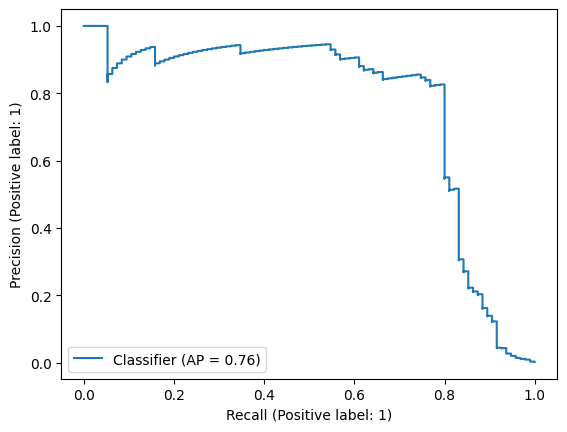

In [ ]:
y_pred = lr_pipe.predict_proba(X_test)[1]
PrecisionRecallDisplay.from_predictions(y_test,y_pred);

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [ ]:
train_ds = Dataset(X_train, label=y_train, cat_features=[])
test_ds = Dataset(X_test, label=y_test, cat_features=[])

evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, lr_pipe)
suite_result.show()
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json

# Passed the tests.

deepchecks - WARNING - Cannot use model's built-in feature importance on a Scikit-learn Pipeline, using permutation feature importance calculation instead
deepchecks - INFO - Calculating permutation feature importance. Expected to finish in 30 seconds
INFO:deepchecks:Calculating permutation feature importance. Expected to finish in 30 seconds


<!--
 ~ ----------------------------------------------------------------------------
 ~ Copyright (C) 2021-2023 Deepchecks (https://www.deepchecks.com)
 ~
 ~ This file is part of Deepchecks.
 ~ Deepchecks is distributed under the terms of the GNU Affero General
 ~ Public License (version 3 or later).
 ~ You should have received a copy of the GNU Affero General Public License
 ~ along with Deepchecks. If not, see .
 ~ ----------------------------------------------------------------------------
 ~
-->
<!DOCTYPE html>
 
 
 
 Model Evaluation Suite

#### Logistic Regression (threshold)

In [ ]:
operations = [
    ('transform',ct),
    ('iqr',OutlierCapping(factor=3)),
    ('lr', LogisticRegression())
]

# Create the pipeline
lr_pipe2 = Pipeline(steps = operations)

# Fit the pipeline to the resampled data
lr_pipe2.fit(X_train, y_train)

Pipeline(steps=[('transform',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('power_transformer',
                                                  PowerTransformer(),
                                                  ['V1', 'V2', 'V3', 'V5',
                                                   'V10', 'V12', 'V14', 'V16',
                                                   'V17', 'V20', 'V23', 'V28',
                                                   'Amount'])],
                                   verbose_feature_names_out=False)),
                ('iqr', OutlierCapping(factor=3)),
                ('lr', LogisticRegression())])

In [ ]:
best_threshold, best_fscore, fig = find_optimal_threshold(lr_pipe2, X_train,y_train)
print('Best Threshold=%f, F-Score=%.3f' % (best_threshold, best_fscore))

best_threshold, best_mcc = find_optimal_threshold_mcc(lr_pipe2,X_train,y_train)
print('Best Threshold=%f, Matthews-Score=%.3f' % (best_threshold, best_mcc))

# fig.show(renderer='colab')

Best Threshold=0.341434, F-Score=0.838
Best Threshold=0.340000, Matthews-Score=0.839


***ii. Prediction and Model Evaluating and Tuning***

In [ ]:
# I got better recall results from threshold 0.20 instead of 0.34
optimal_threshold = 0.20
evaluate_threshold(lr_pipe2, X_train, y_train, X_test, y_test, optimal_threshold)

Test Set:
[[55022    16]
 [   19    76]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.83      0.80      0.81        95

    accuracy                           1.00     55133
   macro avg       0.91      0.90      0.91     55133
weighted avg       1.00      1.00      1.00     55133

Matthews Score: 0.8126212878778466

Training Set:
[[220088     64]
 [    69    309]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.83      0.82      0.82       378

    accuracy                           1.00    220530
   macro avg       0.91      0.91      0.91    220530
weighted avg       1.00      1.00      1.00    220530

Matthews Score: 0.8226190433046814



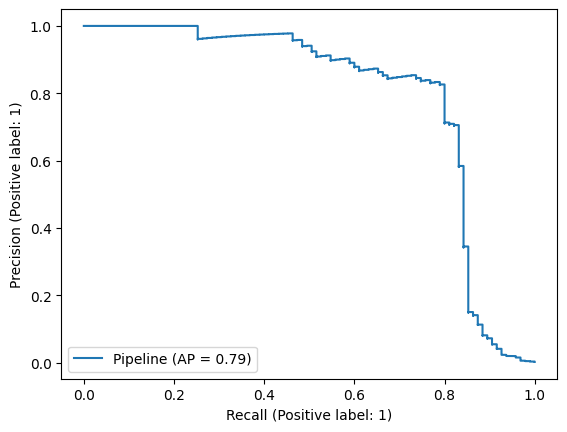

In [ ]:
PrecisionRecallDisplay.from_estimator(lr_pipe2,
                                      X_test,
                                      y_test);

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [ ]:
train_ds = Dataset(X_train, label=y_train, cat_features=[])
test_ds = Dataset(X_test, label=y_test, cat_features=[])

evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, lr_pipe2)
suite_result.show()
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json

deepchecks - WARNING - Cannot use model's built-in feature importance on a Scikit-learn Pipeline, using permutation feature importance calculation instead
deepchecks - INFO - Calculating permutation feature importance. Expected to finish in 45 seconds
INFO:deepchecks:Calculating permutation feature importance. Expected to finish in 45 seconds


<!--
 ~ ----------------------------------------------------------------------------
 ~ Copyright (C) 2021-2023 Deepchecks (https://www.deepchecks.com)
 ~
 ~ This file is part of Deepchecks.
 ~ Deepchecks is distributed under the terms of the GNU Affero General
 ~ Public License (version 3 or later).
 ~ You should have received a copy of the GNU Affero General Public License
 ~ along with Deepchecks. If not, see .
 ~ ----------------------------------------------------------------------------
 ~
-->
<!DOCTYPE html>
 
 
 
 Model Evaluation Suite

#### Logistic Regression (with class weights)

In [ ]:
operations = [
    ('transform',ct),
    ('iqr',OutlierCapping(factor=3)),
    ('lr', LogisticRegression(class_weight={0:1,1:4}))
]

# Create the pipeline
lr_pipe3 = Pipeline(steps = operations)

# Fit the pipeline to the resampled data
lr_pipe3.fit(X_train, y_train)



Pipeline(steps=[('transform',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('power_transformer',
                                                  PowerTransformer(),
                                                  ['V1', 'V2', 'V3', 'V5',
                                                   'V10', 'V12', 'V14', 'V16',
                                                   'V17', 'V20', 'V23', 'V28',
                                                   'Amount'])],
                                   verbose_feature_names_out=False)),
                ('iqr', OutlierCapping(factor=3)),
                ('lr', LogisticRegression(class_weight={0: 1, 1: 4}))])

***ii. Prediction and Model Evaluating and Tuning***

In [ ]:
print("LR-Tuned MODEL")
eval_metric(lr_pipe3, X_train, y_train, X_test, y_test)

LR-Tuned MODEL
Test_Set
[[55022    16]
 [   20    75]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.82      0.79      0.81        95

    accuracy                           1.00     55133
   macro avg       0.91      0.89      0.90     55133
weighted avg       1.00      1.00      1.00     55133

Matthews score: 0.8063118335965999

Train_Set
[[220084     68]
 [    72    306]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.82      0.81      0.81       378

    accuracy                           1.00    220530
   macro avg       0.91      0.90      0.91    220530
weighted avg       1.00      1.00      1.00    220530

Matthews score: 0.8135233850734468


In [ ]:
best_threshold, best_fscore, fig = find_optimal_threshold(lr_pipe3, X_train,y_train)
print('Best Threshold=%f, F-Score=%.3f' % (best_threshold, best_fscore))

best_threshold, best_mcc = find_optimal_threshold_mcc(lr_pipe3,X_train,y_train)
print('Best Threshold=%f, Matthews-Score=%.3f' % (best_threshold, best_mcc))

# fig.show(renderer='colab')

Best Threshold=0.670980, F-Score=0.833
Best Threshold=0.690000, Matthews-Score=0.833


In [ ]:
optimal_threshold = 0.68
evaluate_threshold(lr_pipe3, X_train, y_train, X_test, y_test, optimal_threshold)

Test Set:
[[55024    14]
 [   20    75]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.84      0.79      0.82        95

    accuracy                           1.00     55133
   macro avg       0.92      0.89      0.91     55133
weighted avg       1.00      1.00      1.00     55133

Matthews Score: 0.8153439130864932

Training Set:
[[220107     45]
 [    77    301]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.87      0.80      0.83       378

    accuracy                           1.00    220530
   macro avg       0.93      0.90      0.92    220530
weighted avg       1.00      1.00      1.00    220530

Matthews Score: 0.8320309669154854



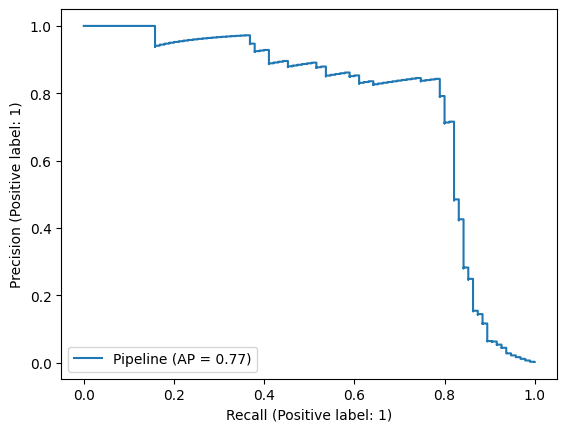

In [ ]:
PrecisionRecallDisplay.from_estimator(lr_pipe3,
                                      X_test,
                                      y_test);

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [ ]:
train_ds = Dataset(X_train, label=y_train, cat_features=[])
test_ds = Dataset(X_test, label=y_test, cat_features=[])

evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, lr_pipe3)
suite_result.show()
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json

deepchecks - WARNING - Cannot use model's built-in feature importance on a Scikit-learn Pipeline, using permutation feature importance calculation instead
deepchecks - INFO - Calculating permutation feature importance. Expected to finish in 38 seconds
INFO:deepchecks:Calculating permutation feature importance. Expected to finish in 38 seconds


<!--
 ~ ----------------------------------------------------------------------------
 ~ Copyright (C) 2021-2023 Deepchecks (https://www.deepchecks.com)
 ~
 ~ This file is part of Deepchecks.
 ~ Deepchecks is distributed under the terms of the GNU Affero General
 ~ Public License (version 3 or later).
 ~ You should have received a copy of the GNU Affero General Public License
 ~ along with Deepchecks. If not, see .
 ~ ----------------------------------------------------------------------------
 ~
-->
<!DOCTYPE html>
 
 
 
 Model Evaluation Suite

#### Logistic Regression SMOTE

In [44]:
# Define the number of majority and minority samples to be used for resampling
y_train_majority_number = int(y_train.value_counts()[0] * 0.70)
y_train_minority_number = int(y_train.value_counts()[1] * 1.30)

# Define the resampling techniques
over = SMOTE(sampling_strategy={1: y_train_minority_number})
under = RandomUnderSampler(sampling_strategy={0: y_train_majority_number})

# Define the operations/steps for the pipeline
operations = [
    ('transformer',ct),
    ('iqr',OutlierCapping(factor=3)),
    ('o', over),
    ('u', under),
    ('lr', LogisticRegression())
]

# Create the pipeline
lr_pipe4 = imbpipeline(steps = operations)

# Fit the pipeline to the resampled data
lr_pipe4.fit(X_train, y_train)



Pipeline(steps=[('transformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('power_transformer',
                                                  PowerTransformer(),
                                                  ['V1', 'V2', 'V3', 'V5',
                                                   'V10', 'V12', 'V14', 'V16',
                                                   'V17', 'V20', 'V23', 'V28',
                                                   'Amount'])],
                                   verbose_feature_names_out=False)),
                ('iqr', OutlierCapping(factor=3)),
                ('o', SMOTE(sampling_strategy={1: 491})),
                ('u', RandomUnderSampler(sampling_strategy={0: 154106})),
                ('lr', LogisticRegression())])

***ii. Prediction and Model Evaluating and Tuning***

In [45]:
print("LR-Tuned MODEL")
eval_metric(lr_pipe4, X_train, y_train, X_test, y_test)

LR-Tuned MODEL
Test_Set
[[55025    13]
 [   21    74]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.85      0.78      0.81        95

    accuracy                           1.00     55133
   macro avg       0.93      0.89      0.91     55133
weighted avg       1.00      1.00      1.00     55133

Matthews score: 0.8136675920286317

Train_Set
[[220108     44]
 [    77    301]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.87      0.80      0.83       378

    accuracy                           1.00    220530
   macro avg       0.94      0.90      0.92    220530
weighted avg       1.00      1.00      1.00    220530

Matthews score: 0.8332387984737397


In [46]:
model = lr_pipe4

best_threshold, best_fscore, fig = find_optimal_threshold(model, X_train,y_train)
print('Best Threshold=%f, F-Score=%.3f' % (best_threshold, best_fscore))

best_threshold, best_mcc = find_optimal_threshold_mcc(model,X_train,y_train)
print('Best Threshold=%f, Matthews-Score=%.3f' % (best_threshold, best_mcc))

# fig.show(renderer='colab')

Best Threshold=0.539954, F-Score=0.837
Best Threshold=0.530000, Matthews-Score=0.838


In [47]:
optimal_threshold = 0.30
evaluate_threshold(lr_pipe4, X_train, y_train, X_test, y_test, optimal_threshold)

Test Set:
[[55020    18]
 [   20    75]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.81      0.79      0.80        95

    accuracy                           1.00     55133
   macro avg       0.90      0.89      0.90     55133
weighted avg       1.00      1.00      1.00     55133

Matthews Score: 0.7975724573464058

Training Set:
[[220077     75]
 [    71    307]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.80      0.81      0.81       378

    accuracy                           1.00    220530
   macro avg       0.90      0.91      0.90    220530
weighted avg       1.00      1.00      1.00    220530

Matthews Score: 0.8075743779115739



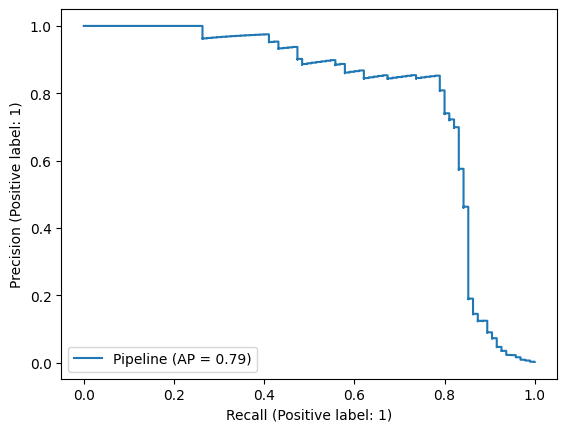

In [48]:
PrecisionRecallDisplay.from_estimator(lr_pipe4,
                                      X_test,
                                      y_test);

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [ ]:
train_ds = Dataset(X_train, label=y_train, cat_features=[])
test_ds = Dataset(X_test, label=y_test, cat_features=[])

evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, lr_pipe4)
suite_result.show()
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json

deepchecks - WARNING - Cannot use model's built-in feature importance on a Scikit-learn Pipeline, using permutation feature importance calculation instead
deepchecks - INFO - Calculating permutation feature importance. Expected to finish in 33 seconds
INFO:deepchecks:Calculating permutation feature importance. Expected to finish in 33 seconds


<!--
 ~ ----------------------------------------------------------------------------
 ~ Copyright (C) 2021-2023 Deepchecks (https://www.deepchecks.com)
 ~
 ~ This file is part of Deepchecks.
 ~ Deepchecks is distributed under the terms of the GNU Affero General
 ~ Public License (version 3 or later).
 ~ You should have received a copy of the GNU Affero General Public License
 ~ along with Deepchecks. If not, see .
 ~ ----------------------------------------------------------------------------
 ~
-->
<!DOCTYPE html>
 
 
 
 Model Evaluation Suite

#### Logistic Regression Conclusion

In [49]:
# logistic regression with smote has 0.79 recall score and highest matthews score. also passed deepchecks test
model = lr_pipe4
predict_proba = model.predict_proba(X_test)

threshold = 0.30

y_pred_proba = predict_proba[:, 1] if 'numpy' in str(type(predict_proba)) else predict_proba.iloc[:, 1]
y_pred = (y_pred_proba >= threshold).astype(int)

log_AP = average_precision_score(y_test, y_pred_proba)
log_rec = recall_score(y_test, y_pred)
log_f1 = f1_score(y_test,y_pred)
log_matthews =  matthews_corrcoef(y_test, y_pred)

log_AP,log_rec,log_f1,log_matthews

(0.7905187878972794,
 0.7894736842105263,
 0.7978723404255319,
 0.7975724573464058)

### SVM

#### SVM

In [50]:
from cuml.svm import SVC

***i. Model Training***

In [51]:
# Define the operations/steps for the pipeline
operations = [
    ('transformer',ct),
    ('iqr',OutlierCapping(factor=3)),
    ('svc', SVC(C=2,class_weight={0:1,1:1}, probability =True,kernel='rbf',gamma='scale'))
]

# Create the pipeline
svm_pipe = Pipeline(steps = operations)

# Fit the pipeline to the resampled data
svm_pipe.fit(X_train, y_train)



Pipeline(steps=[('transformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('power_transformer',
                                                  PowerTransformer(),
                                                  ['V1', 'V2', 'V3', 'V5',
                                                   'V10', 'V12', 'V14', 'V16',
                                                   'V17', 'V20', 'V23', 'V28',
                                                   'Amount'])],
                                   verbose_feature_names_out=False)),
                ('iqr', OutlierCapping(factor=3)), ('svc', SVC())])

***ii. Prediction and Model Evaluating and Tuning***

In [52]:
print("SVM MODEL")
eval_metric(svm_pipe, X_train, y_train, X_test, y_test)

SVM MODEL
Test_Set
[[55032     6]
 [   27    68]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.92      0.72      0.80        95

    accuracy                           1.00     55133
   macro avg       0.96      0.86      0.90     55133
weighted avg       1.00      1.00      1.00     55133

Matthews score: 0.8107412381781993

Train_Set
[[220147      5]
 [    60    318]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.98      0.84      0.91       378

    accuracy                           1.00    220530
   macro avg       0.99      0.92      0.95    220530
weighted avg       1.00      1.00      1.00    220530

Matthews score: 0.9099425877140995


In [53]:
model = svm_pipe

best_threshold, best_fscore, fig = find_optimal_threshold(model, X_test,y_test)
print('Best Threshold=%f, F-Score=%.3f' % (best_threshold, best_fscore))

best_threshold, best_mcc = find_optimal_threshold_mcc(model,X_test,y_test)
print('Best Threshold=%f, Matthews-Score=%.3f' % (best_threshold, best_mcc))

# fig.show(renderer='colab')

Best Threshold=0.237235, F-Score=0.841
Best Threshold=0.210000, Matthews-Score=0.843


In [54]:
optimal_threshold = 0.23
evaluate_threshold(svm_pipe, X_train, y_train, X_test, y_test, optimal_threshold)

Test Set:
[[55031     7]
 [   21    74]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.91      0.78      0.84        95

    accuracy                           1.00     55133
   macro avg       0.96      0.89      0.92     55133
weighted avg       1.00      1.00      1.00     55133

Matthews Score: 0.8433372094127066

Training Set:
[[220145      7]
 [    55    323]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.98      0.85      0.91       378

    accuracy                           1.00    220530
   macro avg       0.99      0.93      0.96    220530
weighted avg       1.00      1.00      1.00    220530

Matthews Score: 0.914399862708156



***iii. Roc Auc Curve***


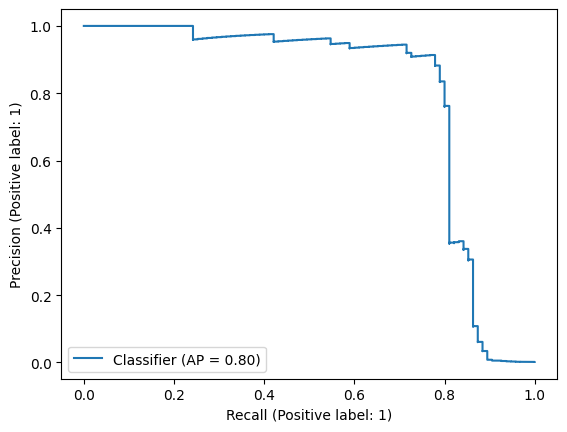

In [ ]:
y_pred_proba = svm_pipe.predict_proba(X_test).loc[:,1]
PrecisionRecallDisplay.from_predictions(y_test,y_pred_proba);

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

#### SVM Optuna

In [ ]:
from cuml.svm import SVC

***i. Model Training***

In [ ]:
def get_model():
  operations = [
      ('ct',ct),
      ('iqr',OutlierCapping(factor=3)),
      ('svc', cuml.svm.SVC(probability=True))
  ]

  # Create the pipeline
  svm_pipe2 = Pipeline(steps = operations)
  return svm_pipe2

In [ ]:
def objective(trial):
    C = trial.suggest_loguniform('C', 0.1, 10)
    class_weight_0 = 1
    class_weight_1 = trial.suggest_loguniform('class_weight_1', 1, 10)
    kernel = trial.suggest_categorical('kernel', ['rbf', 'poly']) # 'linear' takes too long
    gamma = trial.suggest_categorical('gamma', ['scale', 'auto'])
    # degree = trial.suggest_int('degree', 1, 5)

    # Create class weight dictionary
    class_weight = {0: class_weight_0, 1: class_weight_1}

    features = X_train.columns
    train = X_train
    train_target = y_train.values

    train_oof = np.zeros((train.shape[0],))

    n_fold = 5

    kf = StratifiedKFold(n_splits=n_fold, random_state=42, shuffle=True)


    # ref:https://github.com/tunguz/TabularBenchmarks/blob/main/datasets/credit_card_fraud_detection/scripts/HGB_5_Fold_0.ipynb

    for fold, (idx_tr, idx_va) in enumerate(kf.split(train, train_target)):
        X_tr = train.iloc[idx_tr][features]
        X_va = train.iloc[idx_va][features]
        y_tr = train_target[idx_tr]
        y_va = train_target[idx_va]
        # print(f'Fold: {fold}')
        clf = get_model()
        params = {'svc__C': C, 'svc__class_weight':class_weight,'svc__kernel': kernel, 'svc__gamma':gamma} # , 'svc__degree':degree
        clf.set_params(**params)
        clf.fit(X_tr, y_tr)
        val_predictions = clf.predict(X_va)
        train_oof[idx_va] = val_predictions
        score = recall_score(y_va, val_predictions)
        # print(f'Fold: {fold} - score {score:.2}')

    # Perform cross-validation and calculate the recall score for class 1
    # cv_results = cross_validate(model, X, y, cv=5,scoring=scorer)

    # Calculate the mean recall for class 1 across the cross-validation folds
    # mean_recall = cv_results['test_score'].mean()
    score_mean = recall_score(y_train,train_oof)

    return score_mean

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=10)

[I 2023-07-13 22:52:10,725] A new study created in memory with name: no-name-7f0e2c6f-6280-4f41-a963-ca7bfad539e7
[I 2023-07-13 22:52:53,631] Trial 0 finished with value: 0.6005291005291006 and parameters: {'C': 1.0688863175714078, 'class_weight_1': 5.887663657350161, 'kernel': 'poly', 'gamma': 'auto'}. Best is trial 0 with value: 0.6005291005291006.
[I 2023-07-13 22:53:34,174] Trial 1 finished with value: 0.5925925925925926 and parameters: {'C': 6.922188046873105, 'class_weight_1': 3.621881511275684, 'kernel': 'poly', 'gamma': 'auto'}. Best is trial 0 with value: 0.6005291005291006.
[I 2023-07-13 22:54:12,009] Trial 2 finished with value: 0.582010582010582 and parameters: {'C': 2.7974246711280664, 'class_weight_1': 4.968702098743215, 'kernel': 'poly', 'gamma': 'auto'}. Best is trial 0 with value: 0.6005291005291006.
[I 2023-07-13 22:54:45,834] Trial 3 finished with value: 0.7645502645502645 and parameters: {'C': 2.357427950004338, 'class_weight_1': 2.020054635781463, 'kernel': 'rbf', 

In [ ]:
best_params = study.best_params
best_score = study.best_value

print("Best Parameters:", best_params)
print("Best Score:", best_score)

Best Parameters: {'C': 2.357427950004338, 'class_weight_1': 2.020054635781463, 'kernel': 'rbf', 'gamma': 'scale'}
Best Score: 0.7645502645502645


In [ ]:
svm_pipe2 = get_model()
prefixed_parameters = {'svc__C':2.357427950004338,'svc__class_weight':{0:1,1:2.020054635781463}, 'svc__kernel':'rbf','svc__gamma':'scale'}
svm_pipe2.set_params(**prefixed_parameters)
svm_pipe2.fit(X_train,y_train)

Pipeline(steps=[('ct',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('power_transformer',
                                                  PowerTransformer(),
                                                  ['V1', 'V2', 'V3', 'V5',
                                                   'V10', 'V12', 'V14', 'V16',
                                                   'V17', 'V20', 'V23', 'V28',
                                                   'Amount'])],
                                   verbose_feature_names_out=False)),
                ('iqr', OutlierCapping(factor=3)), ('svc', SVC())])

***ii. Prediction and Model Evaluating and Tuning***

In [ ]:
print("SVM MODEL")
eval_metric(svm_pipe2, X_train, y_train, X_test, y_test)

SVM MODEL
Test_Set
[[55033     5]
 [   25    70]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.93      0.74      0.82        95

    accuracy                           1.00     55133
   macro avg       0.97      0.87      0.91     55133
weighted avg       1.00      1.00      1.00     55133

Matthews score: 0.8290355687113014

Train_Set
[[220147      5]
 [    42    336]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.99      0.89      0.93       378

    accuracy                           1.00    220530
   macro avg       0.99      0.94      0.97    220530
weighted avg       1.00      1.00      1.00    220530

Matthews score: 0.9357688827504066


In [ ]:
model = svm_pipe2

best_threshold, best_fscore, fig = find_optimal_threshold(model, X_test,y_test)
print('Best Threshold=%f, F-Score=%.3f' % (best_threshold, best_fscore))

best_threshold, best_mcc = find_optimal_threshold_mcc(model,X_test,y_test)
print('Best Threshold=%f, Matthews-Score=%.3f' % (best_threshold, best_mcc))

# fig.show(renderer='colab')

Best Threshold=0.222292, F-Score=0.841
Best Threshold=0.200000, Matthews-Score=0.843


In [ ]:
optimal_threshold = 0.20
evaluate_threshold(svm_pipe2, X_train, y_train, X_test, y_test, optimal_threshold)

Test Set:
[[55031     7]
 [   21    74]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.91      0.78      0.84        95

    accuracy                           1.00     55133
   macro avg       0.96      0.89      0.92     55133
weighted avg       1.00      1.00      1.00     55133

Matthews Score: 0.8433372094127066

Training Set:
[[220142     10]
 [    38    340]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.97      0.90      0.93       378

    accuracy                           1.00    220530
   macro avg       0.99      0.95      0.97    220530
weighted avg       1.00      1.00      1.00    220530

Matthews Score: 0.9346509387212294



***iii. Roc Auc Curve***


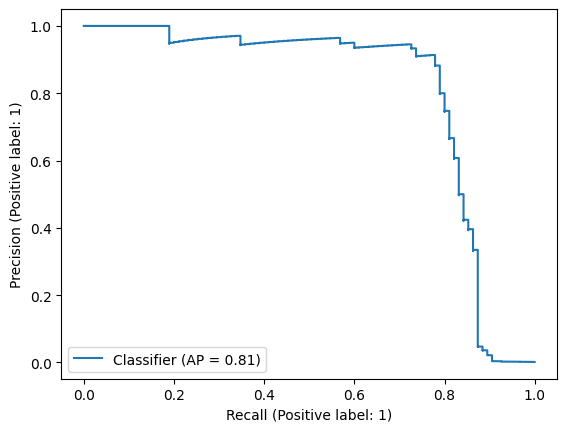

In [ ]:
y_pred_proba = svm_pipe2.predict_proba(X_test).loc[:,1]
PrecisionRecallDisplay.from_predictions(y_test,y_pred_proba);

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

#### SVM Conclusion

In [55]:
# Even optuna tuned SVM train scores are higher, the difference between the test and trains scores of threshold tuned vanilla SVC is lower that shows it generalizes better.
model = svm_pipe
predict_proba = model.predict_proba(X_test)

threshold = 0.23

y_pred_proba = predict_proba[:, 1] if 'numpy' in str(type(predict_proba)) else predict_proba.iloc[:, 1]
y_pred = (y_pred_proba >= threshold).astype(int)

svm_AP = average_precision_score(y_test, y_pred_proba)
svm_rec = recall_score(y_test, y_pred)
svm_f1 = f1_score(y_test,y_pred)
svm_matthews =  matthews_corrcoef(y_test, y_pred)

svm_AP,svm_rec,svm_f1,svm_matthews

(0.7995625976608309,
 0.7789473684210526,
 0.8409090909090909,
 0.8433372094127066)

### Random Forest Classifier with Unbalanced Data Techniques
   

#### Random Forest

***i. Model Training***

In [ ]:
operations = [
    # ('ct',ct),
    # ('iqr',OutlierCapping(factor=3)),
    ('rf', cuml.RandomForestClassifier(max_depth=6))
]

# Create the pipeline
rf_pipe = Pipeline(steps = operations)

# Fit the pipeline to the resampled data
rf_pipe.fit(X_train, y_train)



Pipeline(steps=[('rf', RandomForestClassifier())])

***ii. Prediction and Model Evaluating and Tuning***

In [ ]:
print("RF MODEL")
eval_metric(rf_pipe, X_train, y_train, X_test, y_test)

RF MODEL
Test_Set
[[55031     7]
 [   24    71]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.91      0.75      0.82        95

    accuracy                           1.00     55133
   macro avg       0.95      0.87      0.91     55133
weighted avg       1.00      1.00      1.00     55133

Matthews score: 0.8245334329775407

Train_Set
[[220137     15]
 [    75    303]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.95      0.80      0.87       378

    accuracy                           1.00    220530
   macro avg       0.98      0.90      0.94    220530
weighted avg       1.00      1.00      1.00    220530

Matthews score: 0.8737497793184323


***iii. Plot Precision and Recall Curve***


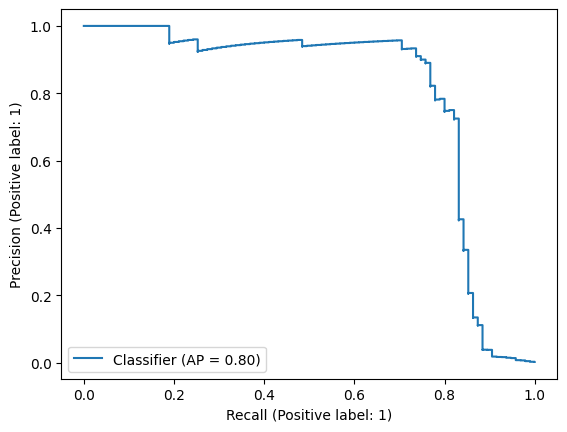

In [ ]:
y_pred_proba = rf_pipe.predict_proba(X_test).loc[:,1]
PrecisionRecallDisplay.from_predictions(y_test,y_pred_proba);

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [ ]:
train_ds = Dataset(X_train, label=y_train, cat_features=[])
test_ds = Dataset(X_test, label=y_test, cat_features=[])

evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, rf_pipe)
suite_result.show()
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json

deepchecks - WARNING - Cannot use model's built-in feature importance on a Scikit-learn Pipeline, using permutation feature importance calculation instead
deepchecks - INFO - Calculating permutation feature importance. Expected to finish in 22 seconds
INFO:deepchecks:Calculating permutation feature importance. Expected to finish in 22 seconds


<!--
 ~ ----------------------------------------------------------------------------
 ~ Copyright (C) 2021-2023 Deepchecks (https://www.deepchecks.com)
 ~
 ~ This file is part of Deepchecks.
 ~ Deepchecks is distributed under the terms of the GNU Affero General
 ~ Public License (version 3 or later).
 ~ You should have received a copy of the GNU Affero General Public License
 ~ along with Deepchecks. If not, see .
 ~ ----------------------------------------------------------------------------
 ~
-->
<!DOCTYPE html>
 
 
 
 Model Evaluation Suite

#### Random Forest Optuna Hyper parameter tuning


***i. Model Training***

In [ ]:
def get_model():
  operations = [
      ('ct',ct),
      ('iqr',OutlierCapping(factor=3)),
      ('rf', cuml.RandomForestClassifier(random_state=42))
  ]

  # Create the pipeline
  rf_pipe_temp = Pipeline(steps = operations)
  return rf_pipe_temp

In [ ]:
def objective(trial):
    # Sample hyperparameters
    max_depth = trial.suggest_int('max_depth', 2, 8)
    n_estimators = trial.suggest_int('n_estimators', 20, 150)
    criterion = trial.suggest_categorical('split_criterion',[0,1])
    # class_weight_0 = 1  # Fixed weight for class 0
    # class_weight_1 = trial.suggest_uniform('class_weight_1', 1, 10)  # Range of weights for class 1
    max_features = trial.suggest_categorical('max_features', ['auto','sqrt','log2'])

    # Create class weight dictionary
    # class_weight = {0: class_weight_0, 1: class_weight_1}

    features = X_train.columns
    train = X_train
    train_target = y_train.values

    train_oof = np.zeros((train.shape[0],))

    n_fold = 5

    kf = StratifiedKFold(n_splits=n_fold, random_state=42, shuffle=True)


    # ref:https://github.com/tunguz/TabularBenchmarks/blob/main/datasets/credit_card_fraud_detection/scripts/HGB_5_Fold_0.ipynb

    for fold, (idx_tr, idx_va) in enumerate(kf.split(train, train_target)):
        X_tr = train.iloc[idx_tr][features]
        X_va = train.iloc[idx_va][features]
        y_tr = train_target[idx_tr]
        y_va = train_target[idx_va]
        # print(f'Fold: {fold}')
        clf = get_model()
        params = {'rf__max_depth': max_depth, 'rf__n_estimators':n_estimators,'rf__split_criterion': criterion, 'rf__max_features':max_features}
        clf.set_params(**params)
        clf.fit(X_tr, y_tr)
        val_predictions = clf.predict(X_va)
        train_oof[idx_va] = val_predictions
        score = recall_score(y_va, val_predictions)
        # print(f'Fold: {fold} - score {score:.2}')

    # Perform cross-validation and calculate the recall score for class 1
    # cv_results = cross_validate(model, X, y, cv=5,scoring=scorer)

    # Calculate the mean recall for class 1 across the cross-validation folds
    # mean_recall = cv_results['test_score'].mean()
    score_mean = recall_score(y_train,train_oof)

    return score_mean

study = optuna.create_study(direction='maximize')

[I 2023-07-18 15:34:30,285] A new study created in memory with name: no-name-33ac9920-c685-4883-82d7-db48d74820dd


In [ ]:
study.optimize(objective, n_trials=10)

[I 2023-07-14 00:04:48,036] Trial 0 finished with value: 0.7645502645502645 and parameters: {'max_depth': 6, 'n_estimators': 87, 'split_criterion': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7645502645502645.
[I 2023-07-14 00:05:15,444] Trial 1 finished with value: 0.7592592592592593 and parameters: {'max_depth': 5, 'n_estimators': 128, 'split_criterion': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7645502645502645.
[I 2023-07-14 00:05:37,235] Trial 2 finished with value: 0.7592592592592593 and parameters: {'max_depth': 6, 'n_estimators': 41, 'split_criterion': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.7645502645502645.
[I 2023-07-14 00:05:57,548] Trial 3 finished with value: 0.6798941798941799 and parameters: {'max_depth': 3, 'n_estimators': 31, 'split_criterion': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.7645502645502645.
[I 2023-07-14 00:06:20,493] Trial 4 finished with value: 0.7592592592592593 and parameters: {'max_depth

In [ ]:
# Get the best hyperparameters and their corresponding recall
best_params = {'max_depth': 8, 'n_estimators': 86, 'split_criterion': 0, 'max_features': 'log2'}
# best_params = study.best_params
# best_recall = study.best_value

print("Best hyperparameters:", best_params)
# print("Best Recall:", best_recall)

Best hyperparameters: {'max_depth': 8, 'n_estimators': 86, 'split_criterion': 0, 'max_features': 'log2'}


In [ ]:
best_params = {'max_depth': 8, 'n_estimators': 86, 'split_criterion': 0, 'max_features': 'log2'}
rf_pipe2 = get_model()
prefixed_parameters = {'rf__' + key: value for key, value in best_params.items()}
rf_pipe2.set_params(**prefixed_parameters)
rf_pipe2.fit(X_train,y_train)

Pipeline(steps=[('ct',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('power_transformer',
                                                  PowerTransformer(),
                                                  ['V1', 'V2', 'V3', 'V5',
                                                   'V10', 'V12', 'V14', 'V16',
                                                   'V17', 'V20', 'V23', 'V28',
                                                   'Amount'])],
                                   verbose_feature_names_out=False)),
                ('iqr', OutlierCapping(factor=3)),
                ('rf', RandomForestClassifier())])

***ii. Prediction and Model Evaluating and Tuning***

In [ ]:
print("RF MODEL")
eval_metric(rf_pipe2, X_train, y_train, X_test, y_test)

RF MODEL
Test_Set
[[55032     6]
 [   24    71]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.92      0.75      0.83        95

    accuracy                           1.00     55133
   macro avg       0.96      0.87      0.91     55133
weighted avg       1.00      1.00      1.00     55133

Matthews score: 0.8298829162473497

Train_Set
[[220147      5]
 [    67    311]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.98      0.82      0.90       378

    accuracy                           1.00    220530
   macro avg       0.99      0.91      0.95    220530
weighted avg       1.00      1.00      1.00    220530

Matthews score: 0.8997001937466171


***iii. Plot Precision and Recall Curve***


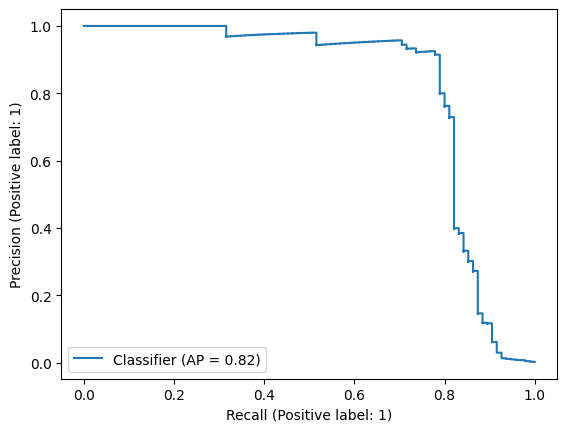

In [ ]:
y_pred_proba = rf_pipe2.predict_proba(X_test).loc[:,1]
PrecisionRecallDisplay.from_predictions(y_test,y_pred_proba);

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [ ]:
train_ds = Dataset(X_train, label=y_train, cat_features=[])
test_ds = Dataset(X_test, label=y_test, cat_features=[])

evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, rf_pipe2)
suite_result.show()
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json

# Passed the test

deepchecks - WARNING - Cannot use model's built-in feature importance on a Scikit-learn Pipeline, using permutation feature importance calculation instead
deepchecks - INFO - Calculating permutation feature importance. Expected to finish in 33 seconds
INFO:deepchecks:Calculating permutation feature importance. Expected to finish in 33 seconds


<!--
 ~ ----------------------------------------------------------------------------
 ~ Copyright (C) 2021-2023 Deepchecks (https://www.deepchecks.com)
 ~
 ~ This file is part of Deepchecks.
 ~ Deepchecks is distributed under the terms of the GNU Affero General
 ~ Public License (version 3 or later).
 ~ You should have received a copy of the GNU Affero General Public License
 ~ along with Deepchecks. If not, see .
 ~ ----------------------------------------------------------------------------
 ~
-->
<!DOCTYPE html>
 
 
 
 Model Evaluation Suite


#### Random Forest with SHAP


In [56]:
operations = [
      ('ct',ct),
      ('iqr',OutlierCapping(factor=3)),
      ('rf', cuml.RandomForestClassifier(max_depth= 8, n_estimators= 86, split_criterion= 0, max_features = 'log2',random_state=42))
  ]
  # Create the pipeline
rf_pipe3 = Pipeline(steps = operations)

In [57]:
rf_pipe3.fit(X_train,y_train)

Pipeline(steps=[('ct',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('power_transformer',
                                                  PowerTransformer(),
                                                  ['V1', 'V2', 'V3', 'V5',
                                                   'V10', 'V12', 'V14', 'V16',
                                                   'V17', 'V20', 'V23', 'V28',
                                                   'Amount'])],
                                   verbose_feature_names_out=False)),
                ('iqr', OutlierCapping(factor=3)),
                ('rf', RandomForestClassifier())])

In [58]:
explainer = cuml.explainer.TreeExplainer(model=rf_pipe3['rf'])
observations = rf_pipe3['ct'].transform(X_train)
observations = rf_pipe3['iqr'].transform(observations)
shap_values = explainer.shap_values(observations).get()

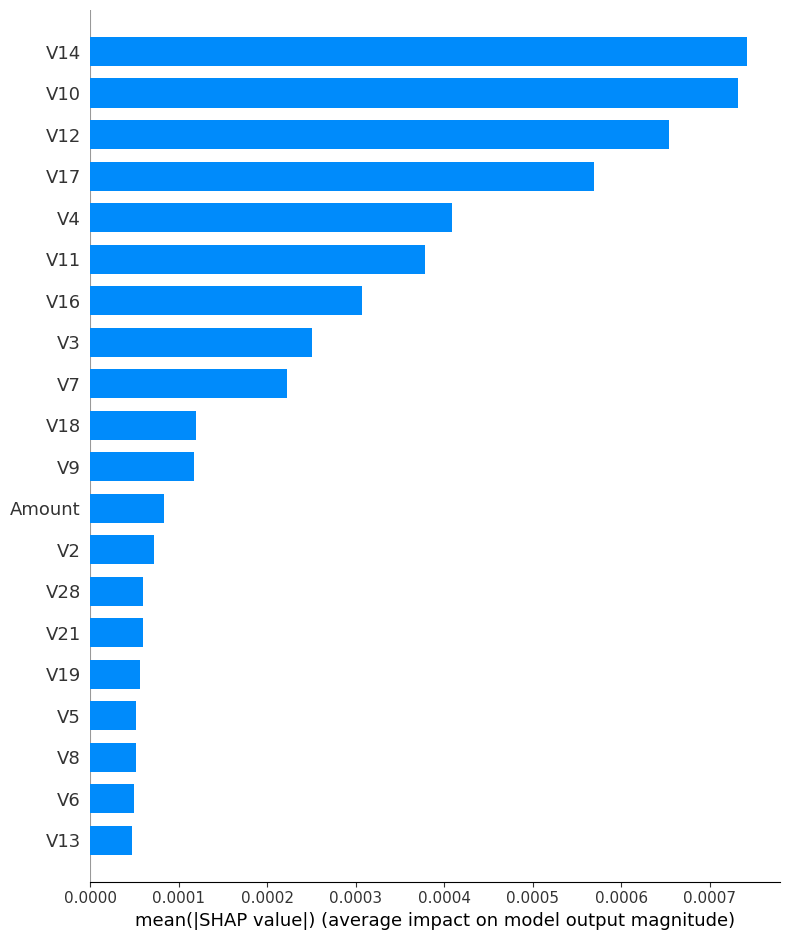

In [59]:
# because cuml shap explainer gives two classes shap values(format:(# classes * # samples x # features) unlike shap (# samples x # features) we select shap_values[1]
shap.summary_plot(shap_values[1],observations, plot_type='bar')

In [60]:
shap_features = ['V12','V14','V17','V10','V11','V4','V3','V16']

In [61]:
X_train2 = X_train.loc[:,shap_features]
X_test2 = X_test.loc[:,shap_features]

In [62]:
power_columns_shap = list(set(power_columns).intersection(set(shap_features)))
power_columns_shap

['V3', 'V12', 'V14', 'V10', 'V16', 'V17']

In [63]:
ct_shap = ColumnTransformer(
    [
        ('power_transformer', PowerTransformer(method='yeo-johnson', standardize = True), power_columns_shap),
    ],
    remainder='passthrough',# Pass through any remaining columns
    verbose_feature_names_out = False
).set_output(transform="pandas")

***i. Model Training***

In [ ]:
def get_model():
  operations = [
      #('ct',ct_shap),
      #('iqr',OutlierCapping(factor=3)), # I got better results without powertransformer and capping
      ('rf', cuml.RandomForestClassifier())
  ]

  # Create the pipeline
  rf_pipe_temp = Pipeline(steps = operations)
  return rf_pipe_temp

In [ ]:
def objective(trial):
    # Sample hyperparameters
    max_depth = trial.suggest_int('max_depth', 2, 15)
    n_estimators = trial.suggest_int('n_estimators', 20, 150)
    criterion = trial.suggest_categorical('split_criterion',[0,1])
    # class_weight_0 = 1  # Fixed weight for class 0
    # class_weight_1 = trial.suggest_uniform('class_weight_1', 1, 10)  # Range of weights for class 1
    max_features = trial.suggest_categorical('max_features', ['auto','sqrt','log2'])

    # Create class weight dictionary
    # class_weight = {0: class_weight_0, 1: class_weight_1}

    features = X_train2.columns
    train = X_train2
    train_target = y_train.values

    train_oof = np.zeros((train.shape[0],))

    n_fold = 5

    kf = StratifiedKFold(n_splits=n_fold, random_state=42, shuffle=True)


    # ref:https://github.com/tunguz/TabularBenchmarks/blob/main/datasets/credit_card_fraud_detection/scripts/HGB_5_Fold_0.ipynb

    for fold, (idx_tr, idx_va) in enumerate(kf.split(train, train_target)):
        X_tr = train.iloc[idx_tr][features]
        X_va = train.iloc[idx_va][features]
        y_tr = train_target[idx_tr]
        y_va = train_target[idx_va]
        # print(f'Fold: {fold}')
        clf = get_model()
        params = {'rf__max_depth': max_depth, 'rf__n_estimators':n_estimators,'rf__split_criterion': criterion, 'rf__max_features':max_features}
        clf.set_params(**params)
        clf.fit(X_tr, y_tr)
        val_predictions = clf.predict(X_va)
        train_oof[idx_va] = val_predictions
        score = recall_score(y_va, val_predictions)
        # print(f'Fold: {fold} - score {score:.2}')

    # Perform cross-validation and calculate the recall score for class 1
    # cv_results = cross_validate(model, X, y, cv=5,scoring=scorer)

    # Calculate the mean recall for class 1 across the cross-validation folds
    # mean_recall = cv_results['test_score'].mean()
    score_mean = recall_score(y_train,train_oof)

    return score_mean

study = optuna.create_study(direction='maximize')

[I 2023-07-14 00:19:04,233] A new study created in memory with name: no-name-21a108d8-1862-4617-a3c6-53e7b92d35f9


In [ ]:
study.optimize(objective, n_trials=10)

[I 2023-07-14 00:19:14,917] Trial 0 finished with value: 0.791005291005291 and parameters: {'max_depth': 8, 'n_estimators': 99, 'split_criterion': 1, 'max_features': 'log2'}. Best is trial 0 with value: 0.791005291005291.
[I 2023-07-14 00:19:18,346] Trial 1 finished with value: 0.7671957671957672 and parameters: {'max_depth': 6, 'n_estimators': 53, 'split_criterion': 0, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.791005291005291.
[I 2023-07-14 00:19:22,424] Trial 2 finished with value: 0.7883597883597884 and parameters: {'max_depth': 14, 'n_estimators': 42, 'split_criterion': 0, 'max_features': 'log2'}. Best is trial 0 with value: 0.791005291005291.
[I 2023-07-14 00:19:30,839] Trial 3 finished with value: 0.7751322751322751 and parameters: {'max_depth': 15, 'n_estimators': 79, 'split_criterion': 0, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.791005291005291.
[I 2023-07-14 00:19:37,251] Trial 4 finished with value: 0.7857142857142857 and parameters: {'max_depth': 7

In [ ]:
# Get the best hyperparameters and their corresponding recall
best_params = study.best_params
best_recall = study.best_value

print("Best hyperparameters:", best_params)
print("Best Recall:", best_recall)

In [ ]:
best_params = {'max_depth': 8, 'n_estimators': 99, 'split_criterion': 1, 'max_features': 'log2'}
rf_pipe4 = get_model()
prefixed_parameters = {'rf__' + key: value for key, value in best_params.items()}
rf_pipe4.set_params(**prefixed_parameters)
rf_pipe4.fit(X_train2,y_train)

Pipeline(steps=[('rf', RandomForestClassifier())])

***ii. Prediction and Model Evaluating and Tuning***

In [ ]:
print("RF MODEL")
eval_metric(rf_pipe4, X_train2, y_train, X_test2, y_test)

RF MODEL
Test_Set
[[55027    11]
 [   23    72]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.87      0.76      0.81        95

    accuracy                           1.00     55133
   macro avg       0.93      0.88      0.90     55133
weighted avg       1.00      1.00      1.00     55133

Matthews score: 0.8105312550623475

Train_Set
[[220116     36]
 [    63    315]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.90      0.83      0.86       378

    accuracy                           1.00    220530
   macro avg       0.95      0.92      0.93    220530
weighted avg       1.00      1.00      1.00    220530

Matthews score: 0.8645681584116631


***iii. Plot Precision and Recall Curve***


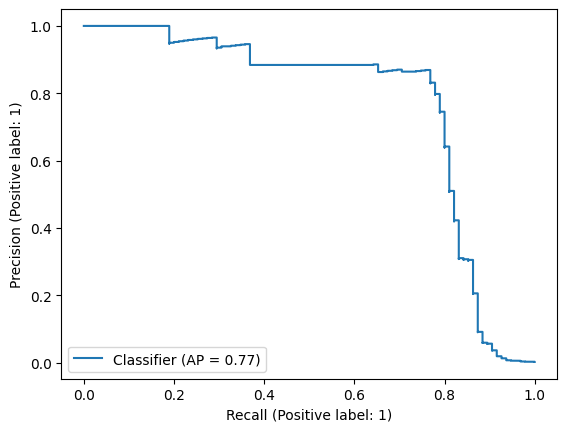

In [ ]:
y_pred_proba = rf_pipe4.predict_proba(X_test2).loc[:,1]
PrecisionRecallDisplay.from_predictions(y_test,y_pred_proba);

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [ ]:
train_ds = Dataset(X_train2, label=y_train, cat_features=[])
test_ds = Dataset(X_test2, label=y_test, cat_features=[])

evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, rf_pipe4)
suite_result.show()
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json

# Passed the test

deepchecks - WARNING - Cannot use model's built-in feature importance on a Scikit-learn Pipeline, using permutation feature importance calculation instead
deepchecks - INFO - Calculating permutation feature importance. Expected to finish in 6 seconds
INFO:deepchecks:Calculating permutation feature importance. Expected to finish in 6 seconds


<!--
 ~ ----------------------------------------------------------------------------
 ~ Copyright (C) 2021-2023 Deepchecks (https://www.deepchecks.com)
 ~
 ~ This file is part of Deepchecks.
 ~ Deepchecks is distributed under the terms of the GNU Affero General
 ~ Public License (version 3 or later).
 ~ You should have received a copy of the GNU Affero General Public License
 ~ along with Deepchecks. If not, see .
 ~ ----------------------------------------------------------------------------
 ~
-->
<!DOCTYPE html>
 
 
 
 Model Evaluation Suite

#### Random Forest SMOTE + SHAP + AUTOML

***i. Model Training***

In [64]:
rf_automl = AutoML()

settings = {
    "time_budget": 30,  # total running time in seconds
    "metric": custom_metric_mcc, #'accuracy',
    "estimator_list": ['rf'],  # list of ML learners; we tune XGBoost in this example
    "task": 'classification',  # task type
    "seed": 42  # random seed
}

settings["custom_hp"] = {
    "rf": {
        # "n_estimators": {
        #     "domain": tune.randint(5,15),
        #     "init_value": 10
        # },
        # "max_depth": {
        #     "domain": tune.randint(3,5),
        #     "init_value": 3
        # },
        # "class_weight": {
        #      "domain": [{0:1,1:4}]
        # }
        # "objective": {
        #     "domain": 'binary',
        #     "init_value": 'binary'
        # }
        # "colsample_bytree": {
        #     "domain": 0.8,
        #     "init_value": 0.8
        # }
    }
}
pipeline_settings = {
    f"automl__{key}": value for key, value in settings.items()
}

# Define the number of majority and minority samples to be used for resampling
y_train_majority_number = int(y_train.value_counts()[0] * 0.70)
y_train_minority_number = int(y_train.value_counts()[1] * 1.30)

# Define the resampling techniques
over = SMOTE(sampling_strategy={1: y_train_minority_number})
under = RandomUnderSampler(sampling_strategy={0: y_train_majority_number})

# Define the operations/steps for the pipeline
operations = [
    #('ct',ct_shap),
    #('iqr',OutlierCapping(factor=3)),
    ('o', over),
    ('u', under),
    ('automl', rf_automl)
]

# Create the pipeline
rf_pipe5 = imbpipeline(steps = operations)

# Fit the pipeline to the resampled data
rf_pipe5.fit(X_train2, y_train, **pipeline_settings)

[flaml.automl.logger: 07-19 17:06:51] {1693} INFO - task = classification
[flaml.automl.logger: 07-19 17:06:51] {1700} INFO - Data split method: stratified
[flaml.automl.logger: 07-19 17:06:51] {1703} INFO - Evaluation method: holdout
[flaml.automl.logger: 07-19 17:06:51] {1801} INFO - Minimizing error metric: customized metric
[flaml.automl.logger: 07-19 17:06:51] {1911} INFO - List of ML learners in AutoML Run: ['rf']
[flaml.automl.logger: 07-19 17:06:51] {2221} INFO - iteration 0, current learner rf
[flaml.automl.logger: 07-19 17:06:51] {2347} INFO - Estimated sufficient time budget=19068s. Estimated necessary time budget=19s.
[flaml.automl.logger: 07-19 17:06:51] {2394} INFO -  at 0.7s,	estimator rf's best error=0.2535,	best estimator rf's best error=0.2535
[flaml.automl.logger: 07-19 17:06:51] {2221} INFO - iteration 1, current learner rf
[flaml.automl.logger: 07-19 17:06:52] {2394} INFO -  at 0.9s,	estimator rf's best error=0.2469,	best estimator rf's best error=0.2469
[flaml.aut

Pipeline(steps=[('o', SMOTE(sampling_strategy={1: 491})),
                ('u', RandomUnderSampler(sampling_strategy={0: 154106})),
                ('automl',
                 AutoML(append_log=False, auto_augment=True, custom_hp={},
                        cv_score_agg_func=None, early_stop=False,
                        ensemble=False, estimator_list='auto',
                        eval_method='auto', fit_kwargs_by_estimator={},
                        force_cancel=False, free_mem_ratio=0, hpo_method='auto',
                        keep_search_state=False, learner_selector='sample',
                        log_file_name='', log_training_metric=False,
                        log_type='better', max_iter=None, mem_thres=4294967296,
                        metric='auto', metric_constraints=[],
                        min_sample_size=10000, mlflow_logging=True,
                        model_history=False, n_concurrent_trials=1, n_jobs=-1,
                        n_splits=5, pred_time_limit=inf,
                        preserve_checkpoint=True, retrain_full=True, ...))])

***ii. Prediction and Model Evaluating and Tuning***

In [65]:
print("RF MODEL")
eval_metric(rf_pipe5, X_train2, y_train, X_test2, y_test)

RF MODEL
Test_Set
[[55028    10]
 [   23    72]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.88      0.76      0.81        95

    accuracy                           1.00     55133
   macro avg       0.94      0.88      0.91     55133
weighted avg       1.00      1.00      1.00     55133

Matthews score: 0.8154706899333375

Train_Set
[[220129     23]
 [    71    307]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.93      0.81      0.87       378

    accuracy                           1.00    220530
   macro avg       0.96      0.91      0.93    220530
weighted avg       1.00      1.00      1.00    220530

Matthews score: 0.8690250531435036


***iii. Plot Precision and Recall Curve***


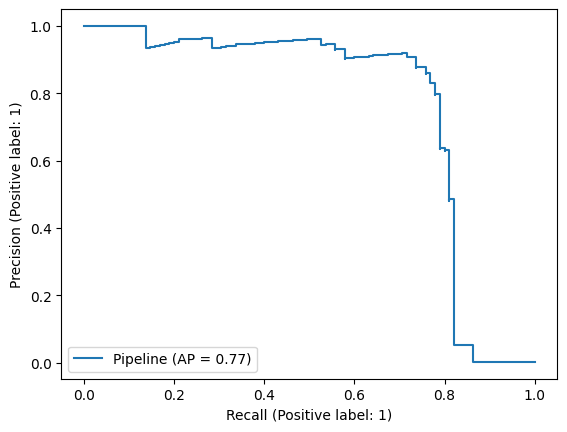

In [66]:
PrecisionRecallDisplay.from_estimator(rf_pipe5,
                                      X_test2,
                                      y_test);

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [ ]:
train_ds = Dataset(X_train2, label=y_train, cat_features=[])
test_ds = Dataset(X_test2, label=y_test, cat_features=[])

evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, rf_pipe5)
suite_result.show()
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json

# Passed the test

deepchecks - WARNING - Cannot use model's built-in feature importance on a Scikit-learn Pipeline, using permutation feature importance calculation instead
deepchecks - INFO - Calculating permutation feature importance. Expected to finish in 8 seconds
INFO:deepchecks:Calculating permutation feature importance. Expected to finish in 8 seconds


<!--
 ~ ----------------------------------------------------------------------------
 ~ Copyright (C) 2021-2023 Deepchecks (https://www.deepchecks.com)
 ~
 ~ This file is part of Deepchecks.
 ~ Deepchecks is distributed under the terms of the GNU Affero General
 ~ Public License (version 3 or later).
 ~ You should have received a copy of the GNU Affero General Public License
 ~ along with Deepchecks. If not, see .
 ~ ----------------------------------------------------------------------------
 ~
-->
<!DOCTYPE html>
 
 
 
 Model Evaluation Suite

#### Random Forest Conclusion

In [67]:
# Random Forest trained with 8 important features selected according to Shap explainer, and added SMOTE on top of that gave close scores compared with 29 features.
# Recall scores better. Passed the tests.

model = rf_pipe5

# save the metrcis to compare in the end
y_pred = model.predict(X_test2)
y_pred_proba= model.predict_proba(X_test2)[:,1]

rf_AP = average_precision_score(y_test, y_pred_proba)
rf_rec = recall_score(y_test, y_pred)
rf_f1 = f1_score(y_test,y_pred)
rf_matthews =  matthews_corrcoef(y_test, y_pred)

rf_AP, rf_rec, rf_f1, rf_matthews

(0.766185526280247, 0.7578947368421053, 0.8135593220338984, 0.8154706899333375)

### XGBoost Classifier with Unbalanced Data Techniques

#### XGBoost vanilla model

***i. Model Training***

In [68]:
capper3 = OutlierCapping(factor=3)
capper3.fit(ct.transform(X_train))
operations = [
      ('ct',ct),
      ('iqr',capper3),
      ('xgb', XGBClassifier(tree_method='gpu_hist', max_depth=3, scale_pos_weight=7))
]

pipe_params = {
    'xgb__eval_set': [(capper3.transform(ct.transform(X_test)), y_test)],
    'xgb__early_stopping_rounds': 2,
    'xgb__verbose': False
}

  # Create the pipeline
xgb_pipe = Pipeline(steps = operations)
xgb_pipe.fit(X_train, y_train, **pipe_params)

# got better results with iqr and ct
# early stop and max_depth 3 prevented overfitting

Pipeline(steps=[('ct',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('power_transformer',
                                                  PowerTransformer(),
                                                  ['V1', 'V2', 'V3', 'V5',
                                                   'V10', 'V12', 'V14', 'V16',
                                                   'V17', 'V20', 'V23', 'V28',
                                                   'Amount'])],
                                   verbose_feature_names_out=False)),
                ('iqr', OutlierCapping(factor=3)),
                ('xgb',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=N...
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=3, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, n_estimators=100,
                               n_jobs=None, num_parallel_tree=None,
                               predictor=None, random_state=None, ...))])

***ii. Prediction and Model Evaluating and Tuning***

In [69]:
print("XGB Model")
eval_metric(xgb_pipe, X_train, y_train, X_test, y_test)

XGB Model
Test_Set
[[55019    19]
 [   18    77]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.80      0.81      0.81        95

    accuracy                           1.00     55133
   macro avg       0.90      0.91      0.90     55133
weighted avg       1.00      1.00      1.00     55133

Matthews score: 0.8059576819985212

Train_Set
[[220101     51]
 [    40    338]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.87      0.89      0.88       378

    accuracy                           1.00    220530
   macro avg       0.93      0.95      0.94    220530
weighted avg       1.00      1.00      1.00    220530

Matthews score: 0.8812402421733904


***iii. Plot Precision and Recall Curve***


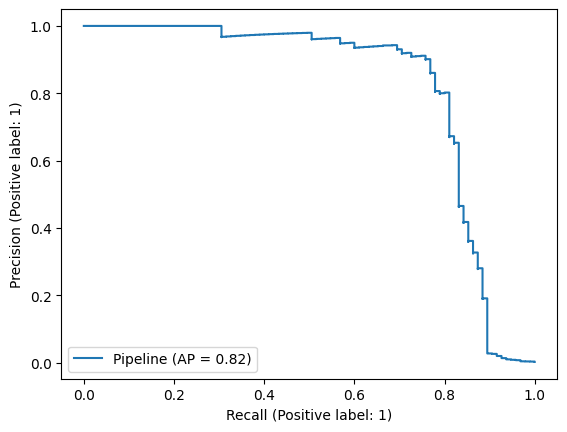

In [70]:
from sklearn.metrics import PrecisionRecallDisplay, average_precision_score

PrecisionRecallDisplay.from_estimator(xgb_pipe,
                                      X_test,
                                      y_test);

***iv. Feature importance***

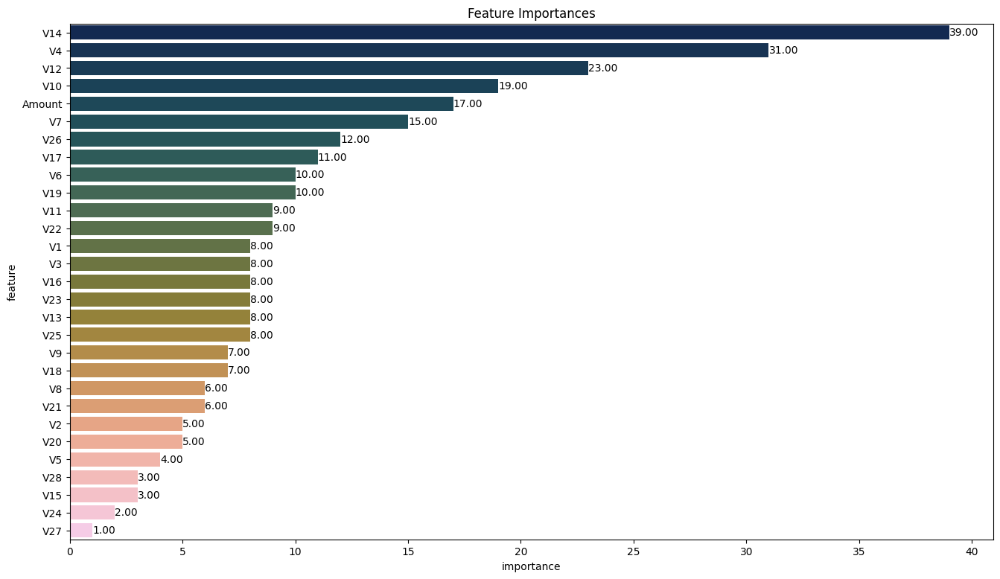

In [ ]:
# get_fscore() directly returns a dict with feature names mapped to the gain importances.
importance = xgb_pipe['xgb'].get_booster().get_fscore()
importance = sorted(importance.items(), key=lambda x: x[1], reverse=True)

features = [x[0] for x in importance]
importances = [x[1] for x in importance]

df_feature_importance = pd.DataFrame({'feature': features, 'importance': importances})

plt.figure(figsize=(16, 9))
ax = sns.barplot(x='importance', y='feature', data=df_feature_importance, palette='cmc.batlow')
plt.title('Feature Importances')
plt.bar_label(ax.containers[0],fmt='%.2f')
plt.show()

In [ ]:
explainer = shap.TreeExplainer(model=xgb_pipe['xgb'])
observations = xgb_pipe['ct'].transform(X_train)
observations = xgb_pipe['iqr'].transform(observations)
shap_values = explainer.shap_values(observations)

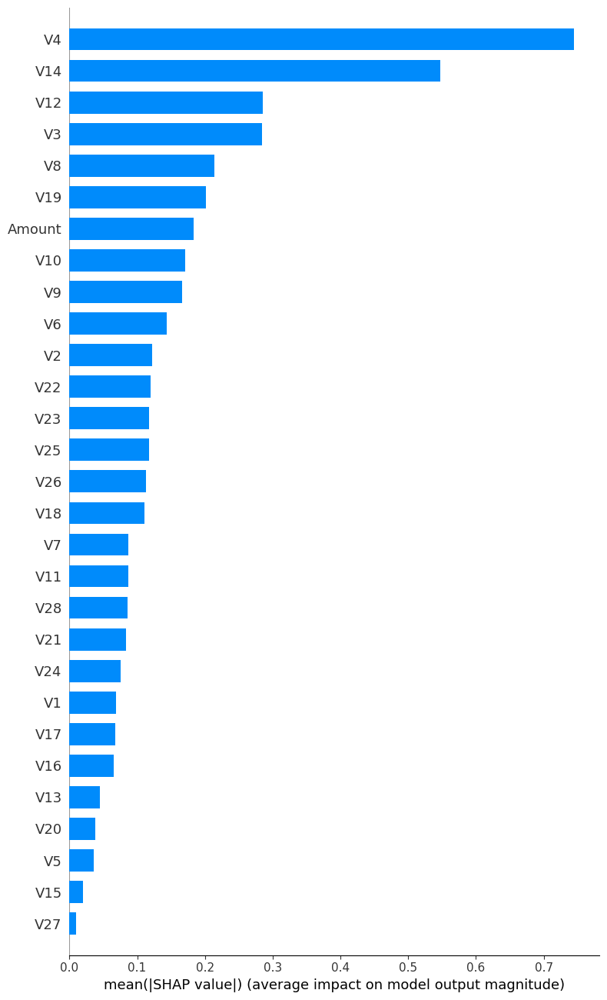

In [ ]:
# SHAP values may be more appropriate for complex models or models with many interacting features.
shap.summary_plot(shap_values,observations, plot_type='bar', max_display=29)

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [ ]:
train_ds = Dataset(X_train, label=y_train, cat_features=[])
test_ds = Dataset(X_test, label=y_test, cat_features=[])

evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, xgb_pipe)
suite_result.show()
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json

# Passed the test

deepchecks - WARNING - Cannot use model's built-in feature importance on a Scikit-learn Pipeline, using permutation feature importance calculation instead
deepchecks - INFO - Calculating permutation feature importance. Expected to finish in 36 seconds
INFO:deepchecks:Calculating permutation feature importance. Expected to finish in 36 seconds


<!--
 ~ ----------------------------------------------------------------------------
 ~ Copyright (C) 2021-2023 Deepchecks (https://www.deepchecks.com)
 ~
 ~ This file is part of Deepchecks.
 ~ Deepchecks is distributed under the terms of the GNU Affero General
 ~ Public License (version 3 or later).
 ~ You should have received a copy of the GNU Affero General Public License
 ~ along with Deepchecks. If not, see .
 ~ ----------------------------------------------------------------------------
 ~
-->
<!DOCTYPE html>
 
 
 
 Model Evaluation Suite

#### XGBoost AutoML

***i. Model Training***

In [ ]:
from sklearn.utils import class_weight
classes_weights = class_weight.compute_sample_weight(class_weight='balanced',
                                                     y=y_train)
classes_weights

array([  0.5008585 ,   0.5008585 ,   0.5008585 , ..., 291.70634921,
         0.5008585 ,   0.5008585 ])

In [ ]:
xgb_automl = AutoML()

settings = {
    "time_budget": 30,  # total running time in seconds
    "metric": custom_metric_mcc, #'accuracy',
    "estimator_list": ['xgboost'],  # list of ML learners; we tune XGBoost in this example
    "task": 'classification',  # task type
    "seed": 42  # random seed
}

settings["custom_hp"] = {
    "xgboost": {
        # "n_estimators": {
        #     "domain": tune.randint(5,15),
        #     "init_value": 10
        # },
        # "max_depth": {
        #     "domain": tune.randint(3,5),
        #     "init_value": 3
        # },
        # "objective": {
        #     "domain": binary_cross_entropy,
        #     "init_value": binary_cross_entropy
        # }
        # "colsample_bytree": {
        #     "domain": 0.8,
        #     "init_value": 0.8
        # }
        "scale_pos_weight": {
            "domain": tune.randint(3,100),
            "init_value": 3
        },
        "tree_method": {
            "domain": 'gpu_hist',
        },
        # "eval_metric": {
        #     "domain": 'aucpr',
        # }
    }
}

pipeline_settings = {
    f"automl__{key}": value for key, value in settings.items()
}

operations = [
    ('ct',ct),
    #('iqr',OutlierCapping(factor=3)),
    ("automl", xgb_automl)
]

xgb_pipe2 = Pipeline(steps=operations)

xgb_pipe2.fit(X_train, y_train, **pipeline_settings)

[flaml.automl.logger: 07-18 20:17:27] {1693} INFO - task = classification
[flaml.automl.logger: 07-18 20:17:27] {1700} INFO - Data split method: stratified
[flaml.automl.logger: 07-18 20:17:27] {1703} INFO - Evaluation method: holdout
[flaml.automl.logger: 07-18 20:17:27] {1801} INFO - Minimizing error metric: customized metric
[flaml.automl.logger: 07-18 20:17:27] {1911} INFO - List of ML learners in AutoML Run: ['xgboost']
[flaml.automl.logger: 07-18 20:17:27] {2221} INFO - iteration 0, current learner xgboost
[flaml.automl.logger: 07-18 20:17:27] {2347} INFO - Estimated sufficient time budget=28625s. Estimated necessary time budget=29s.
[flaml.automl.logger: 07-18 20:17:27] {2394} INFO -  at 3.4s,	estimator xgboost's best error=0.2521,	best estimator xgboost's best error=0.2521
[flaml.automl.logger: 07-18 20:17:27] {2221} INFO - iteration 1, current learner xgboost
[flaml.automl.logger: 07-18 20:17:28] {2394} INFO -  at 3.5s,	estimator xgboost's best error=0.2521,	best estimator xgb

Pipeline(steps=[('ct',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('power_transformer',
                                                  PowerTransformer(),
                                                  ['V1', 'V2', 'V3', 'V5',
                                                   'V10', 'V12', 'V14', 'V16',
                                                   'V17', 'V20', 'V23', 'V28',
                                                   'Amount'])],
                                   verbose_feature_names_out=False)),
                ('automl',
                 AutoML(append_log=False, auto_augment=True, custom_hp={},
                        cv_score_agg_func=None, early_stop=False,
                        ensemble=Fal...
                        keep_search_state=False, learner_selector='sample',
                        log_file_name='', log_training_metric=False,
                        log_type='better', max_iter=None, mem_thres=4294967296,
                        metric='auto', metric_constraints=[],
                        min_sample_size=10000, mlflow_logging=True,
                        model_history=False, n_concurrent_trials=1, n_jobs=-1,
                        n_splits=5, pred_time_limit=inf,
                        preserve_checkpoint=True, retrain_full=True, ...))])

In [ ]:
'''retrieve best config and best learner'''
print('Best ML leaner:', xgb_automl.best_estimator)
print('Best hyperparmeter config:', xgb_automl.best_config)
print('Best score on validation data: {0:.4g}'.format(1-xgb_automl.best_loss))
print('Training duration of best run: {0:.4g} s'.format(xgb_automl.best_config_train_time))

Best ML leaner: xgboost
Best hyperparmeter config: {'n_estimators': 5, 'max_leaves': 4, 'min_child_weight': 0.5140110264448724, 'learning_rate': 0.8807468461306526, 'subsample': 0.8215429509088616, 'colsample_bylevel': 0.7315370089998361, 'colsample_bytree': 1.0, 'reg_alpha': 0.0009765625, 'reg_lambda': 0.43476185220243824, 'scale_pos_weight': 3, 'tree_method': 'gpu_hist'}
Best score on validation data: 0.9022
Training duration of best run: 1.098 s


***ii. Prediction and Model Evaluating and Tuning***

In [ ]:
print("XGB-Tuned MODEL")
eval_metric(xgb_pipe2, X_train, y_train, X_test, y_test)

XGB-Tuned MODEL
Test_Set
[[55018    20]
 [   22    73]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.78      0.77      0.78        95

    accuracy                           1.00     55133
   macro avg       0.89      0.88      0.89     55133
weighted avg       1.00      1.00      1.00     55133

Matthews score: 0.7762583175979342

Train_Set
[[220087     65]
 [    78    300]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.82      0.79      0.81       378

    accuracy                           1.00    220530
   macro avg       0.91      0.90      0.90    220530
weighted avg       1.00      1.00      1.00    220530

Matthews score: 0.8073363483215807


***iii. Plot Precision and Recall Curve***


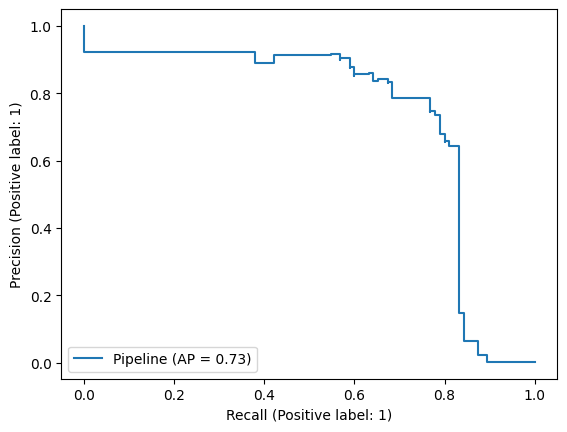

In [ ]:
from sklearn.metrics import PrecisionRecallDisplay, average_precision_score
PrecisionRecallDisplay.from_estimator(xgb_pipe2,X_test,y_test);

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html



```
# This is formatted as code
```

#### XGBoost AutoML

***i. Model Training***

In [ ]:
xgb_automl2 = AutoML()

settings = {
    "time_budget": 30,  # total running time in seconds
    "metric": custom_metric_recall, #'accuracy',
    "estimator_list": ['xgboost'],  # list of ML learners; we tune XGBoost in this example
    "task": 'classification',  # task type
    "seed": 42  # random seed
}

settings["custom_hp"] = {
    "xgboost": {
        # "n_estimators": {
        #     "domain": tune.randint(5,15),
        #     "init_value": 10
        # },
        # "sample_weight": {
        #     "domain": classes_weights
        # }
        # "objective": {
        #     "domain": binary_cross_entropy,
        #     "init_value": binary_cross_entropy
        # }
        # "colsample_bytree": {
        #     "domain": 0.8,
        #     "init_value": 0.8
        # }
        "scale_pos_weight": {
            "domain": tune.randint(3,100),
            "init_value": 3
        },
        "tree_method": {
            "domain": 'gpu_hist',
        }
    }
}

pipeline_settings = {
    f"automl__{key}": value for key, value in settings.items()
}

operations = [
    ('ct',ct),
    #('iqr',OutlierCapping(factor=3)),
    ("automl", xgb_automl2)
]

xgb_pipe3 = Pipeline(steps=operations)

xgb_pipe3.fit(X_train, y_train, **pipeline_settings)

[flaml.automl.logger: 07-18 20:15:55] {1693} INFO - task = classification
[flaml.automl.logger: 07-18 20:15:55] {1700} INFO - Data split method: stratified
[flaml.automl.logger: 07-18 20:15:55] {1703} INFO - Evaluation method: holdout
[flaml.automl.logger: 07-18 20:15:56] {1801} INFO - Minimizing error metric: customized metric
[flaml.automl.logger: 07-18 20:15:56] {1911} INFO - List of ML learners in AutoML Run: ['xgboost']
[flaml.automl.logger: 07-18 20:15:56] {2221} INFO - iteration 0, current learner xgboost
[flaml.automl.logger: 07-18 20:15:56] {2347} INFO - Estimated sufficient time budget=31671s. Estimated necessary time budget=32s.
[flaml.automl.logger: 07-18 20:15:56] {2394} INFO -  at 4.2s,	estimator xgboost's best error=0.2873,	best estimator xgboost's best error=0.2873
[flaml.automl.logger: 07-18 20:15:56] {2221} INFO - iteration 1, current learner xgboost
[flaml.automl.logger: 07-18 20:15:56] {2394} INFO -  at 4.4s,	estimator xgboost's best error=0.2873,	best estimator xgb

Pipeline(steps=[('ct',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('power_transformer',
                                                  PowerTransformer(),
                                                  ['V1', 'V2', 'V3', 'V5',
                                                   'V10', 'V12', 'V14', 'V16',
                                                   'V17', 'V20', 'V23', 'V28',
                                                   'Amount'])],
                                   verbose_feature_names_out=False)),
                ('automl',
                 AutoML(append_log=False, auto_augment=True, custom_hp={},
                        cv_score_agg_func=None, early_stop=False,
                        ensemble=Fal...
                        keep_search_state=False, learner_selector='sample',
                        log_file_name='', log_training_metric=False,
                        log_type='better', max_iter=None, mem_thres=4294967296,
                        metric='auto', metric_constraints=[],
                        min_sample_size=10000, mlflow_logging=True,
                        model_history=False, n_concurrent_trials=1, n_jobs=-1,
                        n_splits=5, pred_time_limit=inf,
                        preserve_checkpoint=True, retrain_full=True, ...))])

In [ ]:
'''retrieve best config and best learner'''
print('Best ML leaner:', xgb_automl2.best_estimator)
print('Best hyperparmeter config:', xgb_automl2.best_config)
print('Best score on validation data: {0:.4g}'.format(1-xgb_automl2.best_loss))
print('Training duration of best run: {0:.4g} s'.format(xgb_automl2.best_config_train_time))

Best ML leaner: xgboost
Best hyperparmeter config: {'n_estimators': 7, 'max_leaves': 7, 'min_child_weight': 0.06825769519858824, 'learning_rate': 0.21533818991678852, 'subsample': 1.0, 'colsample_bylevel': 1.0, 'colsample_bytree': 0.9134350164722985, 'reg_alpha': 0.0013705317948801117, 'reg_lambda': 0.28317579056183884, 'scale_pos_weight': 3, 'tree_method': 'gpu_hist'}
Best score on validation data: 0.7717
Training duration of best run: 1.118 s


***ii. Prediction and Model Evaluating and Tuning***

In [ ]:
print("XGB-Tuned MODEL on resampled df")
eval_metric(xgb_pipe3, X_train, y_train, X_test, y_test)

XGB-Tuned MODEL on resampled df
Test_Set
[[55019    19]
 [   23    72]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.79      0.76      0.77        95

    accuracy                           1.00     55133
   macro avg       0.90      0.88      0.89     55133
weighted avg       1.00      1.00      1.00     55133

Matthews score: 0.7739917886741036

Train_Set
[[220098     54]
 [    62    316]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.85      0.84      0.84       378

    accuracy                           1.00    220530
   macro avg       0.93      0.92      0.92    220530
weighted avg       1.00      1.00      1.00    220530

Matthews score: 0.8447048440220501


***iii. Plot Precision and Recall Curve***


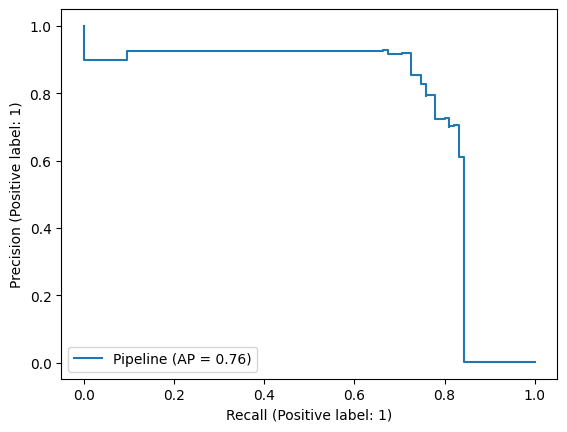

In [ ]:
from sklearn.metrics import PrecisionRecallDisplay, average_precision_score

PrecisionRecallDisplay.from_estimator(xgb_pipe3,
                                      X_test,
                                      y_test);

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

#### XGBoost SMOTE

***i. Model Training***

In [ ]:
# Define the number of majority and minority samples to be used for resampling
y_train_majority_number = int(y_train.value_counts()[0] * 0.70)
y_train_minority_number = int(y_train.value_counts()[1] * 1.30)

# Define the resampling techniques
over = SMOTE(sampling_strategy={1: y_train_minority_number})
under = RandomUnderSampler(sampling_strategy={0: y_train_majority_number})

# Define the operations/steps for the pipeline
operations = [
    ('ct',ct),
    ('iqr',OutlierCapping(factor=3)),
    ('o', over),
    ('u', under),
    ('xgb', XGBClassifier(tree_method='gpu_hist', max_depth=3, scale_pos_weight=5, n_estimators=4))
]

# Create the pipeline
xgb_pipe4 = imbpipeline(steps = operations)

pipe_params = {
    'xgb__eval_set': [(capper3.transform(ct.transform(X_test)), y_test)],
    'xgb__early_stopping_rounds': 2,
    'xgb__verbose': False
}

# Fit the pipeline to the resampled data
xgb_pipe4.fit(X_train, y_train, **pipe_params)

Pipeline(steps=[('ct',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('power_transformer',
                                                  PowerTransformer(),
                                                  ['V1', 'V2', 'V3', 'V5',
                                                   'V10', 'V12', 'V14', 'V16',
                                                   'V17', 'V20', 'V23', 'V28',
                                                   'Amount'])],
                                   verbose_feature_names_out=False)),
                ('iqr', OutlierCapping(factor=3)),
                ('o', SMOTE(sampling_strategy={1: 491})),
                ('u', RandomUnderSampler(sampling_strategy={0:...
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=3, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, n_estimators=4,
                               n_jobs=None, num_parallel_tree=None,
                               predictor=None, random_state=None, ...))])

***ii. Prediction and Model Evaluating and Tuning***

In [ ]:
print("XGB-Tuned MODEL on resampled df")
eval_metric(xgb_pipe4, X_train, y_train, X_test, y_test)

XGB-Tuned MODEL on resampled df
Test_Set
[[55014    24]
 [   20    75]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.76      0.79      0.77        95

    accuracy                           1.00     55133
   macro avg       0.88      0.89      0.89     55133
weighted avg       1.00      1.00      1.00     55133

Matthews score: 0.7729612077076056

Train_Set
[[220080     72]
 [    61    317]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.81      0.84      0.83       378

    accuracy                           1.00    220530
   macro avg       0.91      0.92      0.91    220530
weighted avg       1.00      1.00      1.00    220530

Matthews score: 0.8263804085021252


***iii. Plot Precision and Recall Curve***


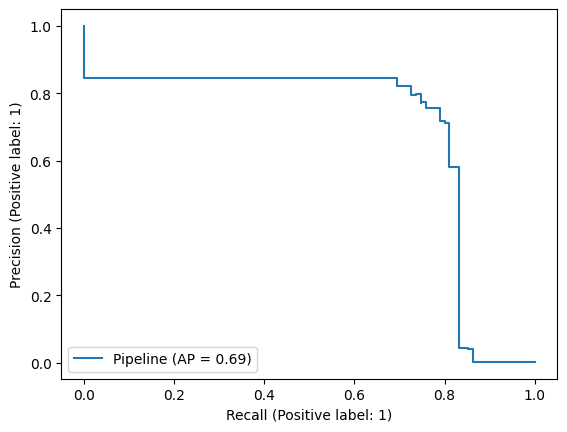

In [ ]:
PrecisionRecallDisplay.from_estimator(xgb_pipe4,
                                      X_test,
                                      y_test);

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [ ]:
train_ds = Dataset(X_train, label=y_train, cat_features=[])
test_ds = Dataset(X_test, label=y_test, cat_features=[])

evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, xgb_pipe2)
suite_result.show()
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json

deepchecks - WARNING - Cannot use model's built-in feature importance on a Scikit-learn Pipeline, using permutation feature importance calculation instead
deepchecks - WARNING - Features importance was not calculated:
Skipping permutation importance calculation: calculation was projected to finish in 146 seconds, but timeout was configured to 120 seconds


Accordion(children=(VBox(children=(HTML(value='\n<h1 id="summary_54V0Z7YZ0UFOEP2M7BP5QK87R">Model Evaluation S…

#### XGBoost Focal Loss

***i. Model Training***

In [ ]:
X_train_xgb = ct.transform(X_train)
X_train_xgb = capper3.transform(X_train_xgb)
X_test_xgb = ct.transform(X_test)
X_test_xgb = capper3.transform(X_test_xgb)

In [ ]:
# Define the operations/steps for the pipeline

xgb_imb = imb_xgb(special_objective='focal',early_stopping_rounds=3, max_depth=3)
CV_focal_booster = GridSearchCV(xgb_imb, {"focal_gamma":[2.5,3.0,3.5,4.0,4.5]})
CV_focal_booster.fit(X_train_xgb.to_numpy(), y_train.to_numpy())

GridSearchCV(estimator=imbalance_xgboost(early_stopping_rounds=3, max_depth=3,
                                         special_objective='focal'),
             param_grid={'focal_gamma': [2.5, 3.0, 3.5, 4.0, 4.5]})

In [ ]:
CV_focal_booster.best_estimator_

imbalance_xgboost(early_stopping_rounds=3, focal_gamma=3.0, max_depth=3,
                  special_objective='focal')

***ii. Prediction and Model Evaluating and Tuning***

In [ ]:
xgb_imb = CV_focal_booster.best_estimator_
print("XGB-Tuned MODEL on resampled df")

y_train_pred = xgb_imb.predict_determine(X_train_xgb.to_numpy())
y_pred = xgb_imb.predict_determine(X_test_xgb.to_numpy())

print("Test_Set")
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))
print(matthews_corrcoef(y_test, y_pred))
print()
print("Train_Set")
print(confusion_matrix(y_train, y_train_pred))
print(classification_report(y_train, y_train_pred))
print(matthews_corrcoef(y_train, y_train_pred))

XGB-Tuned MODEL on resampled df
Test_Set
[[55024    14]
 [   23    72]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.84      0.76      0.80        95

    accuracy                           1.00     55133
   macro avg       0.92      0.88      0.90     55133
weighted avg       1.00      1.00      1.00     55133

0.7962330075243704

Train_Set
[[220133     19]
 [    66    312]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.94      0.83      0.88       378

    accuracy                           1.00    220530
   macro avg       0.97      0.91      0.94    220530
weighted avg       1.00      1.00      1.00    220530

0.881866674747531


***iii. Plot Precision and Recall Curve***


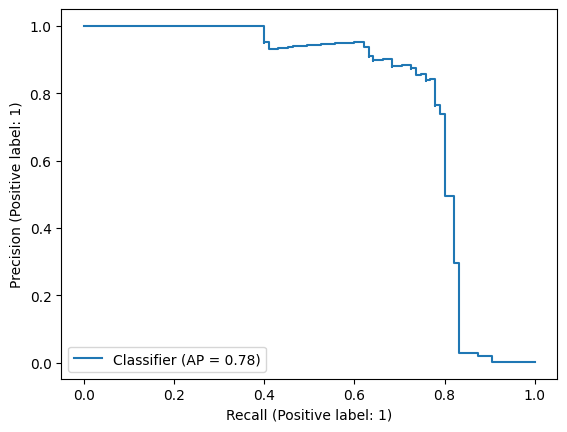

In [ ]:
from sklearn.metrics import PrecisionRecallDisplay, average_precision_score
y_test_pred = pd.DataFrame(xgb_imb.predict_two_class(X_test_xgb.to_numpy()))[1]
PrecisionRecallDisplay.from_predictions(y_test,y_test_pred);

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

#### XGBoost Conclusion

In [71]:
model = xgb_pipe

y_pred = model.predict(X_test)
y_pred_proba= model.predict_proba(X_test)[:,1]

xgba_AP = average_precision_score(y_test, y_pred_proba)
xgba_rec = recall_score(y_test, y_pred)
xgba_f1 = f1_score(y_test,y_pred)
xgba_matthews =  matthews_corrcoef(y_test, y_pred)

xgba_AP,xgba_rec,xgba_f1,xgba_matthews

(0.8184079343318118, 0.8105263157894737, 0.806282722513089, 0.8059576819985212)

### LightGBM Classifier with Unbalanced Data Techniques

#### LightGBM vanilla

***i. Model Training***

In [ ]:
operations = [
      #('ct',ct),
      #('iqr',capper3), # I got better results without iqr and ct
      ('lgbm', LGBMClassifier(max_depth=3, scale_pos_weight=5))
]

pipe_params = {
    'lgbm__eval_set': [(X_test, y_test)],
    'lgbm__early_stopping_rounds': 5,
    'lgbm__verbose': False
}

  # Create the pipeline
lgbm_pipe = Pipeline(steps = operations)
lgbm_pipe.fit(X_train, y_train, **pipe_params)

Pipeline(steps=[('lgbm', LGBMClassifier(max_depth=3, scale_pos_weight=5))])

***ii. Prediction and Model Evaluating and Tuning***

In [ ]:
print("XGB Model")
eval_metric(lgbm_pipe, X_train, y_train, X_test, y_test)

XGB Model
Test_Set
[[55012    26]
 [   18    77]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.75      0.81      0.78        95

    accuracy                           1.00     55133
   macro avg       0.87      0.91      0.89     55133
weighted avg       1.00      1.00      1.00     55133

Matthews score: 0.7780162735252297

Train_Set
[[220062     90]
 [    63    315]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.78      0.83      0.80       378

    accuracy                           1.00    220530
   macro avg       0.89      0.92      0.90    220530
weighted avg       1.00      1.00      1.00    220530

Matthews score: 0.8047308880380486


***iii. Plot Precision and Recall Curve***


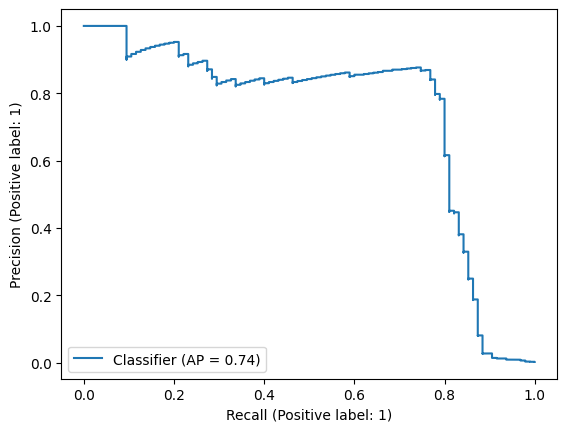

In [ ]:
y_pred = lgbm_pipe.predict_proba(X_test)[:,1]
PrecisionRecallDisplay.from_predictions(y_test,y_pred);

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [ ]:
train_ds = Dataset(X_train, label=y_train, cat_features=[])
test_ds = Dataset(X_test, label=y_test, cat_features=[])

evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, lgbm_pipe)
suite_result.show()
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json

# Passed the test

deepchecks - WARNING - Cannot use model's built-in feature importance on a Scikit-learn Pipeline, using permutation feature importance calculation instead
deepchecks - INFO - Calculating permutation feature importance. Expected to finish in 23 seconds
INFO:deepchecks:Calculating permutation feature importance. Expected to finish in 23 seconds


<!--
 ~ ----------------------------------------------------------------------------
 ~ Copyright (C) 2021-2023 Deepchecks (https://www.deepchecks.com)
 ~
 ~ This file is part of Deepchecks.
 ~ Deepchecks is distributed under the terms of the GNU Affero General
 ~ Public License (version 3 or later).
 ~ You should have received a copy of the GNU Affero General Public License
 ~ along with Deepchecks. If not, see .
 ~ ----------------------------------------------------------------------------
 ~
-->
<!DOCTYPE html>
 
 
 
 Model Evaluation Suite

#### LightGBM with AutoML

***i. Model Training***

In [ ]:
lgbm_automl = AutoML()

settings = {
    "time_budget": 30,  # total running time in seconds
    "metric": custom_metric_mcc, #'accuracy',
    "estimator_list": ['lgbm'],  # list of ML learners; we tune XGBoost in this example
    "task": 'classification'  # task type
    #"seed": 42,  # random seed
}

settings["custom_hp"] = {
    "lgbm": {
        # "class_weight": {
        #     "domain": "balanced",
        #     "init_value": "balanced"
        # },
        "n_estimators": {
            "domain": tune.randint(5,80),
            "init_value": 10
        },
        "max_depth": {
            "domain": tune.randint(3,10),
            "init_value": 10
        }
        # "objective": {
        #     "domain": 'binary',
        #     "init_value": 'binary'
        # }
        # "colsample_bytree": {
        #     "domain": 0.8,
        #     "init_value": 0.8
        # }
    }
}

lgbm_automl.fit(X_train=X_train, y_train=y_train, **settings)

[flaml.automl.logger: 07-18 20:51:30] {1693} INFO - task = classification
[flaml.automl.logger: 07-18 20:51:30] {1700} INFO - Data split method: stratified
[flaml.automl.logger: 07-18 20:51:30] {1703} INFO - Evaluation method: holdout
[flaml.automl.logger: 07-18 20:51:31] {1801} INFO - Minimizing error metric: customized metric
[flaml.automl.logger: 07-18 20:51:31] {1911} INFO - List of ML learners in AutoML Run: ['lgbm']
[flaml.automl.logger: 07-18 20:51:31] {2221} INFO - iteration 0, current learner lgbm
[flaml.automl.logger: 07-18 20:51:31] {2347} INFO - Estimated sufficient time budget=15891s. Estimated necessary time budget=16s.
[flaml.automl.logger: 07-18 20:51:31] {2394} INFO -  at 6.4s,	estimator lgbm's best error=1.0000,	best estimator lgbm's best error=1.0000
[flaml.automl.logger: 07-18 20:51:31] {2221} INFO - iteration 1, current learner lgbm
[flaml.automl.logger: 07-18 20:51:31] {2394} INFO -  at 6.5s,	estimator lgbm's best error=1.0000,	best estimator lgbm's best error=1.0

In [ ]:
'''retrieve best config and best learner'''
print('Best ML leaner:', lgbm_automl.best_estimator)
print('Best hyperparmeter config:', lgbm_automl.best_config)
print('Best score on validation data: {0:.4g}'.format(1-lgbm_automl.best_loss))
print('Training duration of best run: {0:.4g} s'.format(lgbm_automl.best_config_train_time))

Best ML leaner: lgbm
Best hyperparmeter config: {'n_estimators': 5, 'num_leaves': 7, 'min_child_samples': 54, 'learning_rate': 0.5994787960626764, 'log_max_bin': 6, 'colsample_bytree': 1.0, 'reg_alpha': 0.0031739039323731132, 'reg_lambda': 26.750094152767296, 'max_depth': 9}
Best score on validation data: 0.9067
Training duration of best run: 0.9756 s


In [ ]:
# mcc 78.2: {'n_estimators': 5, 'num_leaves': 7, 'min_child_samples': 54, 'learning_rate': 0.5994787960626764, 'log_max_bin': 6, 'colsample_bytree': 1.0, 'reg_alpha': 0.0031739039323731132, 'reg_lambda': 26.750094152767296, 'max_depth': 9}

***ii. Prediction and Model Evaluating and Tuning***

In [ ]:
print("LGBM-Tuned MODEL on original df")
eval_metric(lgbm_automl, X_train, y_train, X_test, y_test)

LGBM-Tuned MODEL on original df
Test_Set
[[55021    17]
 [   23    72]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.81      0.76      0.78        95

    accuracy                           1.00     55133
   macro avg       0.90      0.88      0.89     55133
weighted avg       1.00      1.00      1.00     55133

Matthews score: 0.7826633328686359

Train_Set
[[220100     52]
 [    80    298]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.85      0.79      0.82       378

    accuracy                           1.00    220530
   macro avg       0.93      0.89      0.91    220530
weighted avg       1.00      1.00      1.00    220530

Matthews score: 0.8189899782443143


***iii. Plot Precision and Recall Curve***


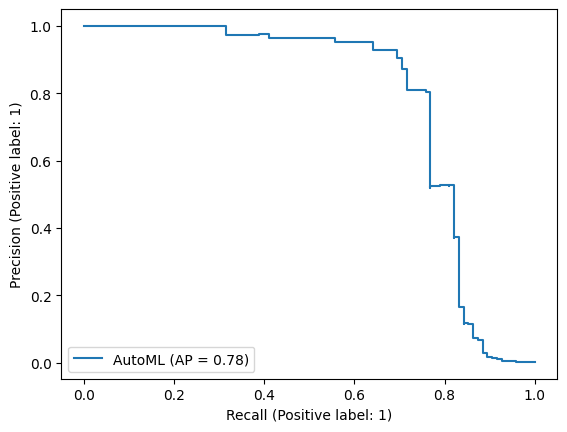

In [ ]:
from sklearn.metrics import PrecisionRecallDisplay, average_precision_score

PrecisionRecallDisplay.from_estimator(lgbm_automl,
                                      X_test,
                                      y_test);

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [ ]:
scoring = {"precision_Fraud" : make_scorer(precision_score, average = None, labels =[1]),
           "recall_Fraud" : make_scorer(recall_score, average = None, labels =[1]),
           "f1_Fraud" : make_scorer(f1_score, average = None, labels =[1]),
           "AP": make_scorer(average_precision_score)}

In [ ]:
hyperparameters = {
    'n_estimators': 14,
    'num_leaves': 7,
    'min_child_samples': 15,
    'learning_rate': 0.32718489523697947,
    'max_bin': 6,
    'colsample_bytree': 0.802922413296546,
    'reg_alpha': 0.005480464307927753,
    'reg_lambda': 10.663301614984208,
    'max_depth': 9
}

# Create and train the LightGBM classifier
lgb_model = LGBMClassifier(**hyperparameters)

scores = cross_validate(lgb_model,
                        X_train,
                        y_train,
                        scoring=scoring,
                        cv=5,
                        return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 6))
df_scores.mean()[2:]

test_precision_Fraud    0.836
train_precision_Fraud   0.842
test_recall_Fraud       0.712
train_recall_Fraud      0.720
test_f1_Fraud           0.768
train_f1_Fraud          0.776
test_AP                 0.595
train_AP                0.607
dtype: float64

In [ ]:
train_ds = Dataset(X_train, label=y_train, cat_features=[])
test_ds = Dataset(X_test, label=y_test, cat_features=[])

evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, lgbm_automl)
suite_result.show()
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json

# Passed the test.

<!--
 ~ ----------------------------------------------------------------------------
 ~ Copyright (C) 2021-2023 Deepchecks (https://www.deepchecks.com)
 ~
 ~ This file is part of Deepchecks.
 ~ Deepchecks is distributed under the terms of the GNU Affero General
 ~ Public License (version 3 or later).
 ~ You should have received a copy of the GNU Affero General Public License
 ~ along with Deepchecks. If not, see .
 ~ ----------------------------------------------------------------------------
 ~
-->
<!DOCTYPE html>
 
 
 
 Model Evaluation Suite

#### LightGBM with SMOTE

***i. Model Training***

In [ ]:
lgbm_automl2 = AutoML()


settings = {
    "time_budget": 30,  # total running time in seconds
    "metric": custom_metric_mcc, # 'ap', #'accuracy',
    "estimator_list": ['lgbm'],  # list of ML learners;
    "task": 'classification'  # task type
    #"seed": 42  # random seed
}

settings["custom_hp"] = {
    "lgbm": {
        # "class_weight": {
        #     "domain": "balanced",
        #     "init_value": "balanced"
        # },
        "n_estimators": {
            "domain": tune.randint(5,80),
            "init_value": 10
        },
        # "max_depth": {
        #     "domain": tune.randint(3,7),
        #     "init_value": 3
        # },
        # "scale_pos_weight": {
        #     "domain": tune.randint(2,7),
        #     "init_value": 2
        # },
        # "is_unbalance": {
        #     "domain": True,
        #     "init_value": True
        # },
        # "objective": {
        #     "domain": focal_loss(alpha=0.25, gamma=1),
        #     "init_value": focal_loss(alpha=0.25, gamma=1)
        # }
        # "colsample_bytree": {
        #     "domain": 0.8,
        #     "init_value": 0.8
        # }
    }
}

pipeline_settings = {
    f"automl__{key}": value for key, value in settings.items()
}

# Define the number of majority and minority samples to be used for resampling
y_train_majority_number = int(y_train.value_counts()[0] * 0.70)
y_train_minority_number = int(y_train.value_counts()[1] * 1.30)

# Define the resampling techniques
over = SMOTE(sampling_strategy={1: y_train_minority_number})
under = RandomUnderSampler(sampling_strategy={0: y_train_majority_number})

# Define the operations/steps for the pipeline
operations = [
    # ('ct',ct),
    # ('iqr',OutlierCapping(factor=3)), #without ct and capping gave better results
    ('o', over),
    ('u', under),
    ('automl', lgbm_automl2)
]

# Create the pipeline
lgbm_pipe2 = imbpipeline(steps = operations)

# Fit the pipeline to the resampled data
lgbm_pipe2.fit(X_train, y_train, **pipeline_settings)


[flaml.automl.logger: 07-18 20:59:48] {1693} INFO - task = classification
[flaml.automl.logger: 07-18 20:59:48] {1700} INFO - Data split method: stratified
[flaml.automl.logger: 07-18 20:59:48] {1703} INFO - Evaluation method: holdout
[flaml.automl.logger: 07-18 20:59:48] {1801} INFO - Minimizing error metric: customized metric
[flaml.automl.logger: 07-18 20:59:48] {1911} INFO - List of ML learners in AutoML Run: ['lgbm']
[flaml.automl.logger: 07-18 20:59:48] {2221} INFO - iteration 0, current learner lgbm
[flaml.automl.logger: 07-18 20:59:49] {2347} INFO - Estimated sufficient time budget=19322s. Estimated necessary time budget=19s.
[flaml.automl.logger: 07-18 20:59:49] {2394} INFO -  at 2.8s,	estimator lgbm's best error=0.2774,	best estimator lgbm's best error=0.2774
[flaml.automl.logger: 07-18 20:59:49] {2221} INFO - iteration 1, current learner lgbm
[flaml.automl.logger: 07-18 20:59:49] {2394} INFO -  at 3.0s,	estimator lgbm's best error=0.2774,	best estimator lgbm's best error=0.2

Pipeline(steps=[('o', SMOTE(sampling_strategy={1: 491})),
                ('u', RandomUnderSampler(sampling_strategy={0: 154106})),
                ('automl',
                 AutoML(append_log=False, auto_augment=True, custom_hp={},
                        cv_score_agg_func=None, early_stop=False,
                        ensemble=False, estimator_list='auto',
                        eval_method='auto', fit_kwargs_by_estimator={},
                        force_cancel=False, free_mem_ratio=0, hpo_method='auto',
                        keep_search_state=False, learner_selector='sample',
                        log_file_name='', log_training_metric=False,
                        log_type='better', max_iter=None, mem_thres=4294967296,
                        metric='auto', metric_constraints=[],
                        min_sample_size=10000, mlflow_logging=True,
                        model_history=False, n_concurrent_trials=1, n_jobs=-1,
                        n_splits=5, pred_time_limit=inf,
                        preserve_checkpoint=True, retrain_full=True, ...))])

In [ ]:
'''retrieve best config and best learner'''
print('Best ML leaner:', lgbm_automl2.best_estimator)
print('Best hyperparmeter config:', lgbm_automl2.best_config)
print('Best score on validation data: {0:.4g}'.format(1-lgbm_automl2.best_loss))
print('Training duration of best run: {0:.4g} s'.format(lgbm_automl2.best_config_train_time))

Best ML leaner: lgbm
Best hyperparmeter config: {'n_estimators': 35, 'num_leaves': 4, 'min_child_samples': 3, 'learning_rate': 0.4350042579531593, 'log_max_bin': 10, 'colsample_bytree': 1.0, 'reg_alpha': 0.007296238964396973, 'reg_lambda': 1.0133493665156057}
Best score on validation data: 0.8603
Training duration of best run: 1.24 s


In [ ]:
# mcc: 84 {'n_estimators': 25, 'num_leaves': 4, 'min_child_samples': 18, 'learning_rate': 1.0, 'log_max_bin': 10, 'colsample_bytree': 1.0, 'reg_alpha': 0.0009765625, 'reg_lambda': 5.555742919299974}


***ii. Prediction and Model Evaluating and Tuning***

In [ ]:
print("LGBM-Tuned MODEL on original df with SMOTE")
eval_metric(lgbm_pipe, X_train, y_train, X_test, y_test)

LGBM-Tuned MODEL on original df with SMOTE
Test_Set
[[55027    11]
 [   23    72]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.87      0.76      0.81        95

    accuracy                           1.00     55133
   macro avg       0.93      0.88      0.90     55133
weighted avg       1.00      1.00      1.00     55133

Matthews score: 0.8105312550623475

Train_Set
[[220116     36]
 [    58    320]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.90      0.85      0.87       378

    accuracy                           1.00    220530
   macro avg       0.95      0.92      0.94    220530
weighted avg       1.00      1.00      1.00    220530

Matthews score: 0.8721144522729808


***iii. Plot Precision and Recall Curve***


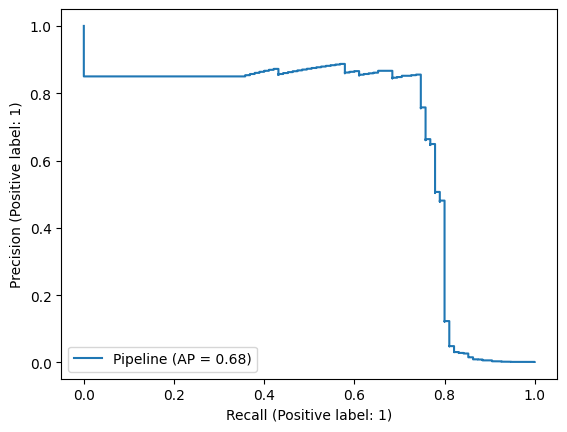

In [ ]:
PrecisionRecallDisplay.from_estimator(lgbm_pipe2,
                                      X_test,
                                      y_test);

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [ ]:
scoring = {"precision_Fraud" : make_scorer(precision_score, average = None, labels =[1]),
           "recall_Fraud" : make_scorer(recall_score, average = None, labels =[1]),
           "f1_Fraud" : make_scorer(f1_score, average = None, labels =[1]),
           "AP": make_scorer(average_precision_score)}

In [ ]:
lgbm_automl2.best_config

{'n_estimators': 35,
 'num_leaves': 4,
 'min_child_samples': 3,
 'learning_rate': 0.4350042579531593,
 'log_max_bin': 10,
 'colsample_bytree': 1.0,
 'reg_alpha': 0.007296238964396973,
 'reg_lambda': 1.0133493665156057}

In [ ]:
hyperparameters = {'n_estimators': 35,
 'num_leaves': 4,
 'min_child_samples': 3,
 'learning_rate': 0.4350042579531593,
 'max_bin': 10,
 'colsample_bytree': 1.0,
 'reg_alpha': 0.007296238964396973,
 'reg_lambda': 1.0133493665156057}

# Create and train the LightGBM classifier
lgb_model = LGBMClassifier(**hyperparameters)

scores = cross_validate(lgb_model,
                        X_train,
                        y_train,
                        scoring=scoring,
                        cv=5,
                        return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 6))
df_scores.mean()[2:]

test_precision_Fraud    0.821
train_precision_Fraud   0.835
test_recall_Fraud       0.701
train_recall_Fraud      0.724
test_f1_Fraud           0.754
train_f1_Fraud          0.775
test_AP                 0.575
train_AP                0.605
dtype: float64

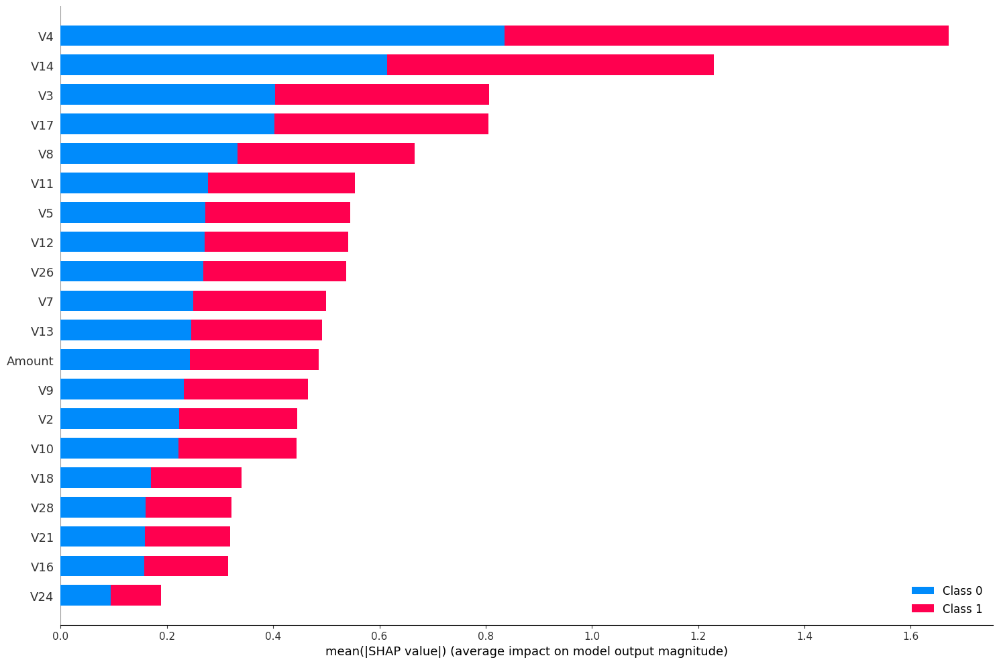

In [ ]:
import shap
lgb_model.fit(X_train,y_train)
explainer = shap.TreeExplainer(lgb_model)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, X_train, plot_type="bar", plot_size=(15, 10))

In [ ]:
train_ds = Dataset(X_train, label=y_train, cat_features=[])
test_ds = Dataset(X_test, label=y_test, cat_features=[])

evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, lgbm)
suite_result.show()
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json

Accordion(children=(VBox(children=(HTML(value='\n<h1 id="summary_ALN4SSE0LXXKNEXUEYJPE6PW6">Model Evaluation S…

#### LightGBM with Focal Loss

https://github.com/jrzaurin/LightGBM-with-Focal-Loss/blob/master/examples/Lightgbm_with_Focal_Loss.ipynb

In [72]:
def focal_loss_lgb_sk(y_true, y_pred, alpha, gamma):
    """
    Focal Loss for lightgbm

    Parameters:
    -----------
    y_pred: numpy.ndarray
        array with the predictions
    dtrain: lightgbm.Dataset
    alpha, gamma: float
        See original paper https://arxiv.org/pdf/1708.02002.pdf
    """
    a,g = alpha, gamma
    def fl(x,t):
        p = 1/(1+np.exp(-x))
        return -( a*t + (1-a)*(1-t) ) * (( 1 - ( t*p + (1-t)*(1-p)) )**g) * ( t*np.log(p)+(1-t)*np.log(1-p) )
    partial_fl = lambda x: fl(x, y_true)
    grad = derivative(partial_fl, y_pred, n=1, dx=1e-6)
    hess = derivative(partial_fl, y_pred, n=2, dx=1e-6)
    return grad, hess

In [73]:
def focal_loss_lgb_eval_error_sk(y_true, y_pred, alpha, gamma):
    """
    Adapation of the Focal Loss for lightgbm to be used as evaluation loss

    Parameters:
    -----------
    y_pred: numpy.ndarray
        array with the predictions
    dtrain: lightgbm.Dataset
    alpha, gamma: float
        See original paper https://arxiv.org/pdf/1708.02002.pdf
    """
    a,g = alpha, gamma
    p = 1/(1+np.exp(-y_pred))
    loss = -( a*y_true + (1-a)*(1-y_true) ) * (( 1 - ( y_true*p + (1-y_true)*(1-p)) )**g) * ( y_true*np.log(p)+(1-y_true)*np.log(1-p) )
    return 'focal_loss', np.mean(loss), False

In [74]:
def sigmoid(x): return 1./(1. +  np.exp(-x))

***i. Model Training***

In [75]:
from scipy.misc import derivative
focal_loss = lambda x,y: focal_loss_lgb_sk(x, y, 0.25, 2.)
eval_error = lambda x,y: focal_loss_lgb_eval_error_sk(x, y, 0.25, 2.)

lgbm_modelf = LGBMClassifier(objective=focal_loss, learning_rate=0.01)

lgbm_modelf.fit(
    X_train,
    y_train,
    eval_set=[(X_test, y_test)],
    eval_metric=eval_error,
    early_stopping_rounds=2)

[1]	valid_0's binary_logloss: 0.0241336	valid_0's focal_loss: 0.128156
[2]	valid_0's binary_logloss: 0.0161384	valid_0's focal_loss: 0.126519
[3]	valid_0's binary_logloss: 0.0085044	valid_0's focal_loss: 0.124907
[4]	valid_0's binary_logloss: 0.00106041	valid_0's focal_loss: 0.123316
[5]	valid_0's binary_logloss: -0.00623529	valid_0's focal_loss: 0.12175
[6]	valid_0's binary_logloss: -0.0134135	valid_0's focal_loss: 0.120206
[7]	valid_0's binary_logloss: -0.0204794	valid_0's focal_loss: 0.118685
[8]	valid_0's binary_logloss: -0.0274584	valid_0's focal_loss: 0.117184
[9]	valid_0's binary_logloss: -0.034344	valid_0's focal_loss: 0.115704
[10]	valid_0's binary_logloss: -0.0411407	valid_0's focal_loss: 0.114246
[11]	valid_0's binary_logloss: -0.0478578	valid_0's focal_loss: 0.112809
[12]	valid_0's binary_logloss: -0.054493	valid_0's focal_loss: 0.111392
[13]	valid_0's binary_logloss: -0.0610529	valid_0's focal_loss: 0.109995
[14]	valid_0's binary_logloss: -0.0675372	valid_0's focal_loss: 0

LGBMClassifier(learning_rate=0.01,
               objective=<function <lambda> at 0x7d606300add0>)

***ii. Prediction and Model Evaluating and Tuning***

In [77]:
y_pred = sigmoid(lgbm_modelf.predict(X_test))
y_pred = (y_pred > .38).astype("int32")
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))
print(matthews_corrcoef(y_test, y_pred))

[[55018    20]
 [   18    77]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.79      0.81      0.80        95

    accuracy                           1.00     55133
   macro avg       0.90      0.91      0.90     55133
weighted avg       1.00      1.00      1.00     55133

0.8017818010540274


In [78]:
y_pred = sigmoid(lgbm_modelf.predict(X_train))
y_pred = (y_pred > .38).astype("int32")
print(confusion_matrix(y_train, y_pred))
print(classification_report(y_train, y_pred))
print(matthews_corrcoef(y_train, y_pred))

[[220100     52]
 [    56    322]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.86      0.85      0.86       378

    accuracy                           1.00    220530
   macro avg       0.93      0.93      0.93    220530
weighted avg       1.00      1.00      1.00    220530

0.8561498559908132


***iii. Plot Precision and Recall Curve***


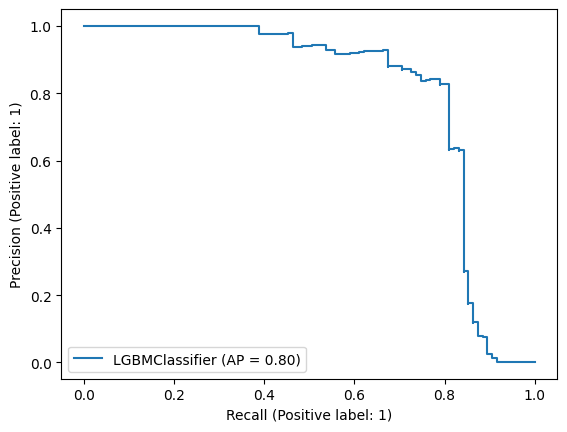

In [79]:
from sklearn.metrics import PrecisionRecallDisplay, average_precision_score

PrecisionRecallDisplay.from_estimator(lgbm_modelf,
                                      X_test,
                                      y_test);

#### LightGBM with Focal Loss HyperOpt

https://github.com/jrzaurin/LightGBM-with-Focal-Loss/blob/master/examples/Lightgbm_with_Focal_Loss.ipynb

***i. Model Training***

In [ ]:
from hyperopt import hp, tpe, fmin, Trials

In [ ]:
from scipy.misc import derivative

In [ ]:
def focal_loss_lgb(y_pred, dtrain, alpha, gamma):
    """
    Focal Loss for lightgbm

    Parameters:
    -----------
    y_pred: numpy.ndarray
        array with the predictions
    dtrain: lightgbm.Dataset
    alpha, gamma: float
        See original paper https://arxiv.org/pdf/1708.02002.pdf
    """
    a,g = alpha, gamma
    y_true = dtrain.label
    def fl(x,t):
        p = 1/(1+np.exp(-x))
        return -( a*t + (1-a)*(1-t) ) * (( 1 - ( t*p + (1-t)*(1-p)) )**g) * ( t*np.log(p)+(1-t)*np.log(1-p) )
    partial_fl = lambda x: fl(x, y_true)
    grad = derivative(partial_fl, y_pred, n=1, dx=1e-6)
    hess = derivative(partial_fl, y_pred, n=2, dx=1e-6)
    return grad, hess

def lgb_focal_f1_score(preds, lgbDataset):
    """
    When using custom losses the row prediction needs to passed through a
    sigmoid to represent a probability

    Parameters:
    -----------
    preds: numpy.ndarray
        array with the predictions
    lgbDataset: lightgbm.Dataset
    """
    preds = sigmoid(preds)
    binary_preds = [int(p>0.5) for p in preds]
    y_true = lgbDataset.get_label()
    return 'f1', f1_score(y_true, binary_preds), True

In [ ]:
def objective(params):
    """
    objective function for lightgbm.
    """
    # hyperopt casts as float
    params['num_boost_round'] = int(params['num_boost_round'])
    params['num_leaves'] = int(params['num_leaves'])
    # params['device'] = 'gpu'

    # need to be passed as parameter
    params['verbose'] = -1
    params['seed'] = 1

    focal_loss = lambda x,y: focal_loss_lgb(x, y,
        params['alpha'], params['gamma'])
    # if you do not want an annoying warning related to the unrecognised param
    # 'alpha', simple pop them out from the dict params here and insert them
    # back before return. For this particular notebook I can live  with it, so
    # I will leave it
    cv_result = lgb.cv(
        params,
        train,
        num_boost_round=params['num_boost_round'],
        fobj = focal_loss,
        feval = lgb_focal_f1_score,
        nfold=3,
        stratified=True,
        early_stopping_rounds=20)
    # I save the length or the results (i.e. the number of estimators) because
    # it might have stopped earlier and is always useful to have that
    # information
    early_stop_dict[objective.i] = len(cv_result['f1-mean'])
    score = round(cv_result['f1-mean'][-1], 4)
    objective.i+=1
    return -score

In [ ]:
space = {
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.2),
    'num_boost_round': hp.quniform('num_boost_round', 50, 500, 20),
    'num_leaves': hp.quniform('num_leaves', 31, 255, 4),
    'min_child_weight': hp.uniform('min_child_weight', 0.1, 10),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.5, 1.),
    'subsample': hp.uniform('subsample', 0.5, 1.),
    'reg_alpha': hp.uniform('reg_alpha', 0.01, 0.1),
    'reg_lambda': hp.uniform('reg_lambda', 0.01, 0.1),
    'alpha': hp.uniform('alpha', 0.1, 0.75),
    'gamma': hp.uniform('gamma', 0.5, 5)
    }

In [ ]:
colnames = df.columns.to_list()
#categorical_columns = databunch.categorical_columns + databunch.crossed_columns

In [ ]:
train = lgb.Dataset(
    X_train, y_train,
    #categorical_feature = categorical_columns,
    free_raw_data=False)

In [ ]:
objective.i=0
trials = Trials()
early_stop_dict = {}
best = fmin(fn=objective,
            space=space,
            algo=tpe.suggest,
            max_evals=5,
            trials=trials)

100%|██████████| 5/5 [05:49<00:00, 69.88s/trial, best loss: -0.8549]


In [ ]:
best['num_boost_round'] = early_stop_dict[trials.best_trial['tid']]
best['num_leaves'] = int(best['num_leaves'])
best['verbose'] = -1
focal_loss = lambda x,y: focal_loss_lgb(x, y, best['alpha'], best['gamma'])
lgm_modelf2 = lgb.train(best, train, fobj=focal_loss)

***ii. Prediction and Model Evaluating and Tuning***

In [ ]:
y_pred = sigmoid(lgm_modelf2.predict(X_test))
y_pred = (y_pred > .5).astype("int32")
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[55030     8]
 [   23    72]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.90      0.76      0.82        95

    accuracy                           1.00     55133
   macro avg       0.95      0.88      0.91     55133
weighted avg       1.00      1.00      1.00     55133



In [ ]:
y_pred = sigmoid(lgm_modelf2.predict(X_train))
y_pred = (y_pred > .5).astype("int32")
print(confusion_matrix(y_train, y_pred))
print(classification_report(y_train, y_pred))

[[220137     15]
 [    55    323]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.96      0.85      0.90       378

    accuracy                           1.00    220530
   macro avg       0.98      0.93      0.95    220530
weighted avg       1.00      1.00      1.00    220530



***iii. Plot Precision and Recall Curve***


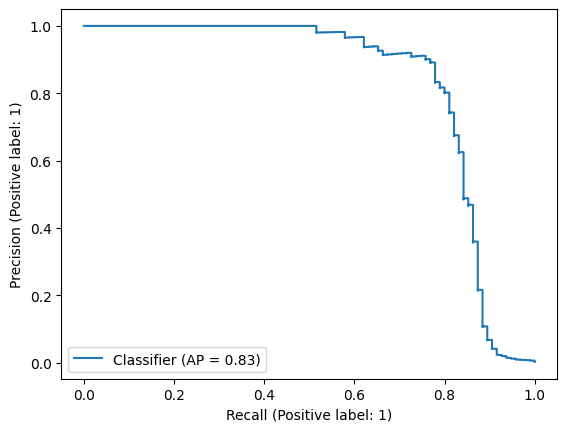

In [ ]:
from sklearn.metrics import PrecisionRecallDisplay, average_precision_score
y_pred = sigmoid(lgm_modelf2.predict(X_test))
PrecisionRecallDisplay.from_predictions(y_test, y_pred);

#### LightGBM Conclusion

In [80]:
# LightGBM with focal loss gives better results.

y_pred_proba= sigmoid(lgbm_modelf.predict(X_test))
y_pred = (y_pred_proba > .38).astype("int32")

lgbm_AP = average_precision_score(y_test, y_pred_proba)
lgbm_rec = recall_score(y_test, y_pred)
lgbm_f1 = f1_score(y_test,y_pred)
lgbm_matthews =  matthews_corrcoef(y_test, y_pred)

lgbm_AP,lgbm_rec,lgbm_f1,lgbm_matthews

(0.8024002644917231,
 0.8105263157894737,
 0.8020833333333334,
 0.8017818010540274)

### MLP Classifier

https://github.com/tunguz/UCI_Census_Income/blob/main/scripts/MLPClassifier.ipynb

The MLPClassifier is a type of neural network algorithm that can be used for classification tasks[1][2]. It is based on the multilayer perceptron (MLP) architecture, which is a type of feedforward neural network[1][3]. The MLPClassifier algorithm consists of an input layer, one or more hidden layers, and an output layer[1][4]. The input layer receives the input data, the hidden layers process the data, and the output layer produces the final output[1]. The MLPClassifier is capable of learning non-linear relationships between inputs and outputs, making it a powerful tool for classification tasks[1].

The MLPClassifier is implemented in Scikit-Learn, a popular Python library for machine learning[1]. It provides various options for defining the network architecture, training the model, and evaluating its performance[2]. The MLPClassifier class can be used for a wide range of classification tasks, including image classification, text classification, and time series classification[2].

Some of the key parameters that can be set when using the MLPClassifier include:
- **hidden_layer_sizes**: This is a tuple that specifies the number of neurons in each hidden layer of the network[4].
- **max_iter**: This is the maximum number of iterations for the solver to converge[4].
- **activation**: This is the activation function for the hidden layers[1].
- **solver**: This is the optimization algorithm used to train the network[1][4].

Overall, the MLPClassifier is a powerful tool for classification tasks that can learn non-linear relationships between inputs and outputs. It is implemented in Scikit-Learn and provides various options for defining the network architecture, training the model, and evaluating its performance.

Citations:
[1] https://aitechtrend.com/a-comprehensive-guide-to-using-scikit-learns-mlpclassifier/
[2] https://www.geeksforgeeks.org/compare-stochastic-learning-strategies-for-mlpclassifier-in-scikit-learn/
[3] https://michael-fuchs-python.netlify.app/2021/02/03/nn-multi-layer-perceptron-classifier-mlpclassifier/
[4] https://python-course.eu/machine-learning/neural-networks-with-scikit.php

#### MLP Classifier vanilla

***i. Model Training***

In [81]:
from sklearn.neural_network import MLPClassifier

operations = [
      ('ct',ct),
      #('iqr',OutlierCapping(factor=3)), # give better results with ct, and without capping
      ('mlp',  MLPClassifier(validation_fraction=0, max_iter=100, random_state=2022, hidden_layer_sizes=(30,)))
]

mlp_pipe = Pipeline(steps = operations)
mlp_pipe.fit(X_train, y_train)


Pipeline(steps=[('ct',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('power_transformer',
                                                  PowerTransformer(),
                                                  ['V1', 'V2', 'V3', 'V5',
                                                   'V10', 'V12', 'V14', 'V16',
                                                   'V17', 'V20', 'V23', 'V28',
                                                   'Amount'])],
                                   verbose_feature_names_out=False)),
                ('mlp',
                 MLPClassifier(hidden_layer_sizes=(30,), max_iter=100,
                               random_state=2022, validation_fraction=0))])

***ii. Prediction and Model Evaluating and Tuning***

In [82]:
eval_metric(mlp_pipe, X_train, y_train, X_test, y_test)

Test_Set
[[55032     6]
 [   21    74]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.93      0.78      0.85        95

    accuracy                           1.00     55133
   macro avg       0.96      0.89      0.92     55133
weighted avg       1.00      1.00      1.00     55133

Matthews score: 0.8486037874124611

Train_Set
[[220138     14]
 [    60    318]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.96      0.84      0.90       378

    accuracy                           1.00    220530
   macro avg       0.98      0.92      0.95    220530
weighted avg       1.00      1.00      1.00    220530

Matthews score: 0.8974990153682242


In [83]:
evaluate_threshold(mlp_pipe, X_train, y_train, X_test, y_test,0.1)

Test Set:
[[55019    19]
 [   18    77]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.80      0.81      0.81        95

    accuracy                           1.00     55133
   macro avg       0.90      0.91      0.90     55133
weighted avg       1.00      1.00      1.00     55133

Matthews Score: 0.8059576819985212

Training Set:
[[220082     70]
 [    39    339]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.83      0.90      0.86       378

    accuracy                           1.00    220530
   macro avg       0.91      0.95      0.93    220530
weighted avg       1.00      1.00      1.00    220530

Matthews Score: 0.8619234974571619



***iii. Plot Precision and Recall Curve***


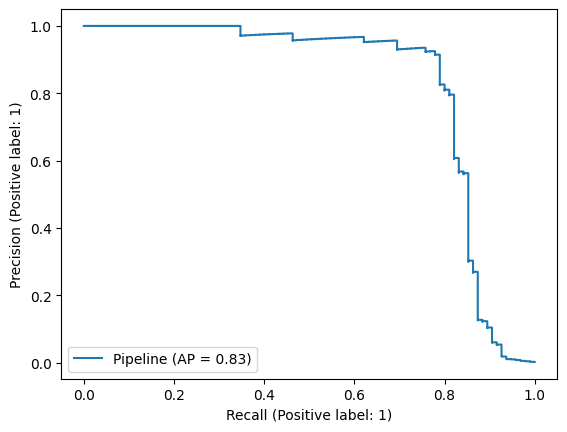

In [84]:
PrecisionRecallDisplay.from_estimator(mlp_pipe,
                                      X_test,
                                      y_test);

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [ ]:
train_ds = Dataset(X_train, label=y_train, cat_features=[])
test_ds = Dataset(X_test, label=y_test, cat_features=[])

evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, mlp_pipe)
suite_result.show()
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json

# Passed the test

deepchecks - WARNING - Cannot use model's built-in feature importance on a Scikit-learn Pipeline, using permutation feature importance calculation instead
deepchecks - WARNING - Features importance was not calculated:
Skipping permutation importance calculation: calculation was projected to finish in 162 seconds, but timeout was configured to 120 seconds
Skipping permutation importance calculation: calculation was projected to finish in 162 seconds, but timeout was configured to 120 seconds


<!--
 ~ ----------------------------------------------------------------------------
 ~ Copyright (C) 2021-2023 Deepchecks (https://www.deepchecks.com)
 ~
 ~ This file is part of Deepchecks.
 ~ Deepchecks is distributed under the terms of the GNU Affero General
 ~ Public License (version 3 or later).
 ~ You should have received a copy of the GNU Affero General Public License
 ~ along with Deepchecks. If not, see .
 ~ ----------------------------------------------------------------------------
 ~
-->
<!DOCTYPE html>
 
 
 
 Model Evaluation Suite

#### MLP Classifier with SMOTE

***i. Model Training***

In [ ]:
# Define the number of majority and minority samples to be used for resampling
y_train_majority_number = int(y_train.value_counts()[0] * 0.70)
y_train_minority_number = int(y_train.value_counts()[1] * 1.30)

# Define the resampling techniques
over = SMOTE(sampling_strategy={1: y_train_minority_number})
under = RandomUnderSampler(sampling_strategy={0: y_train_majority_number})

# Define the operations/steps for the pipeline
operations = [
    ('ct',ct),
    ('o', over),
    ('u', under),
    ('mlp', MLPClassifier(validation_fraction=0, max_iter=100, random_state=2022, hidden_layer_sizes=(50,)))
]

# Create the pipeline
mlp_pipe2 = imbpipeline(steps = operations)

# Fit the pipeline to the resampled data
mlp_pipe2.fit(X_train, y_train)

Pipeline(steps=[('ct',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('power_transformer',
                                                  PowerTransformer(),
                                                  ['V1', 'V2', 'V3', 'V5',
                                                   'V10', 'V12', 'V14', 'V16',
                                                   'V17', 'V20', 'V23', 'V28',
                                                   'Amount'])],
                                   verbose_feature_names_out=False)),
                ('o', SMOTE(sampling_strategy={1: 491})),
                ('u', RandomUnderSampler(sampling_strategy={0: 154106})),
                ('mlp',
                 MLPClassifier(hidden_layer_sizes=(50,), max_iter=100,
                               random_state=2022, validation_fraction=0))])

***ii. Prediction and Model Evaluating and Tuning***

In [ ]:
eval_metric(mlp_pipe2, X_train, y_train, X_test, y_test)

Test_Set
[[55025    13]
 [   23    72]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.85      0.76      0.80        95

    accuracy                           1.00     55133
   macro avg       0.92      0.88      0.90     55133
weighted avg       1.00      1.00      1.00     55133

Matthews score: 0.800914967850893

Train_Set
[[220124     28]
 [    25    353]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.93      0.93      0.93       378

    accuracy                           1.00    220530
   macro avg       0.96      0.97      0.97    220530
weighted avg       1.00      1.00      1.00    220530

Matthews score: 0.9300581978363357


In [ ]:
evaluate_threshold(mlp_pipe2, X_train, y_train, X_test, y_test,0.15)

Test Set:
[[55007    31]
 [   21    74]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.70      0.78      0.74        95

    accuracy                           1.00     55133
   macro avg       0.85      0.89      0.87     55133
weighted avg       1.00      1.00      1.00     55133

Matthews Score: 0.7404582539994646

Training Set:
[[220064     88]
 [    10    368]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.81      0.97      0.88       378

    accuracy                           1.00    220530
   macro avg       0.90      0.99      0.94    220530
weighted avg       1.00      1.00      1.00    220530

Matthews Score: 0.8861721448142118



***iii. Plot Precision and Recall Curve***


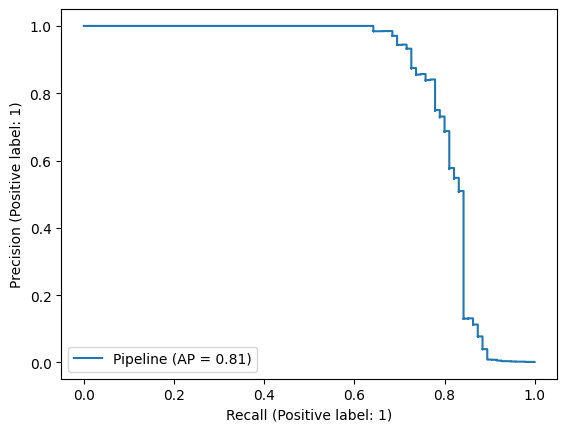

In [ ]:
from sklearn.metrics import PrecisionRecallDisplay, average_precision_score

PrecisionRecallDisplay.from_estimator(mlp_pipe,
                                      X_test_scaled,
                                      y_test);

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [ ]:
train_ds = Dataset(X_train_scaled, label=y_train, cat_features=[])
test_ds = Dataset(X_test_scaled, label=y_test, cat_features=[])

evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, mlp_model)
suite_result.show()
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json

deepchecks - WARNING - Could not find built-in feature importance on the model, using permutation feature importance calculation instead
deepchecks - INFO - Calculating permutation feature importance. Expected to finish in 48 seconds


Accordion(children=(VBox(children=(HTML(value='\n<h1 id="summary_3D1DWKQ5YK5KO0ZRV6O23ZJNA">Model Evaluation S…

#### MLP Conclusion

In [85]:
# SMOTE did not give good results in the mlp.
# mlp_pipe passed the test.
model = mlp_pipe

y_pred = model.predict(X_test)
y_pred_proba= model.predict_proba(X_test)[:,1]

mlp_AP = average_precision_score(y_test, y_pred_proba)
mlp_rec = recall_score(y_test, y_pred)
mlp_f1 = f1_score(y_test,y_pred)
mlp_matthews =  matthews_corrcoef(y_test, y_pred)

mlp_AP,mlp_rec,mlp_f1,mlp_matthews

(0.8260022812704898,
 0.7789473684210526,
 0.8457142857142858,
 0.8486037874124611)

### HistGradientBooster Classifier

The HistGradientBoostingClassifier is a classifier implemented in scikit-learn that utilizes the histogram-based gradient boosting algorithm for efficient training and prediction on large datasets. It combines the advantages of gradient boosting, such as ensemble learning and handling of complex nonlinear relationships, with the computational efficiency gained from histogram-based gradient boosting. This classifier is particularly useful for tasks involving large-scale datasets and high-dimensional feature spaces where traditional gradient boosting algorithms may be computationally expensive.

The HistGradientBoostingClassifier is designed to handle large datasets efficiently. It offers significant performance improvements over traditional gradient boosting algorithms when dealing with datasets that have a large number of samples (e.g., hundreds of thousands or millions) or high-dimensional feature spaces (e.g., hundreds or thousands of features). This classifier is especially beneficial in scenarios where traditional gradient boosting algorithms may suffer from long training times or memory limitations due to the dataset size.

#### HGB Classifier

***i. Model Training***

In [86]:
# Define the model

operations = [
      #('ct',ct),
      #('iqr',OutlierCapping(factor=3)), # iqr and ct did not affect the scores.
      ('hgb', HistGradientBoostingClassifier(max_iter=10000, max_depth=2,
                                         random_state=137, max_bins=9))
]

hgb_pipe = Pipeline(steps = operations)
hgb_pipe.fit(X_train, y_train)


Pipeline(steps=[('hgb',
                 HistGradientBoostingClassifier(max_bins=9, max_depth=2,
                                                max_iter=10000,
                                                random_state=137))])

***ii. Prediction and Model Evaluating and Tuning***

In [87]:
eval_metric(hgb_pipe, X_train, y_train, X_test, y_test)

Test_Set
[[55028    10]
 [   24    71]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.88      0.75      0.81        95

    accuracy                           1.00     55133
   macro avg       0.94      0.87      0.90     55133
weighted avg       1.00      1.00      1.00     55133

Matthews score: 0.8090832566208127

Train_Set
[[220127     25]
 [    83    295]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.92      0.78      0.85       378

    accuracy                           1.00    220530
   macro avg       0.96      0.89      0.92    220530
weighted avg       1.00      1.00      1.00    220530

Matthews score: 0.8479704691846581


***iii. Plot Precision and Recall Curve***


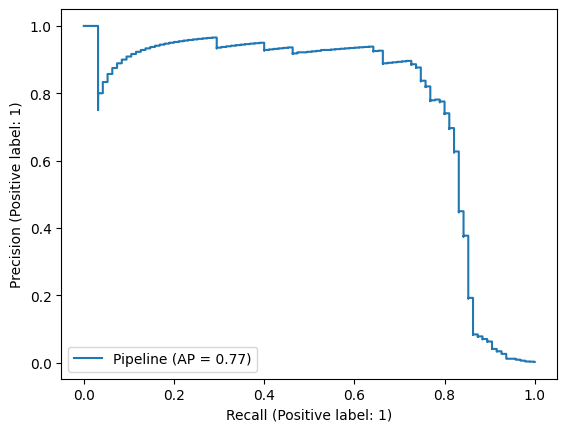

In [ ]:
from sklearn.metrics import PrecisionRecallDisplay, average_precision_score

PrecisionRecallDisplay.from_estimator(hgb_pipe,
                                      X_test,
                                      y_test);

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [ ]:
train_ds = Dataset(X_train, label=y_train, cat_features=[])
test_ds = Dataset(X_test, label=y_test, cat_features=[])

evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, hgb_pipe)
suite_result.show()
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json

# Passed the test

deepchecks - WARNING - Cannot use model's built-in feature importance on a Scikit-learn Pipeline, using permutation feature importance calculation instead
deepchecks - WARNING - Features importance was not calculated:
Skipping permutation importance calculation: calculation was projected to finish in 175 seconds, but timeout was configured to 120 seconds
Skipping permutation importance calculation: calculation was projected to finish in 175 seconds, but timeout was configured to 120 seconds


<!--
 ~ ----------------------------------------------------------------------------
 ~ Copyright (C) 2021-2023 Deepchecks (https://www.deepchecks.com)
 ~
 ~ This file is part of Deepchecks.
 ~ Deepchecks is distributed under the terms of the GNU Affero General
 ~ Public License (version 3 or later).
 ~ You should have received a copy of the GNU Affero General Public License
 ~ along with Deepchecks. If not, see .
 ~ ----------------------------------------------------------------------------
 ~
-->
<!DOCTYPE html>
 
 
 
 Model Evaluation Suite

#### HGB Classifier with SMOTE

***i. Model Training***

In [ ]:
# Define the number of majority and minority samples to be used for resampling
y_train_majority_number = int(y_train.value_counts()[0] * 0.90)
y_train_minority_number = int(y_train.value_counts()[1] * 1.10)

# Define the resampling techniques
over = SMOTE(sampling_strategy={1: y_train_minority_number})
under = RandomUnderSampler(sampling_strategy={0: y_train_majority_number})

# Define the operations/steps for the pipeline
operations = [
    ('o', over),
    ('u', under),
    ('mlp', HistGradientBoostingClassifier(max_iter=10000, max_depth=2,
        random_state=137, max_bins=9))
]

# Create the pipeline
hgb_pipe2 = imbpipeline(steps = operations)

# Fit the pipeline to the resampled data
hgb_pipe2.fit(X_train, y_train)

Pipeline(steps=[('o', SMOTE(sampling_strategy={1: 415})),
                ('u', RandomUnderSampler(sampling_strategy={0: 198136})),
                ('mlp',
                 HistGradientBoostingClassifier(max_bins=9, max_depth=2,
                                                max_iter=10000,
                                                random_state=137))])

***ii. Prediction and Model Evaluating and Tuning***

In [ ]:
eval_metric(hgb_pipe2, X_train, y_train, X_test, y_test)

Test_Set
[[55027    11]
 [   25    70]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     55038
           1       0.86      0.74      0.80        95

    accuracy                           1.00     55133
   macro avg       0.93      0.87      0.90     55133
weighted avg       1.00      1.00      1.00     55133

Matthews score: 0.7976652723568481

Train_Set
[[220128     24]
 [    79    299]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    220152
           1       0.93      0.79      0.85       378

    accuracy                           1.00    220530
   macro avg       0.96      0.90      0.93    220530
weighted avg       1.00      1.00      1.00    220530

Matthews score: 0.8554801295212752


***iii. Plot Precision and Recall Curve***


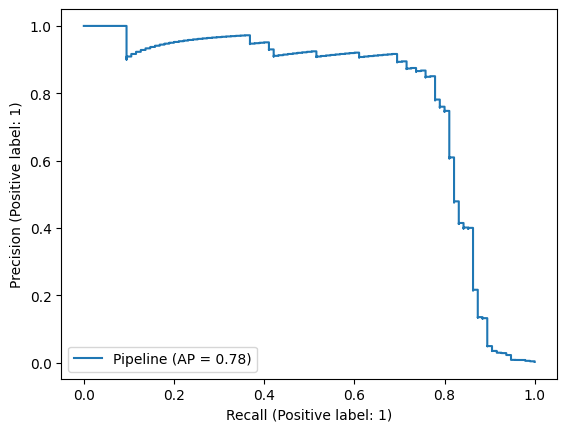

In [ ]:
from sklearn.metrics import PrecisionRecallDisplay, average_precision_score

PrecisionRecallDisplay.from_estimator(hgb_pipe2,
                                      X_test,
                                      y_test);

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [ ]:
train_ds = Dataset(X_train, label=y_train, cat_features=[])
test_ds = Dataset(X_test, label=y_test, cat_features=[])

evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, hgb_pipe2)
suite_result.show()
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json

# Passed the test

deepchecks - WARNING - Cannot use model's built-in feature importance on a Scikit-learn Pipeline, using permutation feature importance calculation instead
deepchecks - INFO - Calculating permutation feature importance. Expected to finish in 110 seconds
INFO:deepchecks:Calculating permutation feature importance. Expected to finish in 110 seconds


<!--
 ~ ----------------------------------------------------------------------------
 ~ Copyright (C) 2021-2023 Deepchecks (https://www.deepchecks.com)
 ~
 ~ This file is part of Deepchecks.
 ~ Deepchecks is distributed under the terms of the GNU Affero General
 ~ Public License (version 3 or later).
 ~ You should have received a copy of the GNU Affero General Public License
 ~ along with Deepchecks. If not, see .
 ~ ----------------------------------------------------------------------------
 ~
-->
<!DOCTYPE html>
 
 
 
 Model Evaluation Suite

#### HGB Classifier Conclusion

In [88]:
model = hgb_pipe

y_pred = model.predict(X_test)
y_pred_proba= model.predict_proba(X_test)[:,1]

hgb_AP = average_precision_score(y_test, y_pred_proba)
hgb_rec = recall_score(y_test, y_pred)
hgb_f1 = f1_score(y_test,y_pred)
hgb_matthews =  matthews_corrcoef(y_test, y_pred)

hgb_AP,hgb_rec,hgb_f1,hgb_matthews

(0.7729415712514944,
 0.7473684210526316,
 0.8068181818181818,
 0.8090832566208127)

### Deep Learning

In the final step, you will make classification with Neural Network which is a Deep Learning algorithm.

Neural networks are a series of algorithms that mimic the operations of a human brain to recognize relationships between vast amounts of data. They are used in a variety of applications in financial services, from forecasting and marketing research to fraud detection and risk assessment.

A neural network contains layers of interconnected nodes. Each node is a perceptron and is similar to a multiple linear regression. The perceptron feeds the signal produced by a multiple linear regression into an activation function that may be nonlinear.

In a multi-layered perceptron (MLP), perceptrons are arranged in interconnected layers. The input layer collects input patterns. The output layer has classifications or output signals to which input patterns may map.

Hidden layers fine-tune the input weightings until the neural network’s margin of error is minimal. It is hypothesized that hidden layers extrapolate salient features in the input data that have predictive power regarding the outputs.

You will discover **[how to create](https://towardsdatascience.com/building-our-first-neural-network-in-keras-bdc8abbc17f5)** your deep learning neural network model in Python using **[Keras](https://keras.io/about/)**. Keras is a powerful and easy-to-use free open source Python library for developing and evaluating deep learning models.

- The steps you are going to cover for this algorithm are as follows:

   *i. Import Libraries*
   
   *ii. Define Model*
    
   *iii. Compile Model*
   
   *iv. Fit Model*
   
   *v. Prediction and Model Evaluating*
   
   *vi. Plot Precision and Recall Curve*

#### Neural Network

***i. Import Libraries***

In [179]:
# split the features and target
X = df.drop('Class', axis=1)
y = df['Class'].values

In [180]:
# split the data as train, validation and test data
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    stratify=y,
                                                    test_size=0.15,
                                                    random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train,
                                                  y_train,
                                                  stratify=y_train,
                                                  test_size=0.1,
                                                  random_state=42)

In [181]:
scaler = MinMaxScaler() # Minmax scaler mostly used for deep learning as a rule of thumb
# scale the data; fit_transform for train, transform val and test
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

In [92]:
# https://medium.com/analytics-vidhya/custom-metrics-for-keras-tensorflow-ae7036654e05
# this custom metric ONLY works on binary classification problems.
from keras import backend as K

def matthews_correlation_coefficient(y_true, y_pred):
    tp = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    tn = K.sum(K.round(K.clip((1 - y_true) * (1 - y_pred), 0, 1)))
    fp = K.sum(K.round(K.clip((1 - y_true) * y_pred, 0, 1)))
    fn = K.sum(K.round(K.clip(y_true * (1 - y_pred), 0, 1)))

    num = tp * tn - fp * fn
    den = (tp + fp) * (tp + fn) * (tn + fp) * (tn + fn)
    return num / K.sqrt(den + K.epsilon())

***ii. Define Model***

In [97]:
tf.random.set_seed(42)

model2 = Sequential()

model2.add(Dense(28, activation="relu"))
model2.add(Dense(14, activation="relu"))
model2.add(Dense(8, activation="relu"))
model2.add(Dense(1, activation="sigmoid"))

NUM_EPOCHS = 1000

opt = Adam(learning_rate=0.001)

model2.compile(
    optimizer = opt,
    loss=tf.keras.losses.BinaryFocalCrossentropy(gamma=2.0, from_logits=True),
    metrics= [tf.keras.metrics.AUC(name="PR AUC", curve='PR')] # [matthews_correlation_coefficient]
)

In [98]:
early_stop = EarlyStopping(monitor="val_loss",
                           mode="auto",
                           verbose=1,
                           patience=20,
                           restore_best_weights = True)

In [99]:
# import class_weight from sklearn to balance the classes
from sklearn.utils import class_weight

class_weights = class_weight.compute_class_weight('balanced',
                                                  classes=np.unique(y_train),
                                                  y=y_train)

class_weights = {0: class_weights[0], 1: class_weights[1]}
class_weights

{0: 0.5008597798773508, 1: 291.2720994475138}

***iv. Fit Model***

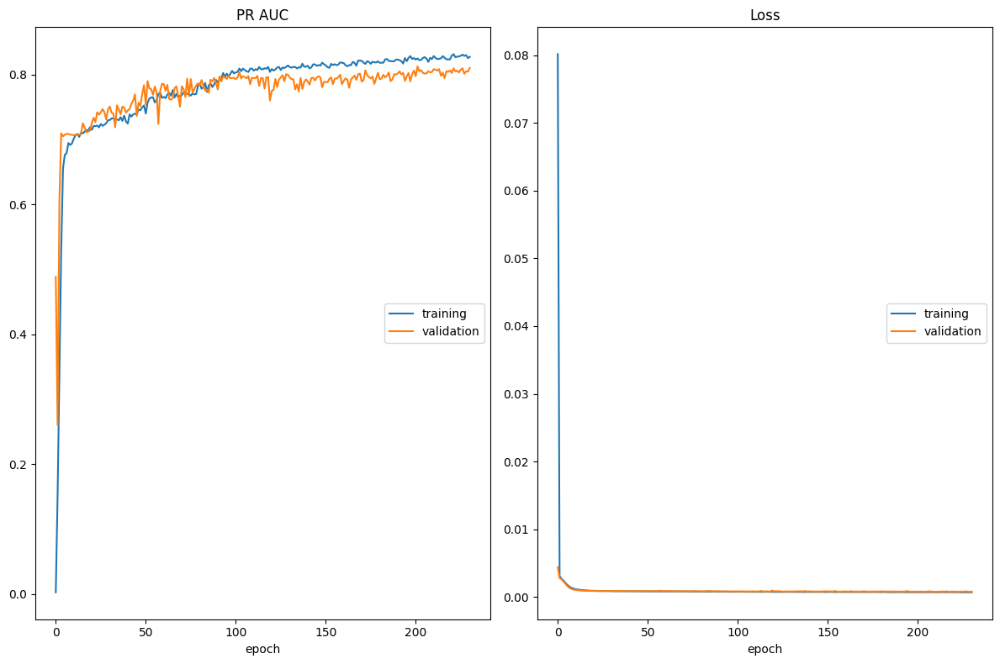

PR AUC
	training         	 (min:    0.002, max:    0.831, cur:    0.827)
	validation       	 (min:    0.260, max:    0.812, cur:    0.810)
Loss
	training         	 (min:    0.001, max:    0.080, cur:    0.001)
	validation       	 (min:    0.001, max:    0.004, cur:    0.001)
103/103 [==============================] - 1s 10ms/step - loss: 7.0165e-04 - PR AUC: 0.8271 - val_loss: 7.9242e-04 - val_PR AUC: 0.8099
Epoch 231: early stopping


In [100]:
model2.fit(x=X_train,
          y=y_train,
          validation_data=(X_val, y_val),
          batch_size=2048,
          epochs=NUM_EPOCHS,
          verbose=1,
          callbacks=[early_stop, PlotLossesKerasTF()])
         # class_weight=class_weights)

***v. Prediction and Model Evaluating***

<Axes: >

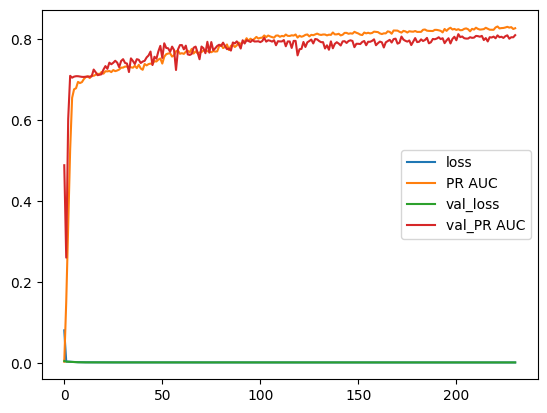

In [101]:
loss_df = pd.DataFrame(model2.history.history)
loss_df.plot()

In [106]:
y_pred_proba = model2.predict(X_test)

1293/1293 [==============================] - 6s 4ms/step


In [110]:
y_pred = (y_pred_proba > .25).astype("int32")
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[41271     8]
 [   11    60]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     41279
           1       0.88      0.85      0.86        71

    accuracy                           1.00     41350
   macro avg       0.94      0.92      0.93     41350
weighted avg       1.00      1.00      1.00     41350



***vi. Plot Precision and Recall Curve***

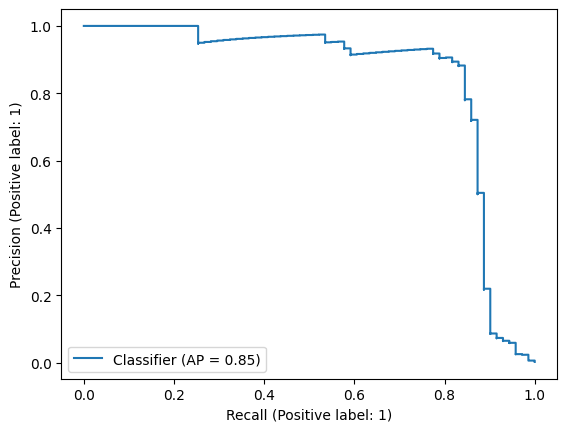

In [111]:
PrecisionRecallDisplay.from_predictions(y_test,y_pred_proba)

In [112]:
ANN_AP = average_precision_score(y_test, y_pred_proba)
ANN_f1 = f1_score(y_test, y_pred)
ANN_recall = recall_score(y_test, y_pred)
ANN_matthews =  matthews_corrcoef(y_test, y_pred)
ANN_AP, ANN_f1, ANN_recall, ANN_matthews

(0.8474089474133685,
 0.8633093525179857,
 0.8450704225352113,
 0.8632810922647761)

#### Autoencoder Anomaly Detection

***i. Import Libraries***

In [113]:
df_anomaly = df0[df0.Class == 1]
df_normal = df0[df0.Class == 0]

In [114]:
# Removing Time columns because of the cardinality.
df_normal.drop(columns=['Time'],inplace=True)
df_anomaly.drop(columns=['Time'],inplace=True)

In [115]:
display(df_normal.shape)
df_normal.drop_duplicates(inplace=True)
df_normal.reset_index(drop=True,inplace=True)
display(df_normal.shape)

display(df_anomaly.shape)
df_anomaly.drop_duplicates(inplace=True)
df_anomaly.reset_index(drop=True,inplace=True)
display(df_anomaly.shape)

(284315, 30)

(275190, 30)

(492, 30)

(473, 30)

In [116]:
# Applying log transformation to the Amount column since it is highly right-skewed.
# We are using np.log1p since the Amount column minimum is 0.
display(df_normal.Amount.skew())
df_normal['Amount'] = np.log1p(df_normal['Amount'])
display(df_normal.Amount.skew())

16.866718730563512

0.1395260148138248

In [117]:
display(df_anomaly.Amount.skew())
df_anomaly['Amount'] = np.log1p(df_anomaly['Amount'])
display(df_anomaly.Amount.skew())

3.7244782527095226

0.30783741384828084

In [118]:
# We only use non_fraud data to train our Autoencoder
# split the features and target
X = df_normal.drop('Class', axis=1)
y = df_normal['Class'].values

In [119]:
# split the data as train, validation and test data
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    # stratify=y,
                                                    test_size=0.15,
                                                    random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train,
                                                  y_train,
                                                  # stratify=y_train,
                                                  test_size=0.1,
                                                  random_state=42)

In [120]:
capper = OutlierCapping(factor=3)
# scale the data; fit_transform for train, transform val and test
X_train = capper.fit_transform(X_train)
X_val = capper.transform(X_val)
X_test = capper.transform(X_test)

In [121]:
# RobutScaler and StandardScaler did not give good results.
scaler = MinMaxScaler()
# scale the data; fit_transform for train, transform val and test
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

In [122]:
X_anomaly = df_anomaly.drop('Class', axis=1)

In [123]:
X_anomaly = capper.transform(X_anomaly)
X_anomaly = scaler.transform(X_anomaly)

***ii. Define Model***

In [124]:
class AnomalyDetector(tf.keras.Model):
    """
    Autoencoder model.

    Args:
        n_features: The number of features in the input data.
    """

    def __init__(self, n_features):
        super(AnomalyDetector, self).__init__()
        self.encoder = tf.keras.Sequential([
            tf.keras.layers.Dense(64, activation="elu", name="encoder_2"),
            tf.keras.layers.Dense(32, activation="elu", name="encoder_3"),
            tf.keras.layers.Dense(16, activation="elu", name="encoder_4"),
            tf.keras.layers.Dense(8, activation="elu", name="encoder_5"),
            ActivityRegularization(l1=1e-3)
        ])

        self.decoder = tf.keras.Sequential([
            tf.keras.layers.Dense(8, activation="elu", name="decoder_1"),
            tf.keras.layers.Dense(16, activation="elu", name="decoder_2"),
            tf.keras.layers.Dense(32, activation="elu", name="decoder_3"),
            tf.keras.layers.Dense(64, activation="elu", name="decoder_4"),
            tf.keras.layers.Dense(n_features, activation="relu", name="decoder_5"),
        ])

    def call(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

In [125]:
n_features = len(X.columns)

In [126]:
n_features

29

In [127]:
autoencoder = AnomalyDetector(n_features)
opt = tf.keras.optimizers.Adam(learning_rate=0.001)

***iii. Compile Model***

In [128]:
autoencoder.compile(
    optimizer=opt,
    loss="mean_squared_error")
earlystopper = EarlyStopping(monitor='val_loss', patience=5, verbose=1, restore_best_weights=True)

***iv. Fit Model***

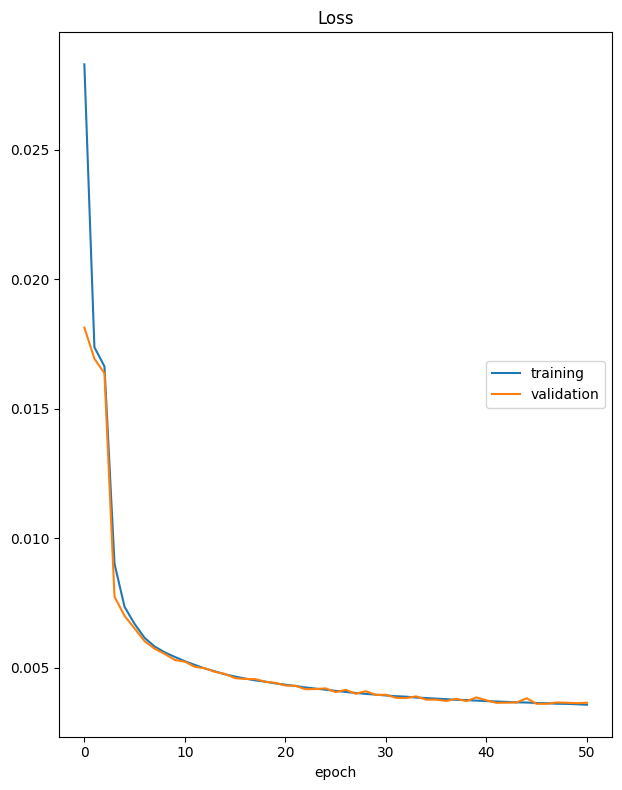

Loss
	training         	 (min:    0.004, max:    0.028, cur:    0.004)
	validation       	 (min:    0.004, max:    0.018, cur:    0.004)
1645/1645 [==============================] - 11s 7ms/step - loss: 0.0036 - val_loss: 0.0037
Epoch 51: early stopping


In [129]:
history = autoencoder.fit(
        X_train,
        X_train,
        epochs=1000,
        batch_size=128,
        validation_data=(X_val, X_val),
        verbose = 1,
        callbacks=[earlystopper, PlotLossesKerasTF()],
        shuffle=True)

***v. Prediction and Model Evaluating***

<Axes: >

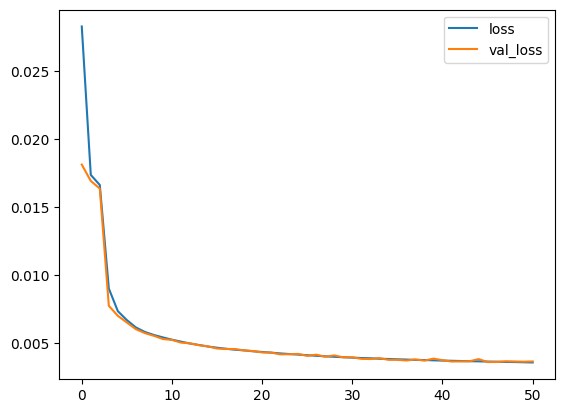

In [130]:
loss_df = pd.DataFrame(autoencoder.history.history)
loss_df.plot()

In [131]:
train_data_predictions = autoencoder.predict(X_train)   # predict reconstruction
mse_train = np.mean(np.power(X_train- train_data_predictions, 2), axis=1)   # calculates MSE between test data and reconstruction

6579/6579 [==============================] - 13s 2ms/step


In [132]:
test_data_predictions = autoencoder.predict(X_test)   # predict reconstruction
mse_test = np.mean(np.power(X_test- test_data_predictions, 2), axis=1)   # calculates MSE between test data and reconstruction

1290/1290 [==============================] - 2s 2ms/step


In [133]:
anomaly_data_predictions = autoencoder.predict(X_anomaly)   # predict reconstruction
mse_anomaly = np.mean(np.power(X_anomaly - anomaly_data_predictions, 2), axis=1)   # calculates MSE between anomaly data and reconstruction

15/15 [==============================] - 0s 2ms/step


In [134]:
df_mse_train = pd.DataFrame(mse_train)
df_mse_train['Class'] = 0

In [135]:
df_mse_test = pd.DataFrame(mse_test)
df_mse_test['Class'] = 0

In [136]:
df_mse_anomaly = pd.DataFrame(mse_anomaly)
df_mse_anomaly['Class'] = 1

##### Train - Anomaly

In [137]:
df_autoencoder_predictions = pd.concat([df_mse_anomaly,df_mse_train])

In [138]:
df_autoencoder_predictions.reset_index(drop=True,inplace=True)
df_autoencoder_predictions.rename(columns={0: 'MSE'}, inplace=True)

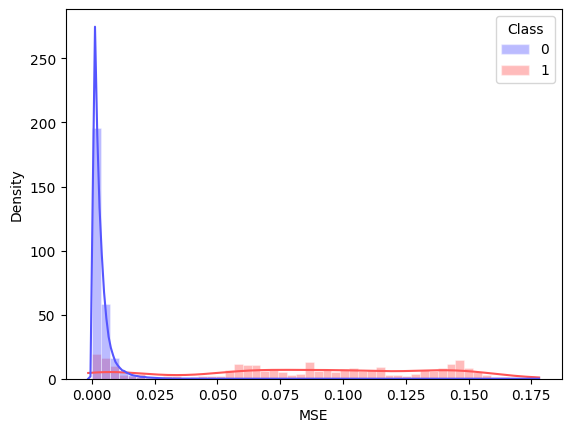

In [139]:
sns.histplot(df_autoencoder_predictions, x='MSE', bins=50, hue='Class', stat='density', common_norm=False, kde=True, kde_kws=dict(cut=3), alpha=.4, palette='seismic', edgecolor=(1, 1, 1, .4));


<Axes: xlabel='Class', ylabel='MSE'>

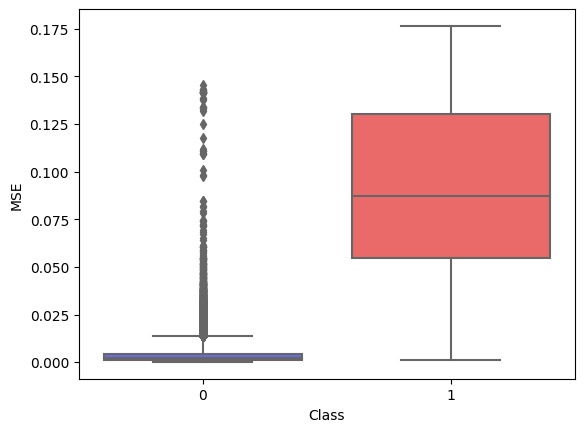

In [140]:
 sns.boxplot(x="Class", y='MSE', data=df_autoencoder_predictions, palette='seismic', whis =3)

In [141]:
np.percentile(mse_anomaly,5)

0.0026619721613002087

In [142]:
import plotly.graph_objects as go

# Generate thresholds
thresholds = np.linspace(0, mse_anomaly.mean(), num=150)

# Calculate AP, precision, and recall scores for each threshold
f1_scores = []
precision_scores = []
recall_scores = []

for threshold in thresholds:
    df_autoencoder_predictions['predicted'] = df_autoencoder_predictions['MSE'].apply(lambda x: 1 if x > threshold else 0)
    y_true = df_autoencoder_predictions['Class']
    y_pred = df_autoencoder_predictions['predicted']

    f1 = f1_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)

    f1_scores.append(f1)
    precision_scores.append(precision)
    recall_scores.append(recall)

df_scores = pd.DataFrame({'Threshold': thresholds,
                          'F1 Score': f1_scores,
                          'Precision': precision_scores,
                          'Recall': recall_scores})

In [143]:

# Create line plot using graph_objects
fig = go.Figure()

fig.add_trace(go.Scatter(x=thresholds, y=f1_scores, mode='lines', name='F1 Score'))
fig.add_trace(go.Scatter(x=thresholds, y=precision_scores, mode='lines', name='Precision'))
fig.add_trace(go.Scatter(x=thresholds, y=recall_scores, mode='lines', name='Recall'))

fig.update_layout(
    title='Scores for Different Thresholds',
    xaxis_title='Threshold',
    yaxis_title='Score',
    legend=dict(x=0.7, y=0.9),
    width=800,
    height=500
)

# # Add annotation for the scores
# fig.add_annotation(
#     x=thresholds[0],  # Initial position of the annotation
#     y=f1_scores[0],
#     text=f'F1: {f1_scores[0]:.4f}, Precision: {precision_scores[0]:.4f}, Recall: {recall_scores[0]:.4f}',
#     showarrow=False,
#     font=dict(size=12)
# )

# Update the annotation position and text based on mouse hover
fig.update_layout(
    hovermode='x',
    hoverdistance=-1,  # Ensures the hover is always on the line
)

fig.update_traces(hovertemplate=None)  # Disable default hover template

fig.show(renderer='colab')

In [144]:
# The row where the f1 score is the highest
df_scores.loc[df_scores['F1 Score'].idxmax()]

Threshold   0.053
F1 Score    0.793
Precision   0.831
Recall      0.759
Name: 95, dtype: float64

In [145]:
optimal_threshold = df_scores.loc[df_scores['F1 Score'].idxmax()].Threshold

In [146]:
df_autoencoder_predictions['predicted'] = df_autoencoder_predictions['MSE'].apply(lambda x: 1 if x > optimal_threshold else 0)

In [147]:
y_true = df_autoencoder_predictions['Class']
y_pred = df_autoencoder_predictions['predicted']

In [148]:
print(confusion_matrix(y_true, y_pred))
print(classification_report(y_true, y_pred))
print(matthews_corrcoef(y_true, y_pred))

[[210446     73]
 [   114    359]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    210519
           1       0.83      0.76      0.79       473

    accuracy                           1.00    210992
   macro avg       0.92      0.88      0.90    210992
weighted avg       1.00      1.00      1.00    210992

0.7937454595161494


***vi. Plot Precision and Recall Curve***

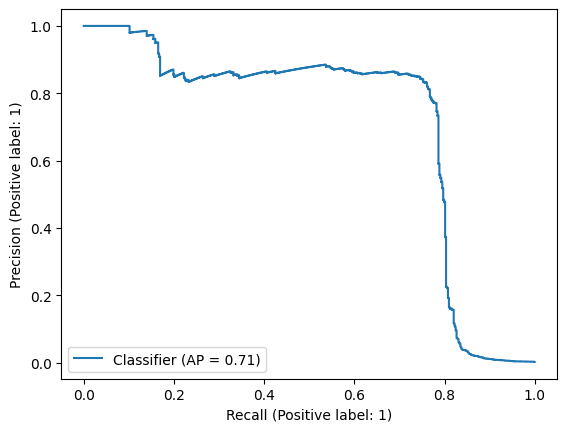

In [149]:
PrecisionRecallDisplay.from_predictions(y_true,df_autoencoder_predictions['MSE'])

##### Test - Anomaly

In [150]:
df_autoencoder_predictions = pd.concat([df_mse_anomaly,df_mse_test])

In [151]:
df_autoencoder_predictions.reset_index(drop=True,inplace=True)
df_autoencoder_predictions.rename(columns={0: 'MSE'}, inplace=True)

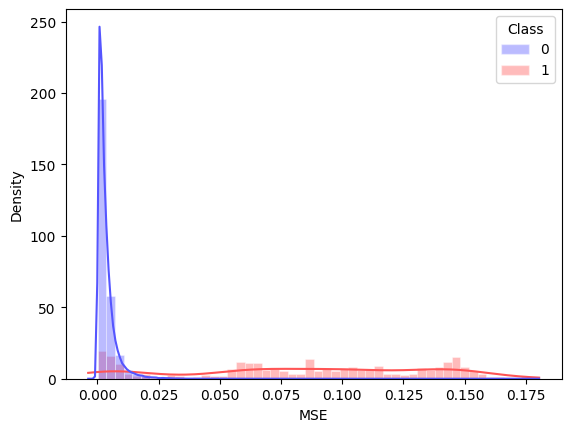

In [152]:
sns.histplot(df_autoencoder_predictions, x='MSE', bins=50, hue='Class', stat='density', common_norm=False, kde=True, kde_kws=dict(cut=3), alpha=.4, palette='seismic', edgecolor=(1, 1, 1, .4));


<Axes: xlabel='Class', ylabel='MSE'>

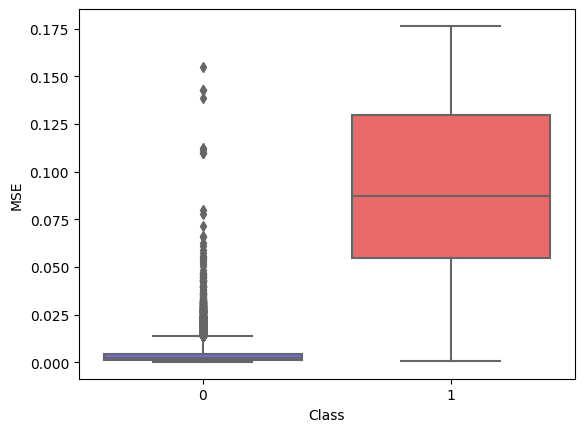

In [153]:
 sns.boxplot(x="Class", y='MSE', data=df_autoencoder_predictions, palette='seismic', whis =3)

In [154]:
df_autoencoder_predictions['predicted'] = df_autoencoder_predictions['MSE'].apply(lambda x: 1 if x > optimal_threshold else 0)

In [155]:
y_true = df_autoencoder_predictions['Class']
y_pred = df_autoencoder_predictions['predicted']

In [156]:
print(confusion_matrix(y_true, y_pred))
print(classification_report(y_true, y_pred))
print(matthews_corrcoef(y_true, y_pred))

[[41259    20]
 [  114   359]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     41279
           1       0.95      0.76      0.84       473

    accuracy                           1.00     41752
   macro avg       0.97      0.88      0.92     41752
weighted avg       1.00      1.00      1.00     41752

0.8463948741921732


***vi. Plot Precision and Recall Curve***

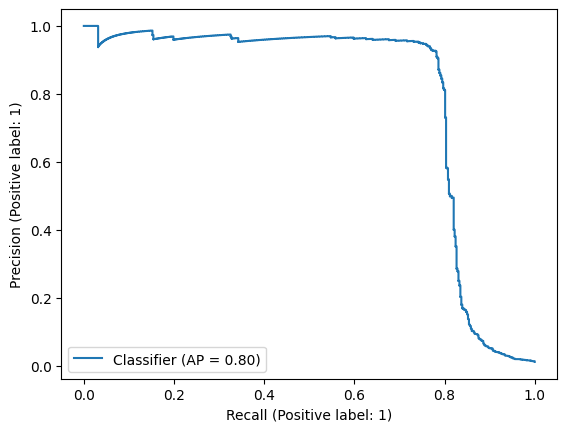

In [157]:
PrecisionRecallDisplay.from_predictions(y_true,df_autoencoder_predictions['MSE'])

In [160]:
AE_AP = average_precision_score(y_true, df_autoencoder_predictions['MSE'])
AE_f1 = f1_score(y_true, y_pred)
AE_recall = recall_score(y_true, y_pred)
AE_matthews =  matthews_corrcoef(y_true, y_pred)
AE_AP, AE_f1, AE_recall, AE_matthews

(0.7962427656800392, 0.8427230046948357, 0.758985200845666, 0.8463948741921732)

## 4. Comparison of Models

In [165]:
compare = pd.DataFrame({"Model": ["Logistic Regression", 'SVM','RF', "XGBoost", 'LightGBM', 'MLP', 'HGB', 'DL-ANN', 'Autoencoder'],
                        "F1": [log_f1, svm_f1, rf_f1, xgba_f1, lgbm_f1, mlp_f1, hgb_f1, ANN_f1, AE_f1],
                        "Recall": [log_rec, svm_rec, rf_rec, xgba_rec, lgbm_rec, mlp_rec, hgb_rec, ANN_recall, AE_recall],
                        "AP": [log_AP, svm_AP, rf_AP, xgba_AP, lgbm_AP, mlp_AP, hgb_AP, ANN_AP, AE_AP],
                        "Matthews": [log_matthews, svm_matthews, rf_matthews, xgba_matthews, lgbm_matthews, mlp_matthews, hgb_matthews, ANN_matthews, AE_matthews]})

In [210]:
compare.to_csv('compare.csv',index=False)

In [176]:
compare = compare.sort_values(by="Recall", ascending=False)
compare.style.background_gradient(cmap = 'cmc.batlow')

,Model,F1,Recall,AP,Matthews
7,DL-ANN,0.863309,0.845070,0.847409,0.863281
3,XGBoost,0.806283,0.810526,0.818408,0.805958
4,LightGBM,0.802083,0.810526,0.802400,0.801782
0,Logistic Regression,0.797872,0.789474,0.790519,0.797572
5,MLP,0.845714,0.778947,0.826002,0.848604
1,SVM,0.840909,0.778947,0.799563,0.843337
8,Autoencoder,0.842723,0.758985,0.796243,0.846395
2,RF,0.813559,0.757895,0.766186,0.815471
6,HGB,0.806818,0.747368,0.772942,0.809083


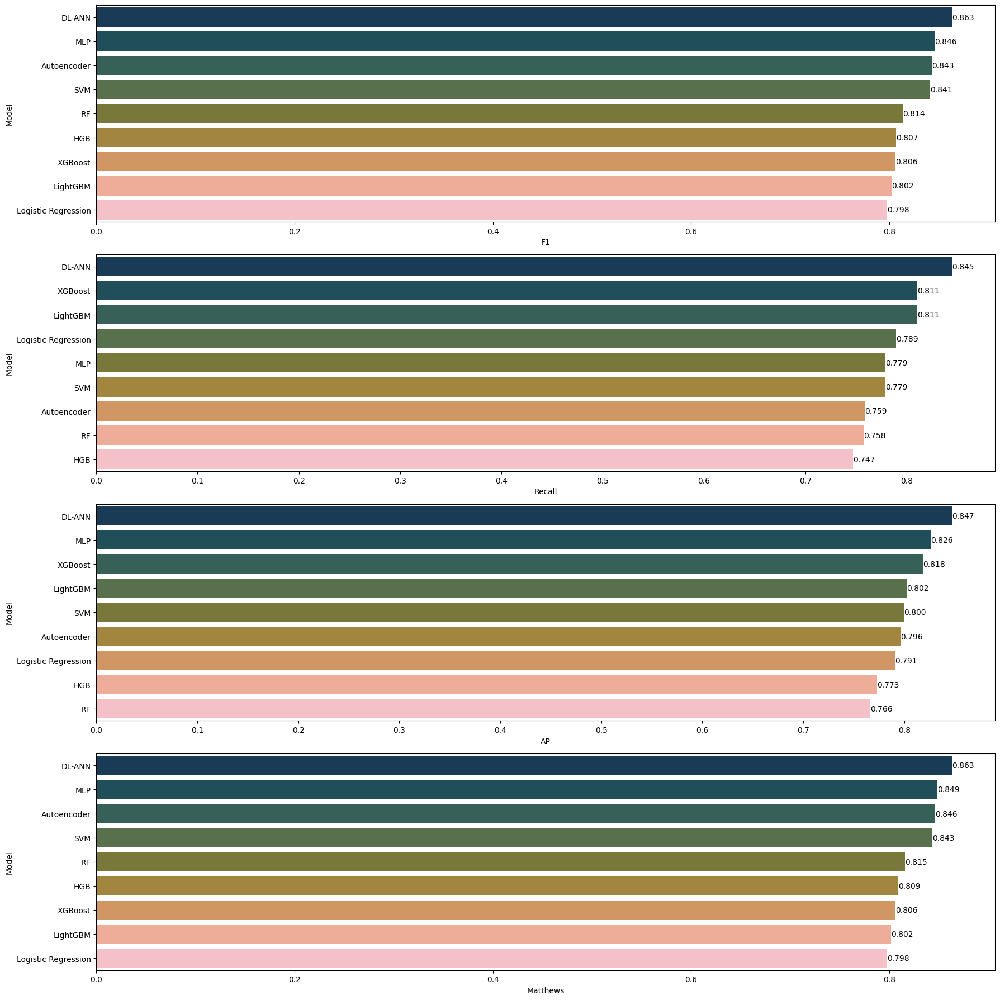

In [234]:
plt.figure(figsize=(18,18))
plt.subplot(4,1,1)
compare = compare.sort_values(by="F1", ascending=False)
ax=sns.barplot(x="F1", y="Model", data=compare, palette="cmc.batlow")
ax.bar_label(ax.containers[0],fmt="%.3f")

plt.subplot(4,1,2)
compare = compare.sort_values(by="Recall", ascending=False)
ax=sns.barplot(x="Recall", y="Model", data=compare, palette="cmc.batlow")
ax.bar_label(ax.containers[0],fmt="%.3f")

plt.subplot(4,1,3)
compare = compare.sort_values(by="AP", ascending=False)
ax=sns.barplot(x="AP", y="Model", data=compare, palette="cmc.batlow")
ax.bar_label(ax.containers[0],fmt="%.3f")

plt.subplot(4,1,4)
compare = compare.sort_values(by="Matthews", ascending=False)
ax=sns.barplot(x="Matthews", y="Model", data=compare, palette="cmc.batlow")
ax.bar_label(ax.containers[0],fmt="%.3f")

plt.tight_layout()
plt.show();

## 4. Model Deployement

### Save and Export the Best Model


In [178]:
model2.save('model_tf',save_format='tf')

### Save and Export Variables

In [207]:
# Since we changed the scaler in autoencoder we are rebuilding the scaler for ANN
X = df.drop('Class', axis=1)
y = df['Class'].values

In [208]:
# split the data as train, validation and test data
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    stratify=y,
                                                    test_size=0.15,
                                                    random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train,
                                                  y_train,
                                                  stratify=y_train,
                                                  test_size=0.1,
                                                  random_state=42)

In [209]:
scaler = MinMaxScaler() # Minmax scaler mostly used for deep learning as a rule of thumb
# scale the data; fit_transform for train, transform val and test
X_train = scaler.fit_transform(X_train)

In [189]:
import pickle
scalerfile = 'ann_scaler.sav'
pickle.dump(scaler, open(scalerfile, 'wb'))

In [217]:
optimal_threshold = 0.25

# Save the value to a file
with open('optimal_threshold.pkl', 'wb') as f:
    pickle.dump(optimal_threshold, f)

### Load and Predict

#### Loading

In [191]:
# Load the saved model
loaded_model = tf.keras.models.load_model('model_tf')

In [219]:
# Load scaler
scalerfile = 'ann_scaler.sav'
scaler = pickle.load(open(scalerfile, 'rb'))

In [226]:
# Load the value from the file
with open('optimal_threshold.pkl', 'rb') as f:
    loaded_threshold = pickle.load(f)
loaded_threshold

0.25

#### Prediction

In [227]:
# Fraud sample
sample = df[df.Class == 1].head(1).drop(columns=['Class'])

In [202]:
sample

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
534,-2.312,1.952,-1.610,3.998,-0.522,-1.427,-2.537,1.392,-2.770,-2.772,3.202,-2.900,-0.595,-4.289,0.390,-1.141,-2.830,-0.017,0.417,0.127,0.517,-0.035,-0.465,0.320,0.045,0.178,0.261,-0.143,0.000


In [212]:
# Non-fraud sample
sample2 = df[df.Class == 0].head(1).drop(columns=['Class'])

In [213]:
sample2

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
0,-1.360,-0.073,2.536,1.378,-0.338,0.462,0.240,0.099,0.364,0.091,-0.552,-0.618,-0.991,-0.311,1.468,-0.470,0.208,0.026,0.404,0.251,-0.018,0.278,-0.110,0.067,0.129,-0.189,0.134,-0.021,149.620


In [228]:
sample = scaler.transform(sample)

In [214]:
sample2 = scaler.transform(sample2)

In [229]:
loaded_model.predict(sample)

1/1 [==============================] - 0s 23ms/step


array([[0.61863804]], dtype=float32)

In [220]:
(loaded_model.predict(sample) > loaded_threshold).astype("int32")

1/1 [==============================] - 0s 65ms/step


array([[1]], dtype=int32)

In [222]:
loaded_model.predict(sample2)

1/1 [==============================] - 0s 127ms/step


array([[0.00068077]], dtype=float32)

In [224]:
(loaded_model.predict(sample2) > loaded_threshold).astype("int32")

1/1 [==============================] - 0s 130ms/step


array([[0]], dtype=int32)

___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___